##**Importing Libraries:-**

In [50]:
## Common Libraries:-
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
## Working with pipelining concept:-
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
## Models:-
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis


## **Load and Explore Dataset:-**

In [51]:
df = pd.read_csv('/content/Regensburg Pediatric Appendicitis.csv')

In [52]:
df.head()

,Age,BMI,Sex,Height,Weight,Length_of_Stay,Alvarado_Score,Paedriatic_Appendicitis_Score,Appendix_on_US,Appendix_Diameter,...,Bowel_Wall_Thickening,Conglomerate_of_Bowel_Loops,Ileus,Coprostasis,Meteorism,Enteritis,Gynecological_Findings,Management,Severity,Diagnosis
0,12.68,16.9,female,148.0,37.0,3.0,4.0,3.0,yes,7.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,conservative,uncomplicated,appendicitis
1,14.10,31.9,male,147.0,69.5,2.0,5.0,4.0,no,NaN,...,NaN,NaN,NaN,NaN,yes,NaN,NaN,conservative,uncomplicated,no appendicitis
2,14.14,23.3,female,163.0,62.0,4.0,5.0,3.0,no,NaN,...,NaN,NaN,NaN,NaN,yes,yes,NaN,conservative,uncomplicated,no appendicitis
3,16.37,20.6,female,165.0,56.0,3.0,7.0,6.0,no,NaN,...,NaN,NaN,NaN,NaN,NaN,yes,NaN,conservative,uncomplicated,no appendicitis
4,11.08,16.9,female,163.0,45.0,3.0,5.0,6.0,yes,7.0,...,NaN,NaN,NaN,NaN,NaN,yes,NaN,conservative,uncomplicated,appendicitis


In [53]:
## Initial data understanding
df.describe()

,Age,BMI,Height,Weight,Length_of_Stay,Alvarado_Score,Paedriatic_Appendicitis_Score,Appendix_Diameter,Body_Temperature,WBC_Count,Neutrophil_Percentage,Segmented_Neutrophils,RBC_Count,Hemoglobin,RDW,Thrombocyte_Count,CRP,US_Number
count,781.000000,755.000000,756.000000,779.000000,778.000000,730.000000,730.000000,498.000000,775.000000,776.000000,679.000000,54.000000,764.000000,764.000000,756.000000,764.000000,771.000000,760.000000
mean,11.346451,18.907012,148.017460,43.172542,4.284062,5.921918,5.253425,7.762651,37.404516,12.670683,71.791163,64.929630,4.799490,13.380497,13.180291,285.252618,31.386900,425.515789
std,3.529909,4.385331,19.732016,17.390984,2.574057,2.155972,1.958456,2.536671,0.903678,5.366525,14.463656,15.085025,0.499012,1.393271,4.538774,72.494373,57.433854,271.585211
min,0.000000,7.830000,53.000000,3.960000,1.000000,0.000000,0.000000,2.700000,26.900000,2.600000,27.200000,32.000000,3.620000,8.200000,11.200000,91.000000,0.000000,1.000000
25%,9.200000,15.725000,137.000000,29.500000,3.000000,4.000000,4.000000,6.000000,36.800000,8.200000,61.400000,54.500000,4.537500,12.600000,12.300000,236.000000,1.000000,198.750000
50%,11.440000,18.060000,149.650000,41.400000,3.000000,6.000000,5.000000,7.500000,37.200000,12.000000,75.500000,64.500000,4.780000,13.300000,12.700000,276.000000,7.000000,398.500000
75%,14.100000,21.180000,163.000000,54.000000,5.000000,8.000000,7.000000,9.100000,37.900000,16.200000,83.600000,77.500000,5.020000,14.000000,13.300000,330.000000,33.000000,613.250000
max,18.360000,38.160000,192.000000,103.000000,28.000000,10.000000,10.000000,17.000000,40.200000,37.700000,97.700000,91.000000,14.000000,36.000000,86.900000,708.000000,365.000000,992.000000


In [54]:
## check for mising values
df.isnull().sum()

Age                                   1
BMI                                  27
Sex                                   2
Height                               26
Weight                                3
Length_of_Stay                        4
Alvarado_Score                       52
Paedriatic_Appendicitis_Score        52
Appendix_on_US                        5
Appendix_Diameter                   284
Migratory_Pain                        9
Lower_Right_Abd_Pain                  8
Contralateral_Rebound_Tenderness     15
Coughing_Pain                        16
Nausea                                8
Loss_of_Appetite                     10
Body_Temperature                      7
WBC_Count                             6
Neutrophil_Percentage               103
Segmented_Neutrophils               728
Neutrophilia                         50
RBC_Count                            18
Hemoglobin                           18
RDW                                  26
Thrombocyte_Count                    18


Observation: Our data is not clean.

In [55]:
## Segregating numerical and categorical variables/features
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
categorical_columns = df.select_dtypes(include=['object']).columns

##**Data Pre-Processing:-**

In [56]:
# Fill numeric columns with the median value
for col in numerical_columns:
    df[col].fillna(df[col].median(), inplace=True)

# Fill categorical columns with the mode value
for col in categorical_columns:
    df[col].fillna(df[col].mode()[0], inplace=True)

##**Exploratory Data Analysis:-**

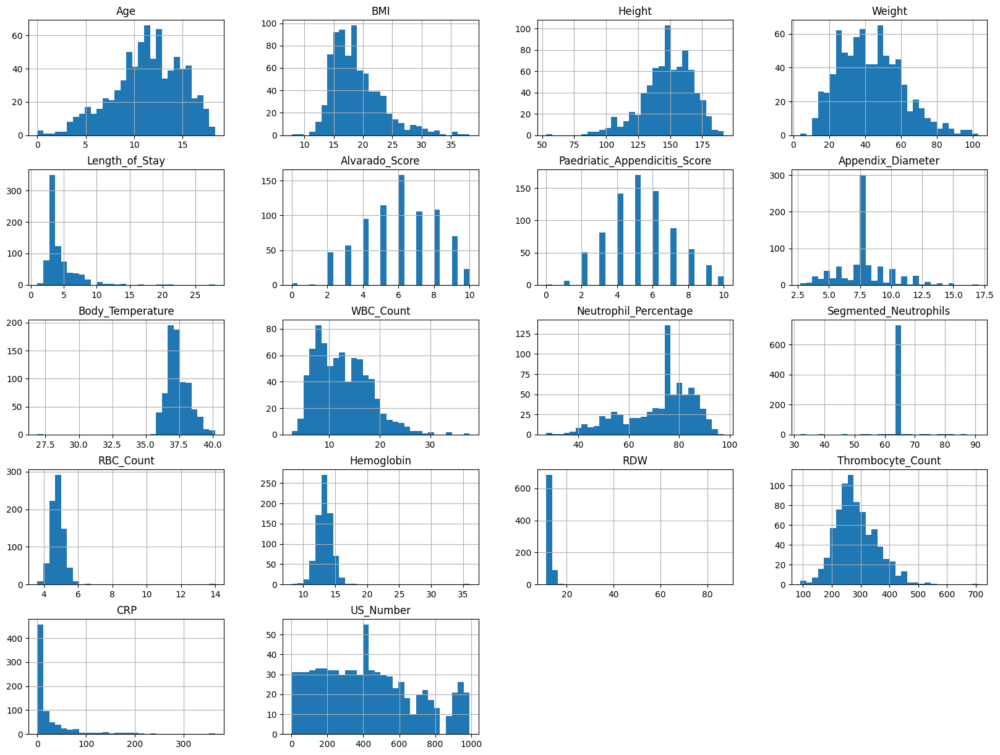

In [57]:
# Histograms for numerical features
df.hist(bins=30, figsize=(20, 15))
plt.show()

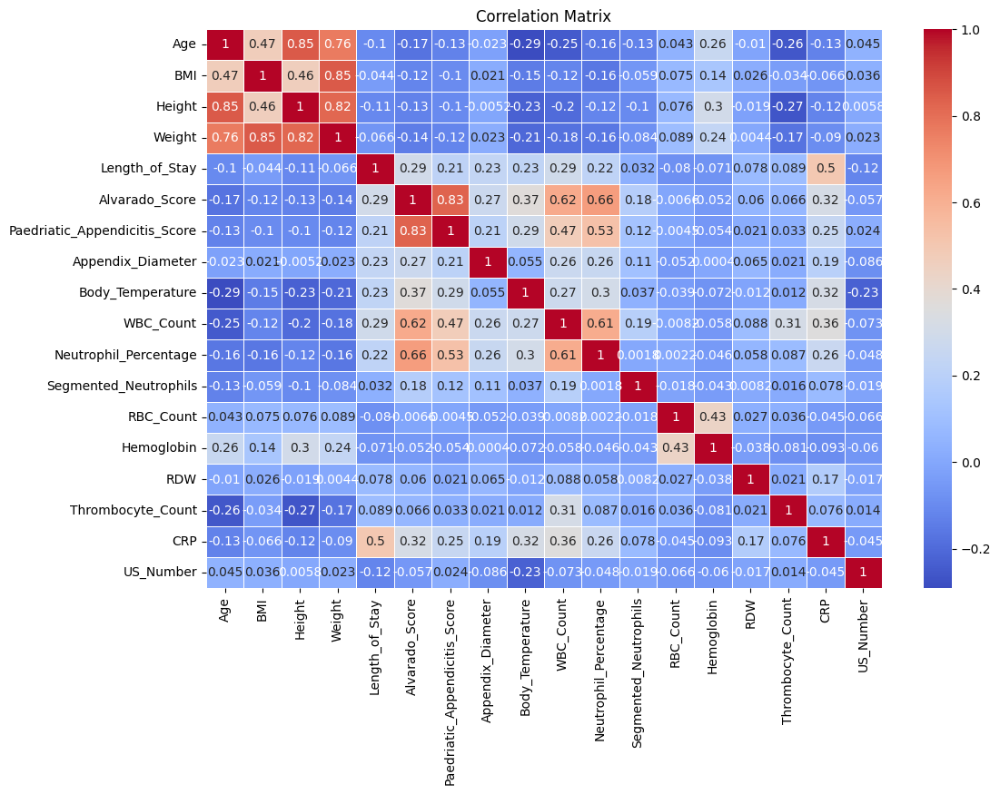

In [58]:
# Correlation matrix
corr_matrix = df[numerical_columns].corr()

# Heatmap of correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

##**Statistical Tests and Visualizations**

In [59]:
import scipy.stats as stats
def fit_and_evaluate_distribution(data, dist_name):
    dist = getattr(stats, dist_name)
    params = dist.fit(data)
    print(f'{dist_name} parameters: {params}')

    # Plotting the distribution fit
    x = np.linspace(data.min(), data.max(), 100)
    plt.figure(figsize=(10, 6))
    plt.hist(data, bins=20, density=True, alpha=0.6, color='g', edgecolor='black')
    plt.plot(x, dist.pdf(x, *params), 'r-', lw=2, label=f'{dist_name} fit')
    plt.title(f'{dist_name} Distribution Fit')
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.legend()
    plt.show()

In [ ]:
distribution_names = ['norm', 'expon', 'gamma', 'lognorm', 'beta']

Column: Age
norm parameters: (11.346570701841435, 3.5253942245451677)


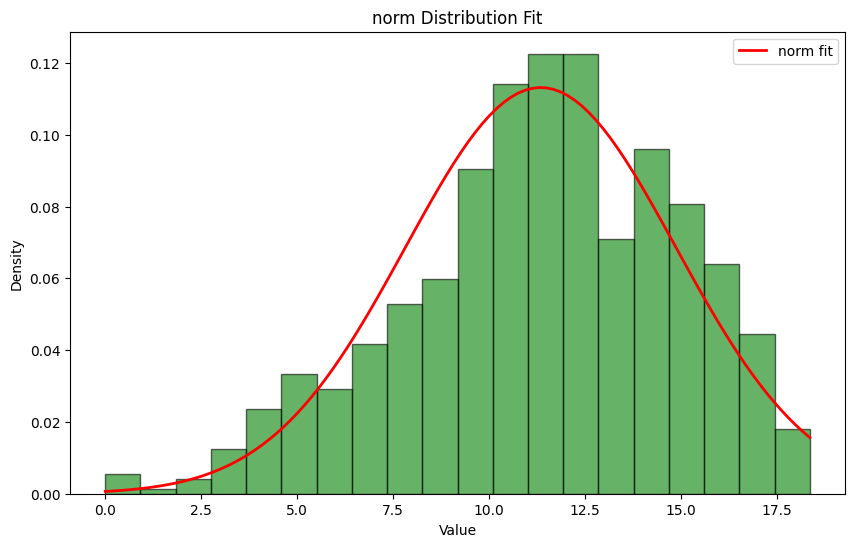

Column: BMI
norm parameters: (18.877767752289003, 4.308881914739695)


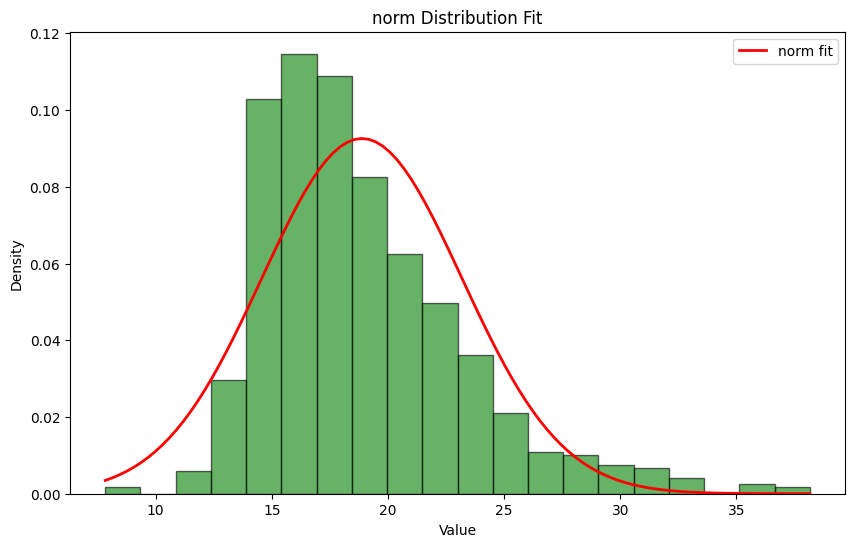

Column: Height
norm parameters: (148.0717391304348, 19.39059018617701)


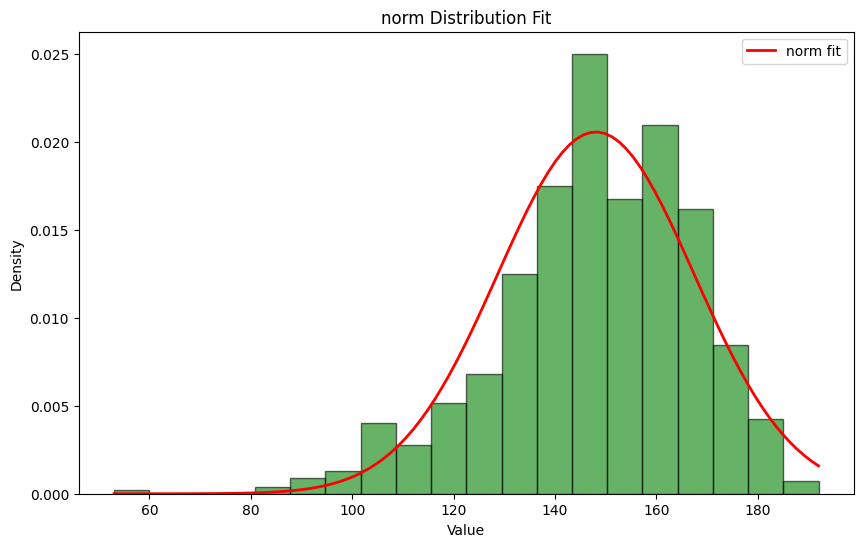

Column: Weight
norm parameters: (43.16574168797954, 17.346794382393526)


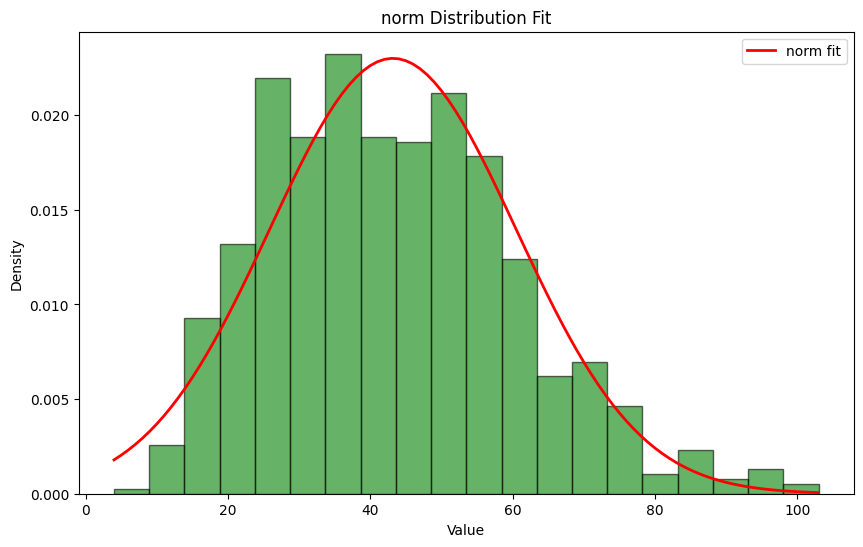

Column: Length_of_Stay
norm parameters: (4.2774936061381075, 2.5674491723336343)


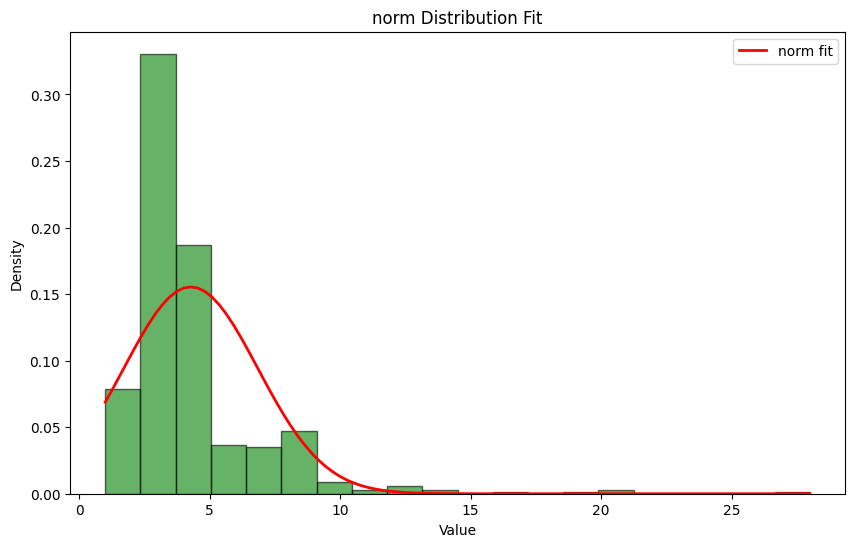

Column: Alvarado_Score
norm parameters: (5.927109974424552, 2.0817208565219585)


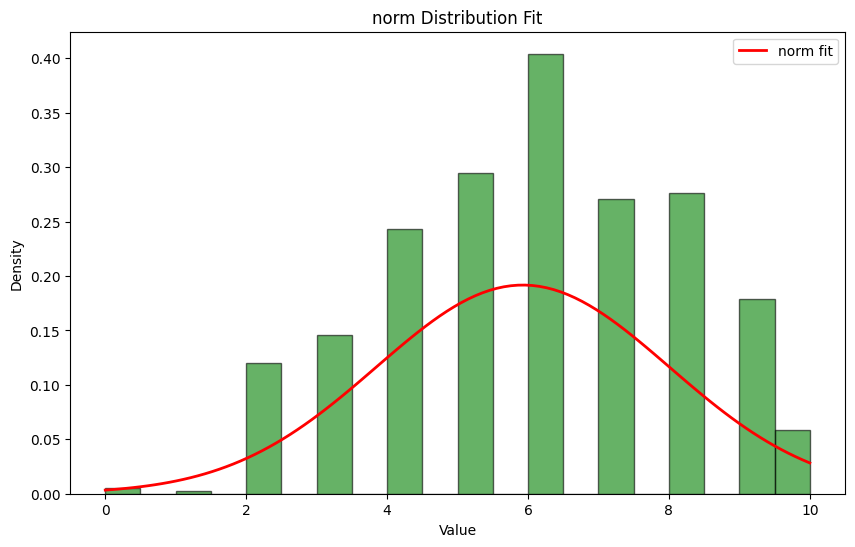

Column: Paedriatic_Appendicitis_Score
norm parameters: (5.236572890025576, 1.8919786309120168)


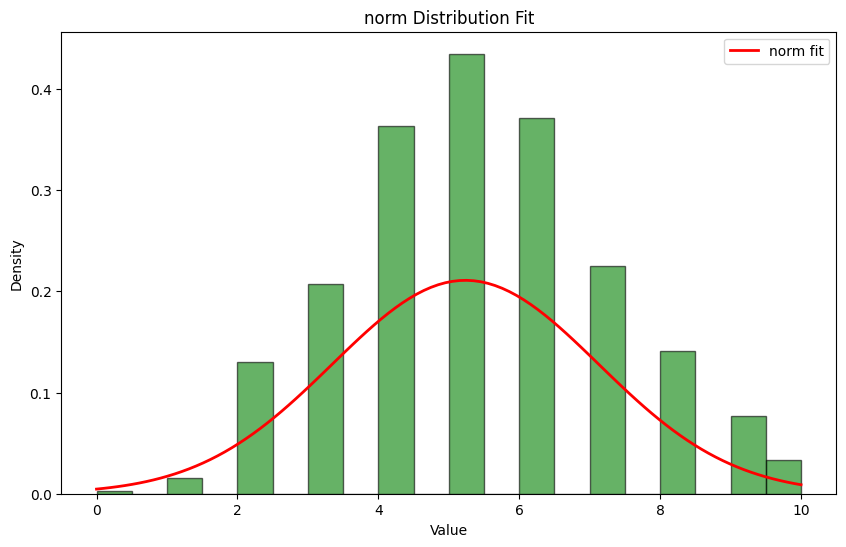

Column: Appendix_Diameter
norm parameters: (7.667263427109974, 2.026209955130159)


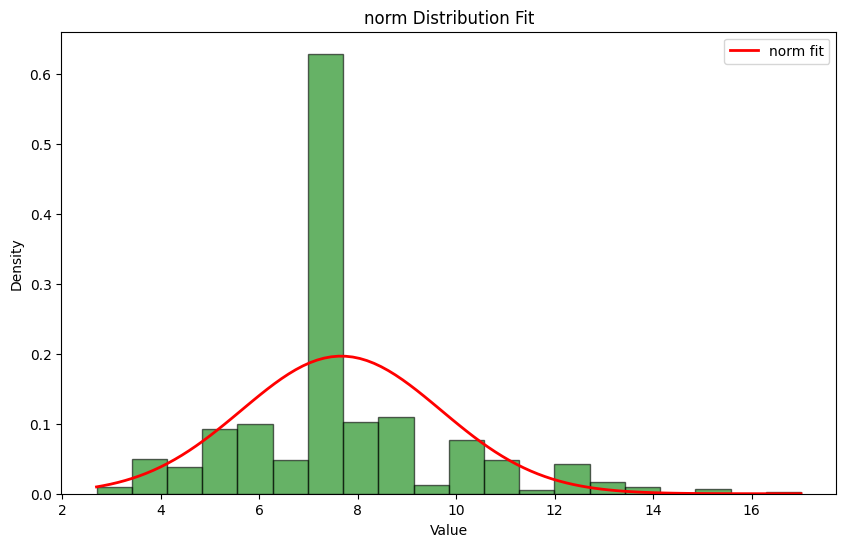

Column: Body_Temperature
norm parameters: (37.40268542199489, 0.8992497303370555)


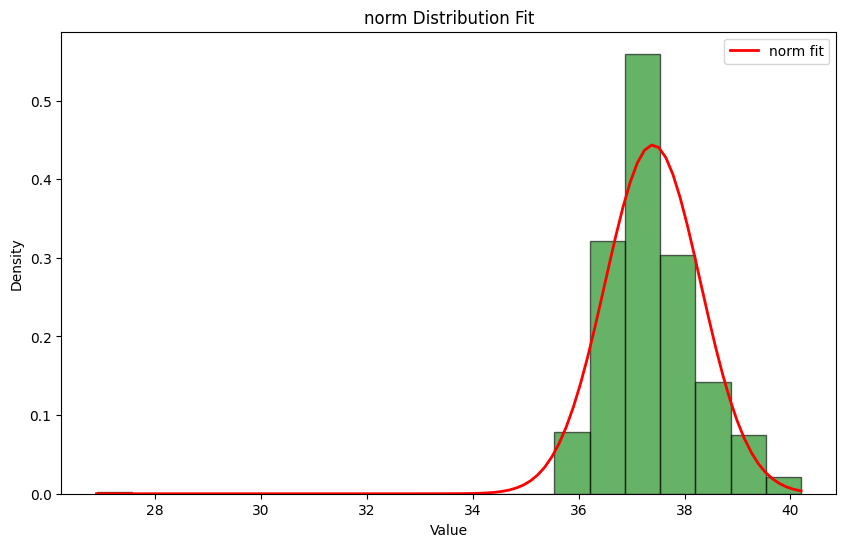

Column: WBC_Count
norm parameters: (12.665537084398977, 5.342772100145943)


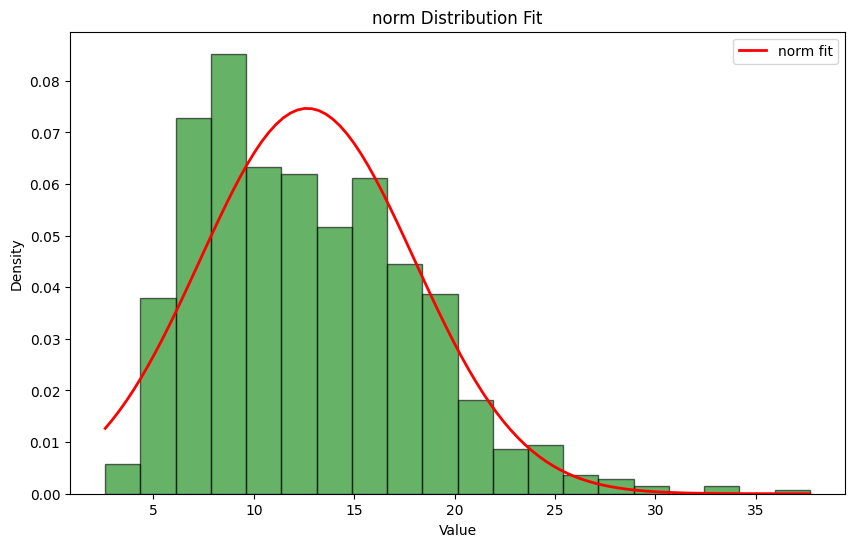

Column: Neutrophil_Percentage
norm parameters: (72.27966751918159, 13.525858852212231)


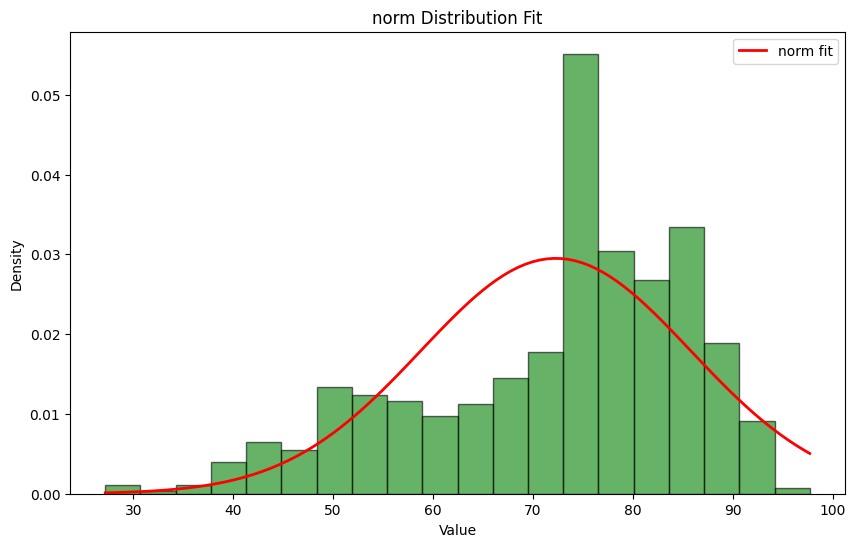

Column: Segmented_Neutrophils
norm parameters: (64.52966751918159, 3.9286884559717454)


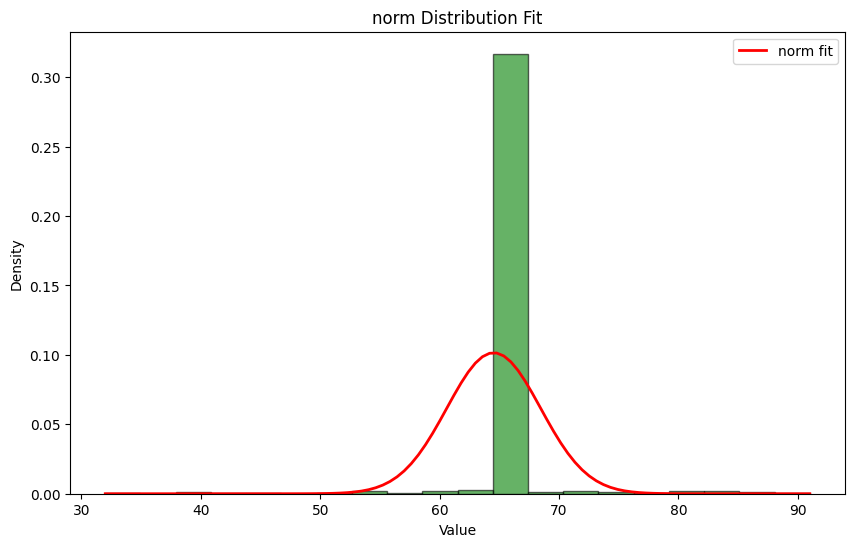

Column: RBC_Count
norm parameters: (4.799040920716113, 0.49292148113141626)


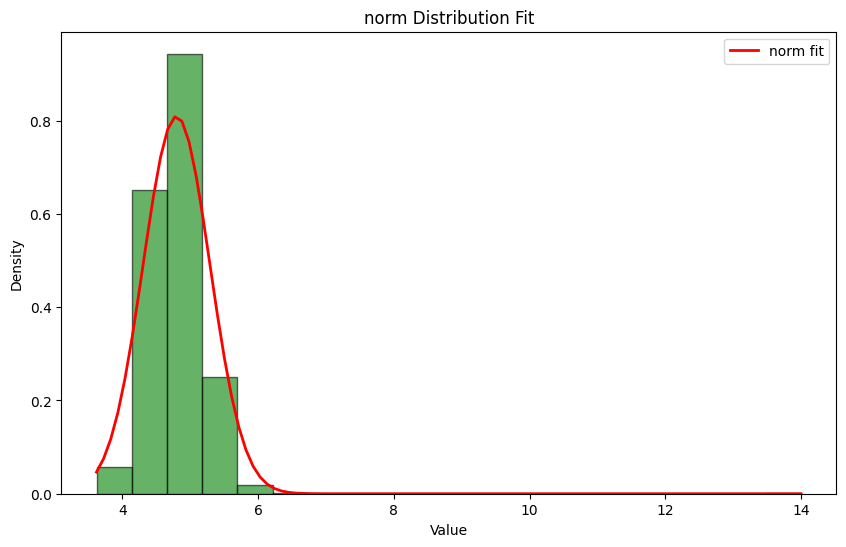

Column: Hemoglobin
norm parameters: (13.378644501278771, 1.3762942586556057)


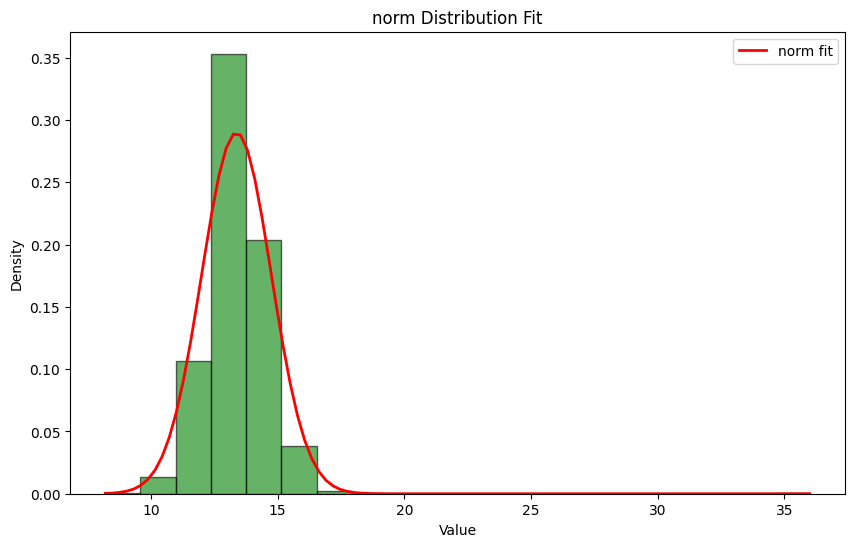

Column: RDW
norm parameters: (13.164322250639387, 4.4605624223606615)


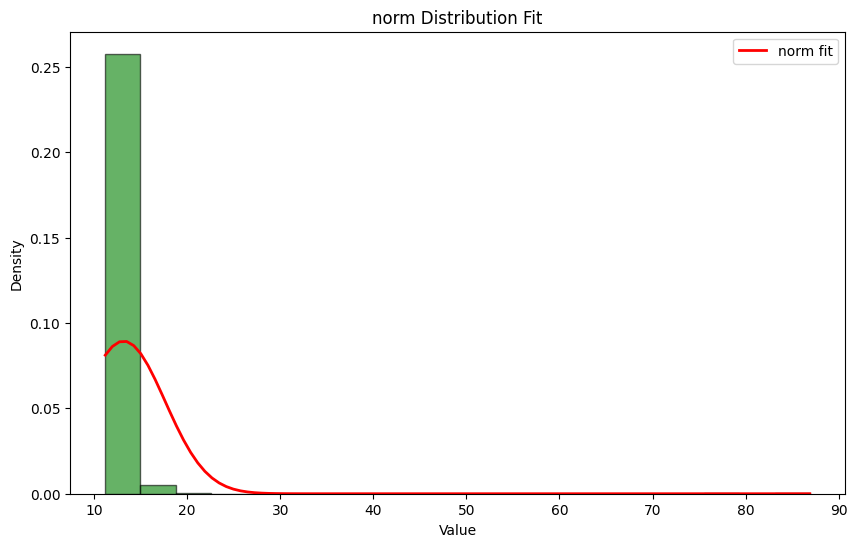

Column: Thrombocyte_Count
norm parameters: (285.039641943734, 71.62171307651764)


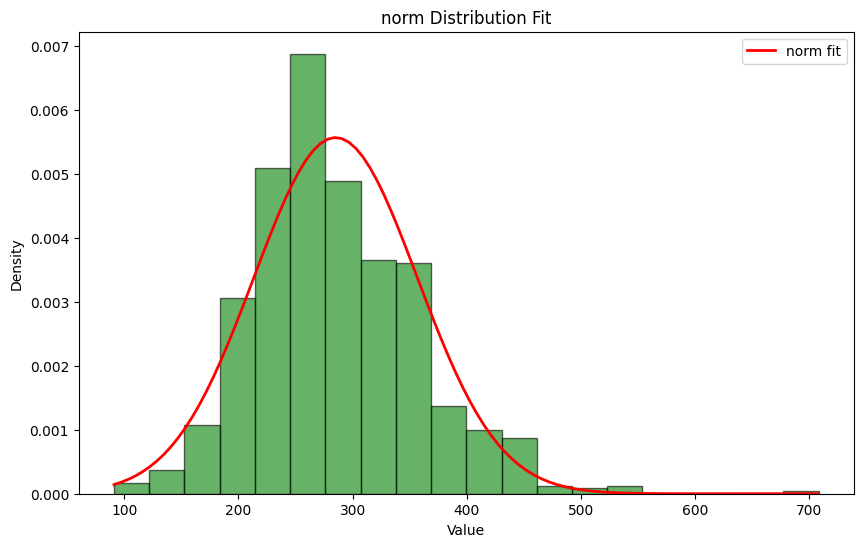

Column: CRP
norm parameters: (31.04386189258312, 57.06379731145141)


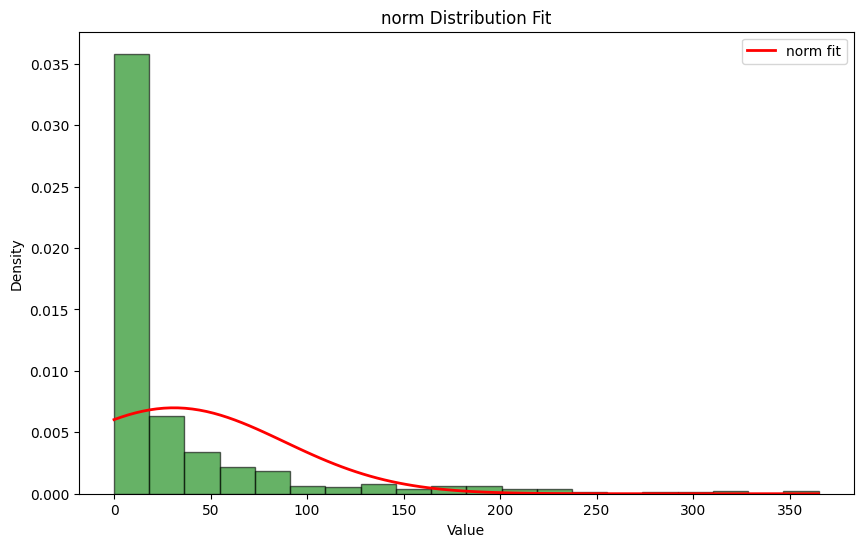

Column: US_Number
norm parameters: (424.7557544757033, 267.59879225770277)


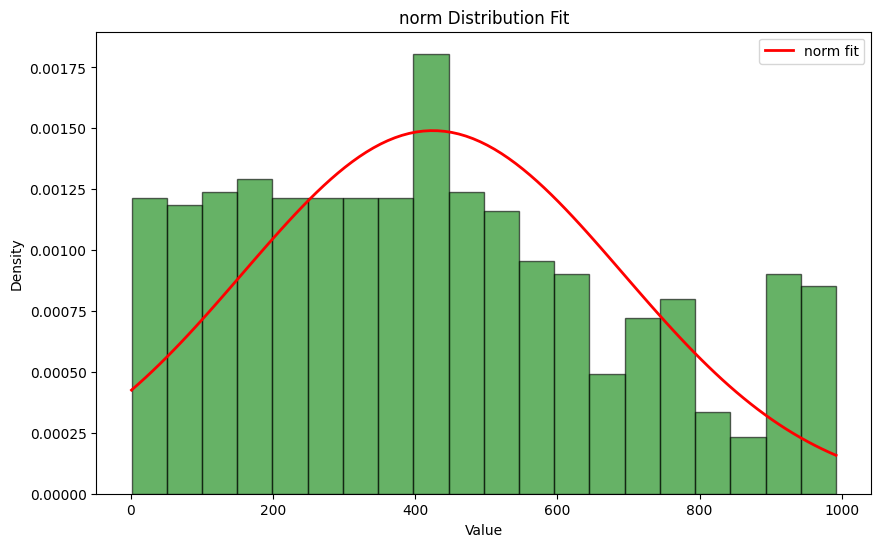

In [60]:
for column in numerical_columns:
    if df[column].notnull().any():
        print(f'Column: {column}')
        fit_and_evaluate_distribution(df[column].dropna(), 'norm')

Column: Age
expon parameters: (0.0, 11.346570701841435)


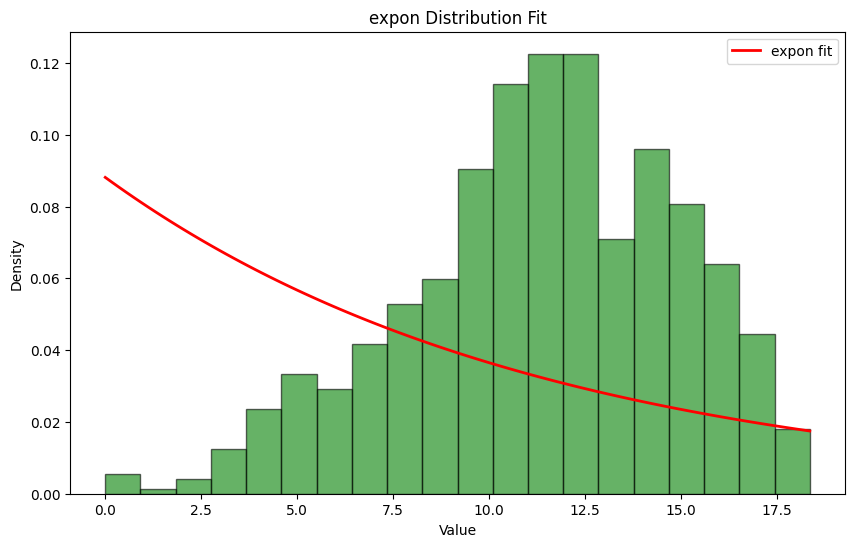

Column: BMI
expon parameters: (7.83, 11.047767752289003)


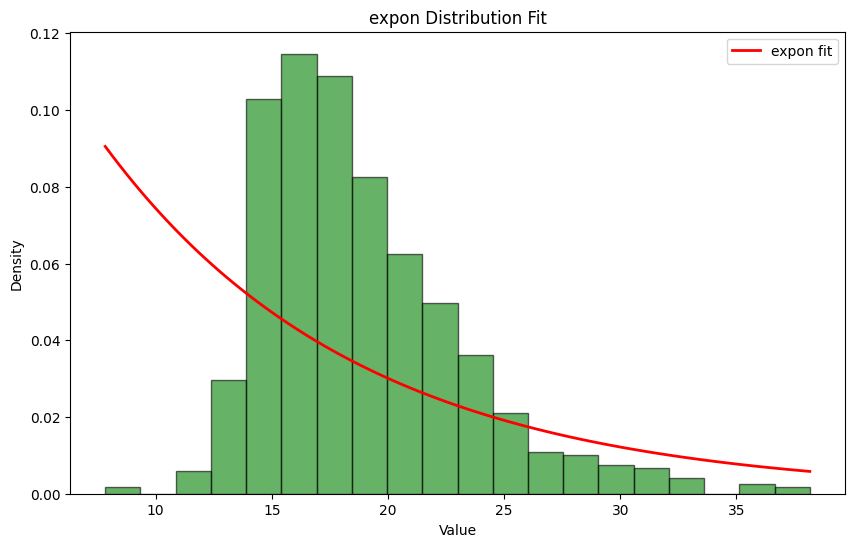

Column: Height
expon parameters: (53.0, 95.07173913043479)


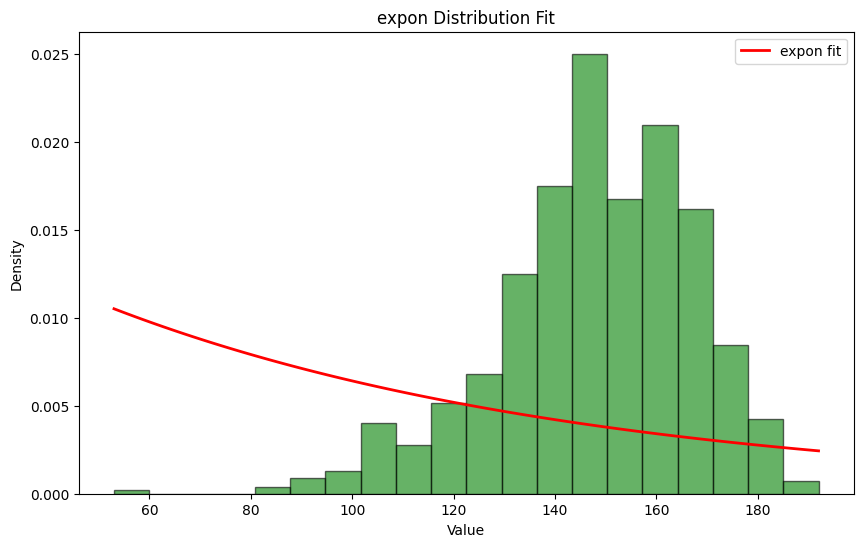

Column: Weight
expon parameters: (3.96, 39.20574168797954)


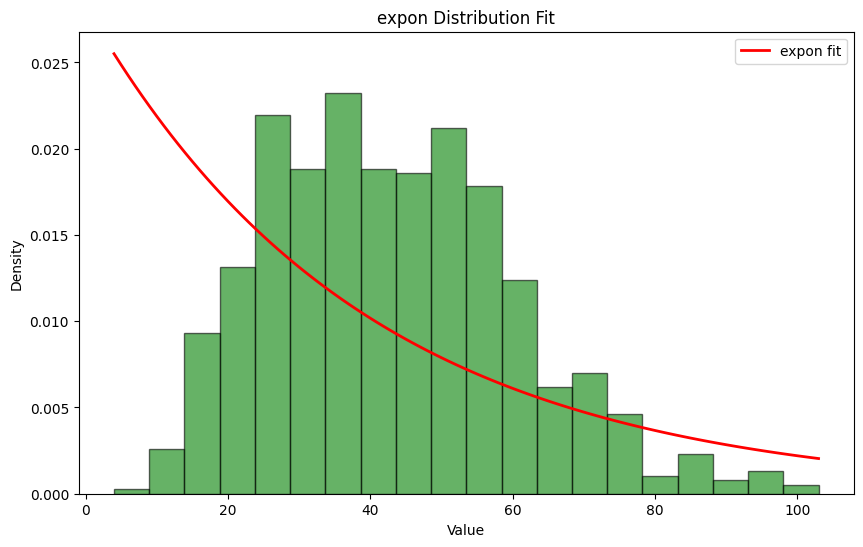

Column: Length_of_Stay
expon parameters: (1.0, 3.2774936061381075)


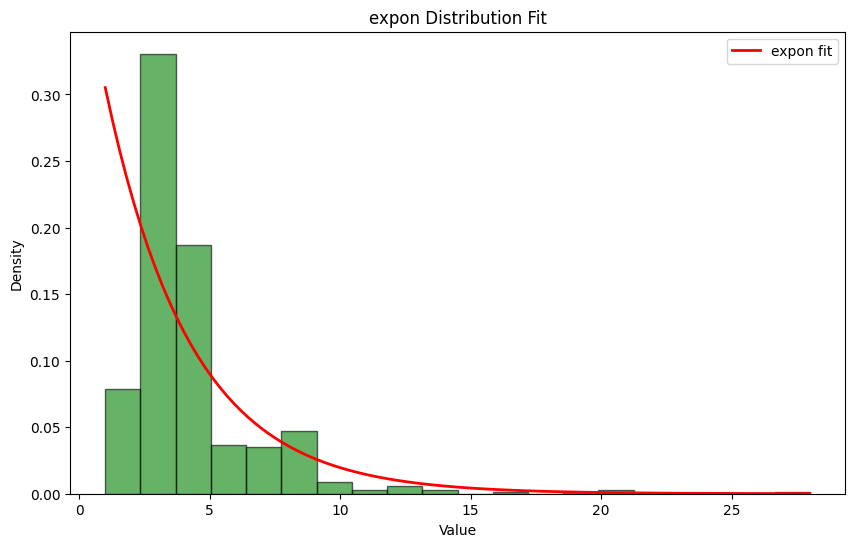

Column: Alvarado_Score
expon parameters: (0.0, 5.927109974424552)


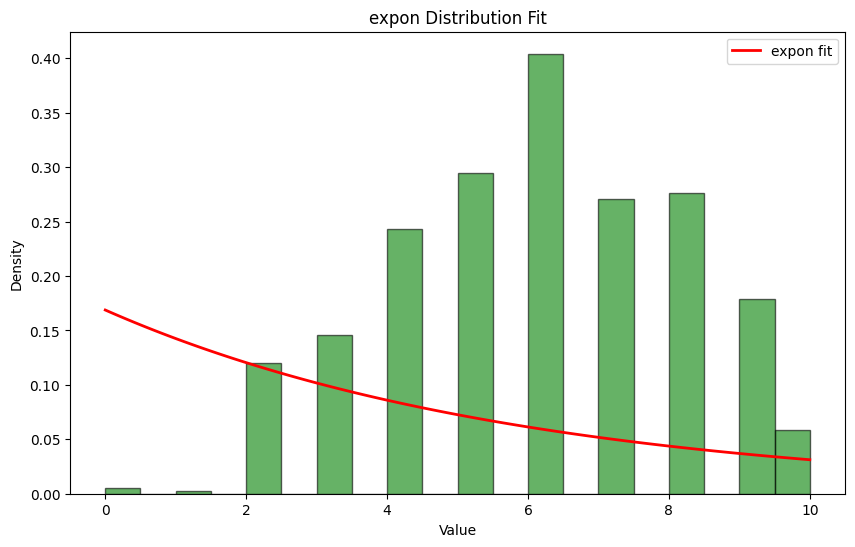

Column: Paedriatic_Appendicitis_Score
expon parameters: (0.0, 5.236572890025576)


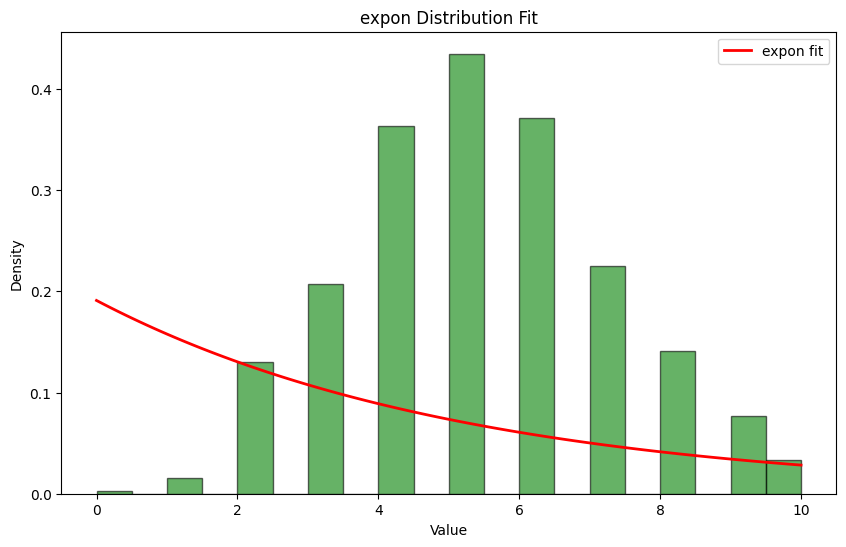

Column: Appendix_Diameter
expon parameters: (2.7, 4.967263427109974)


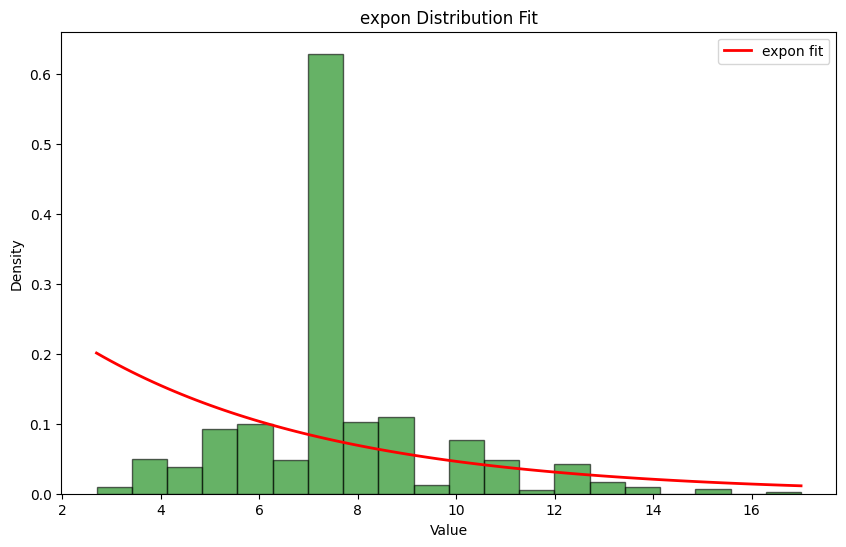

Column: Body_Temperature
expon parameters: (26.9, 10.50268542199489)


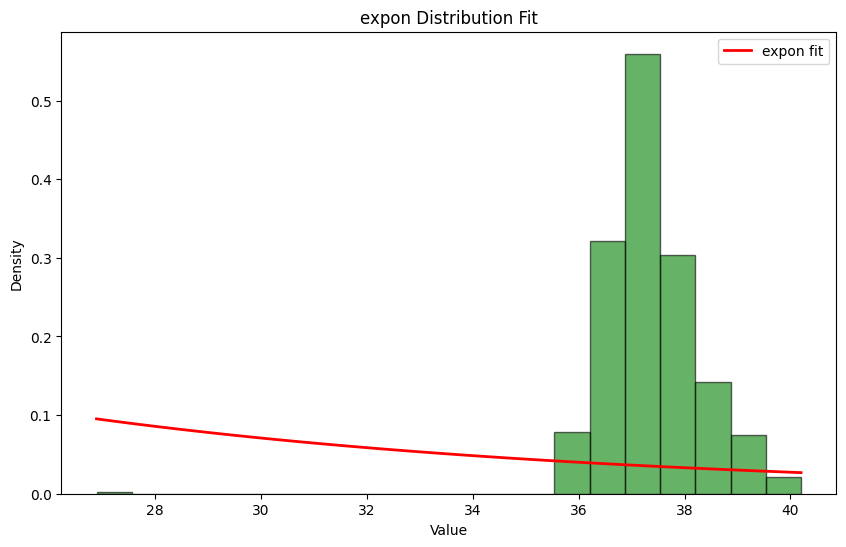

Column: WBC_Count
expon parameters: (2.6, 10.065537084398978)


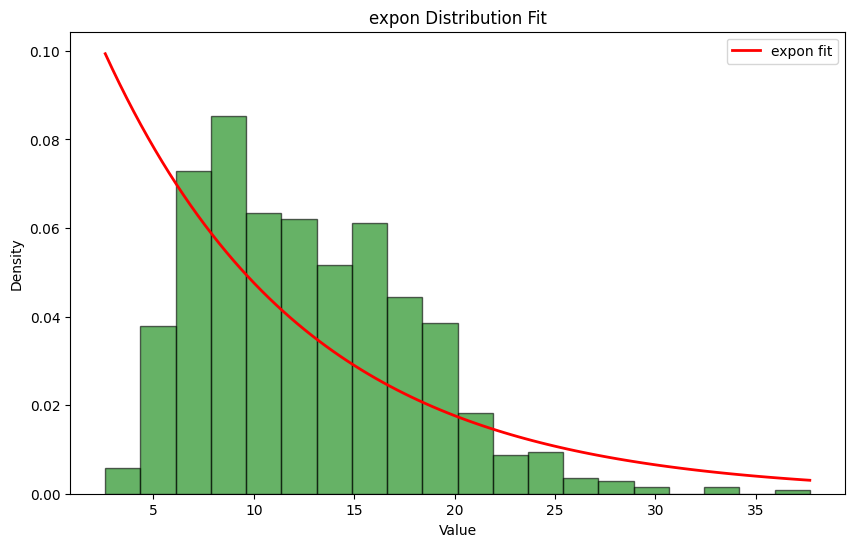

Column: Neutrophil_Percentage
expon parameters: (27.2, 45.079667519181584)


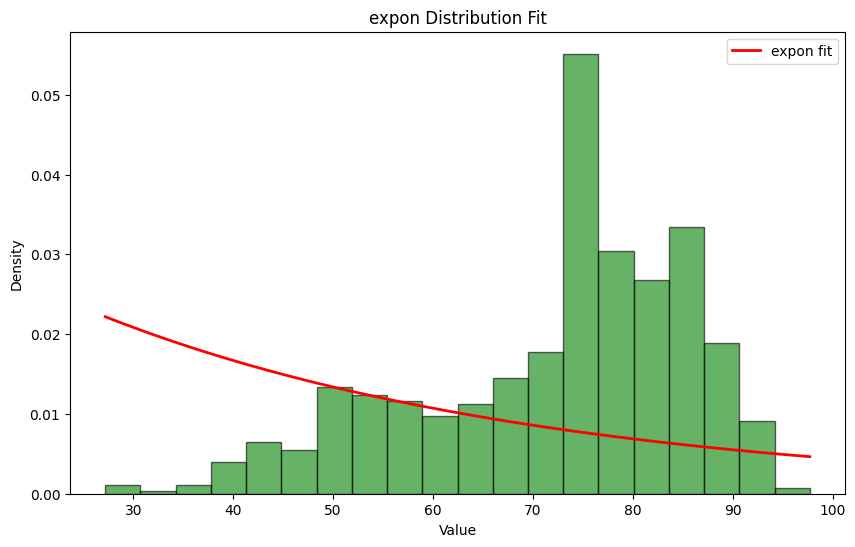

Column: Segmented_Neutrophils
expon parameters: (32.0, 32.52966751918159)


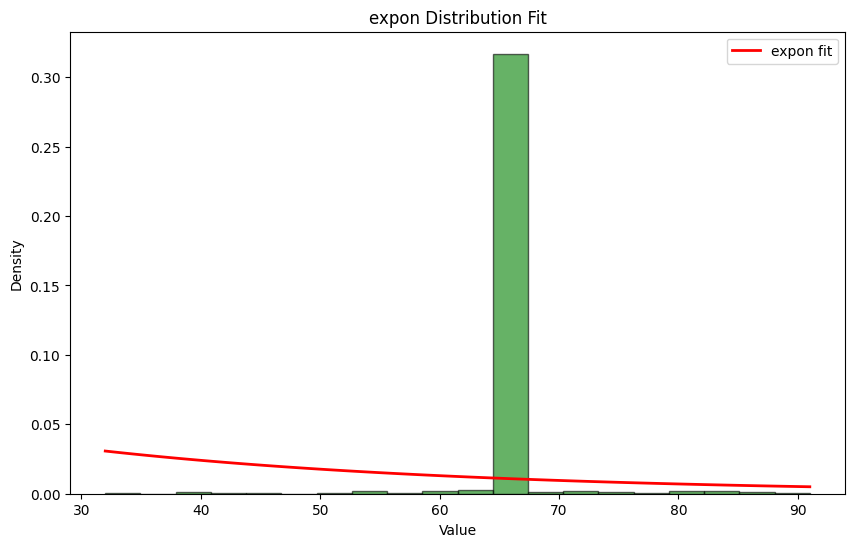

Column: RBC_Count
expon parameters: (3.62, 1.1790409207161128)


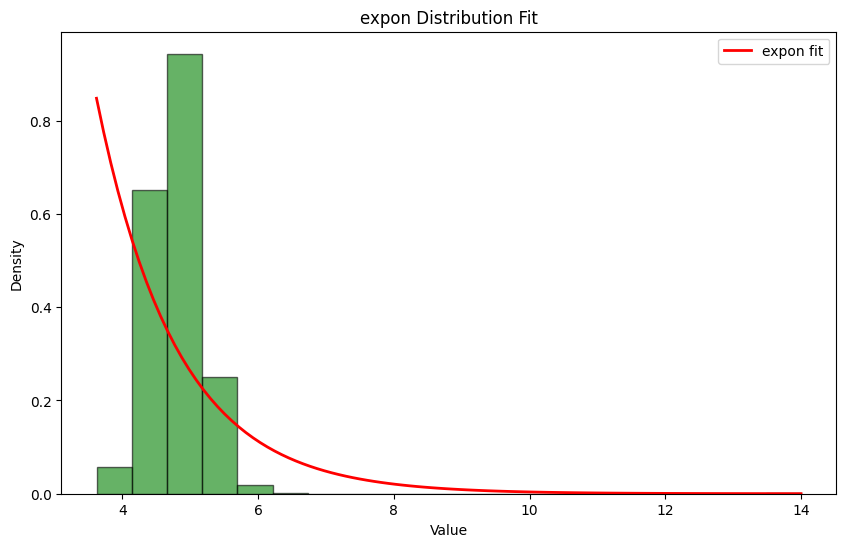

Column: Hemoglobin
expon parameters: (8.2, 5.178644501278772)


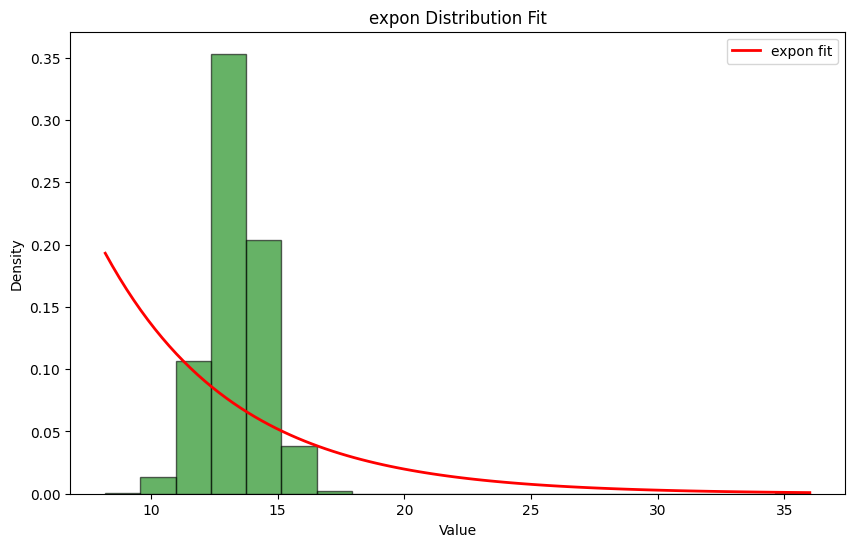

Column: RDW
expon parameters: (11.2, 1.9643222506393876)


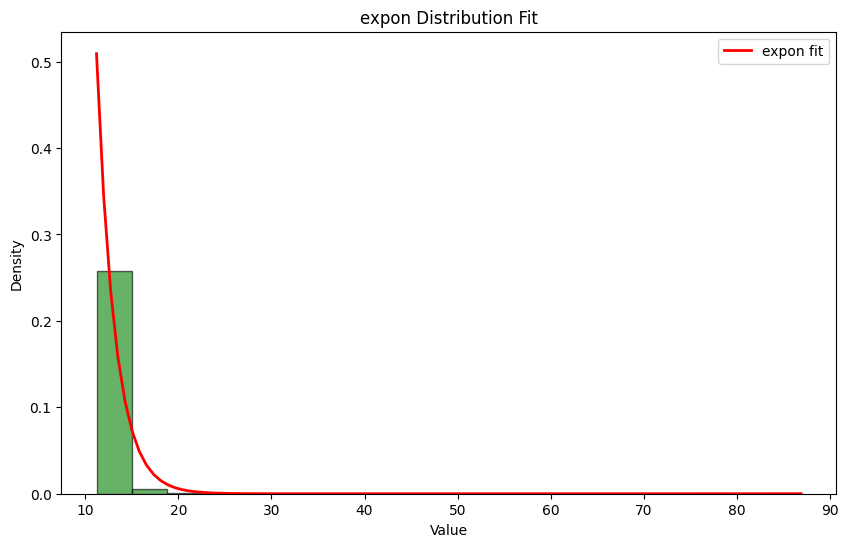

Column: Thrombocyte_Count
expon parameters: (91.0, 194.039641943734)


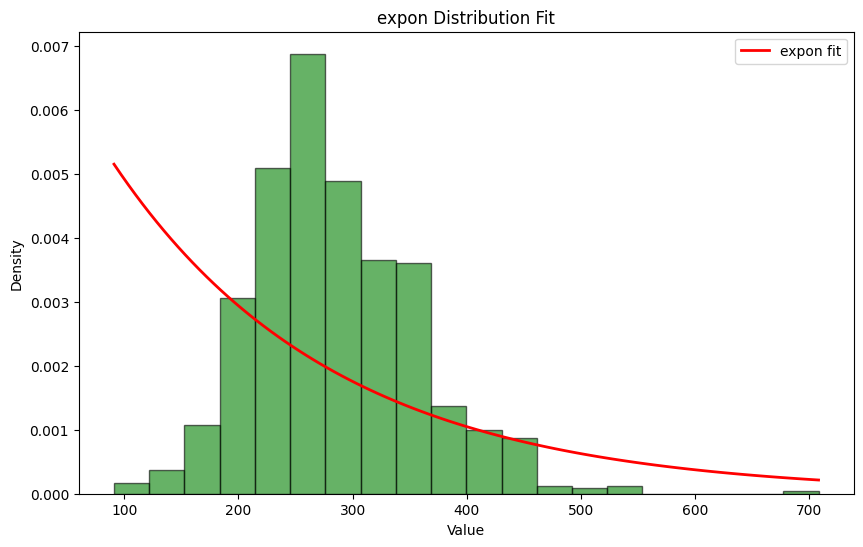

Column: CRP
expon parameters: (0.0, 31.04386189258312)


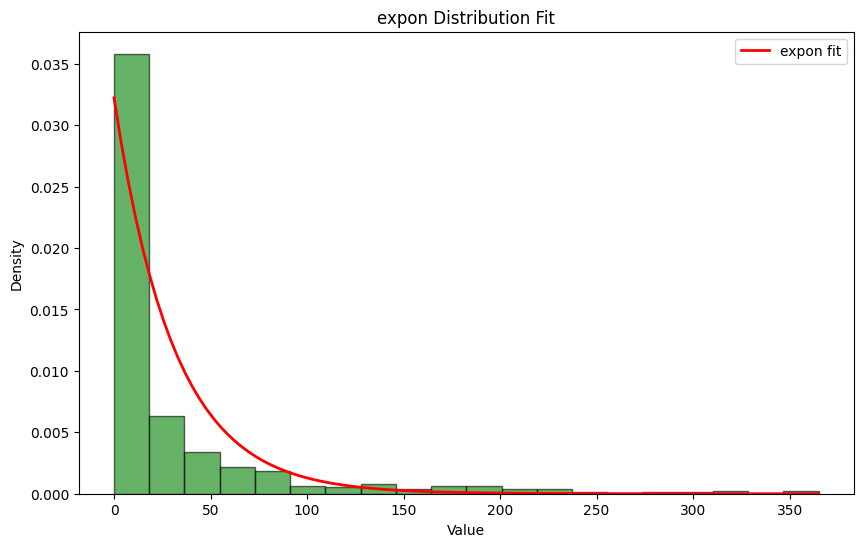

Column: US_Number
expon parameters: (1.0, 423.7557544757033)


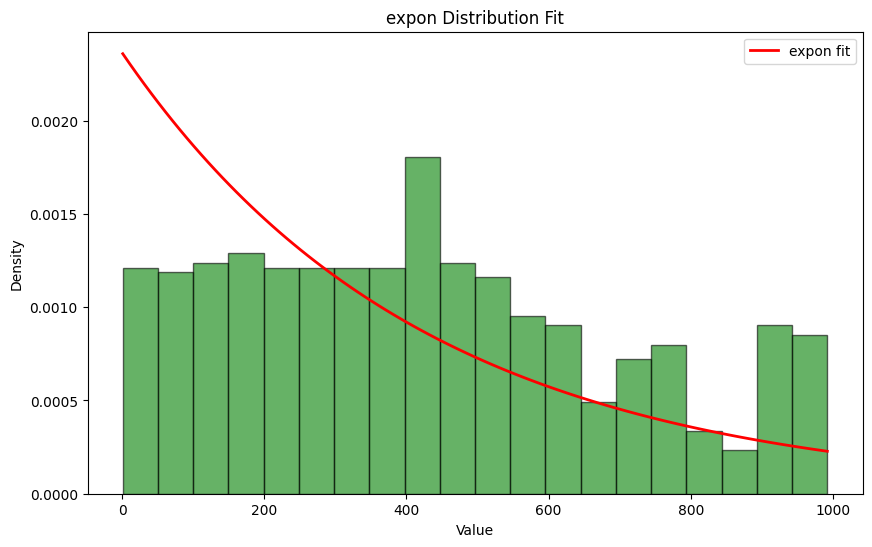

In [61]:
for column in numerical_columns:
    if df[column].notnull().any():
        print(f'Column: {column}')
        fit_and_evaluate_distribution(df[column].dropna(), 'expon')

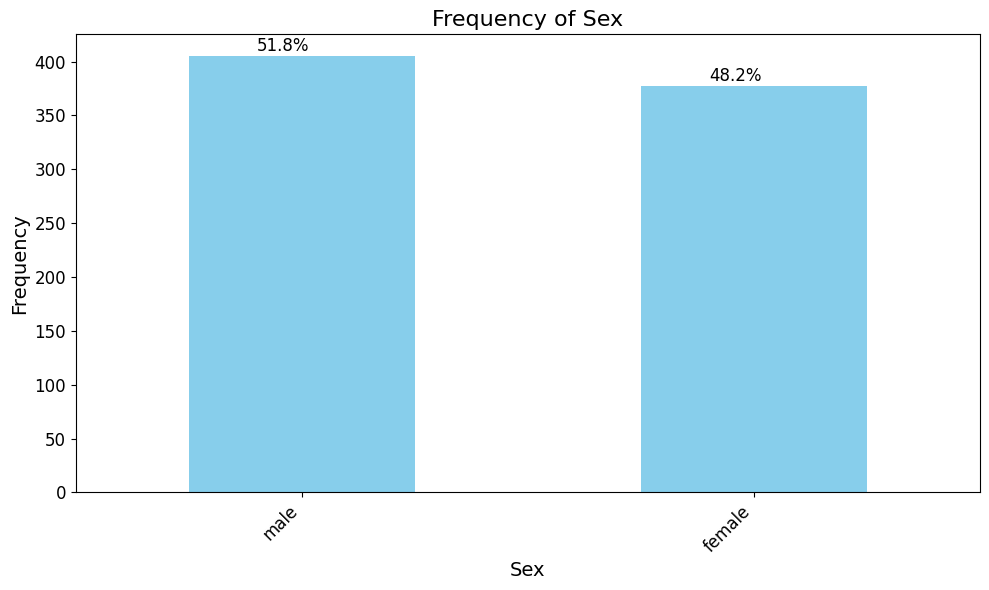

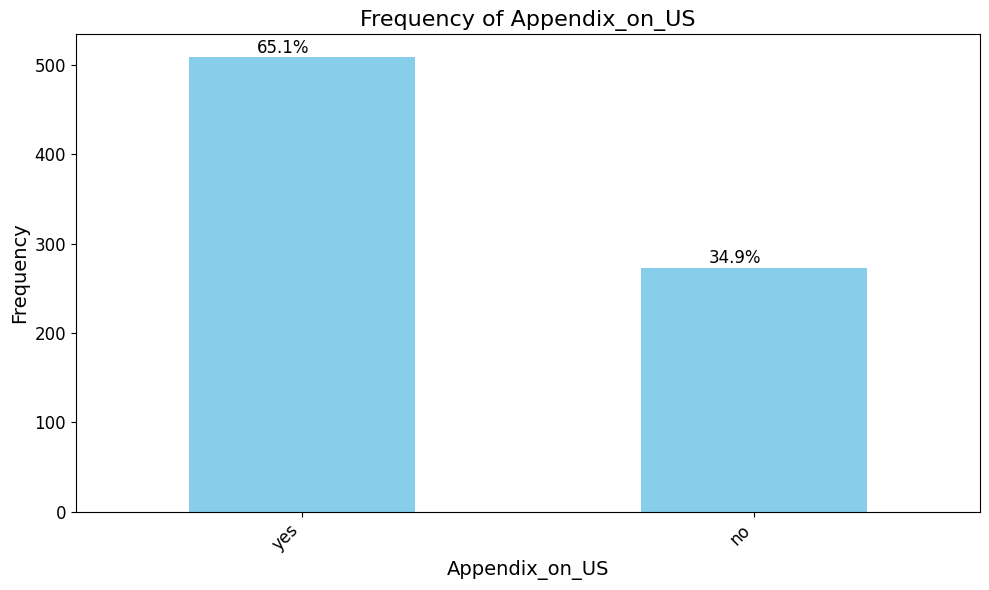

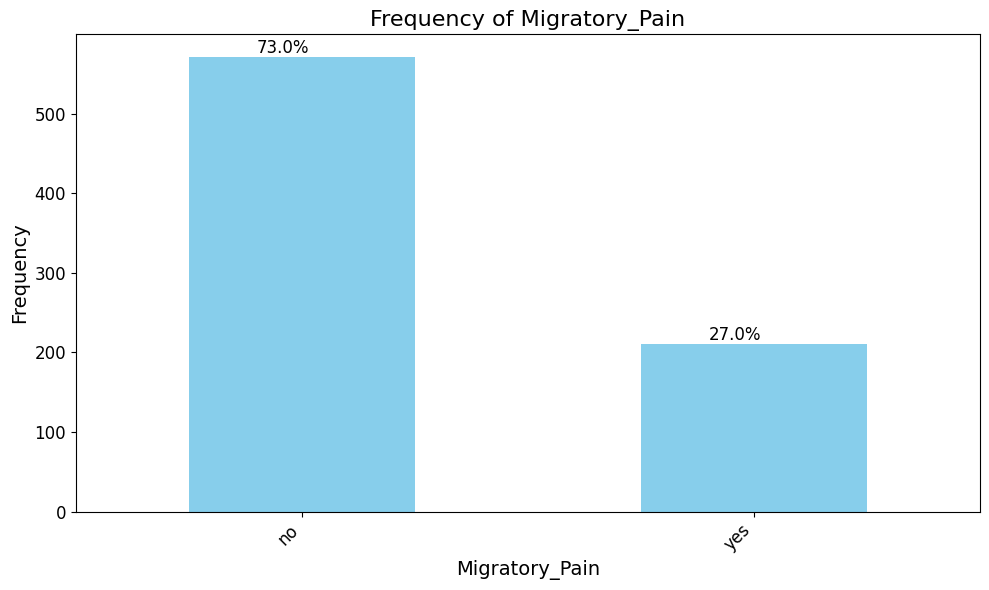

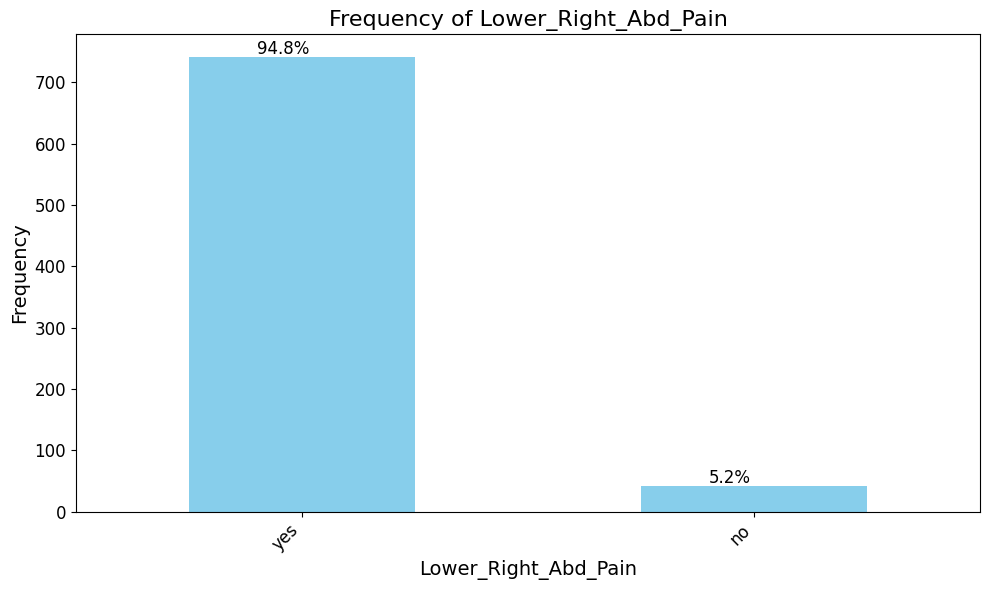

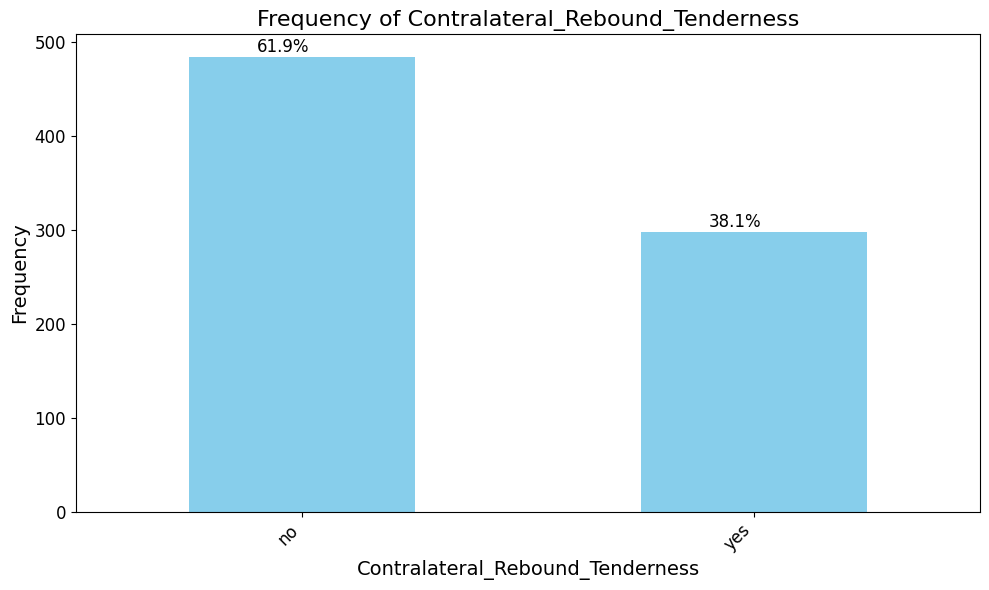

...

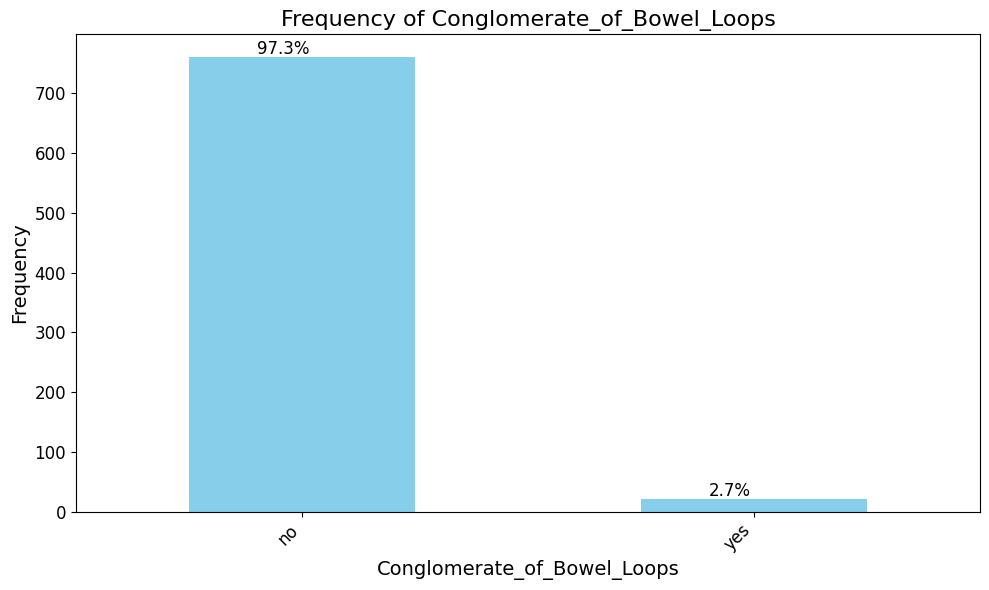

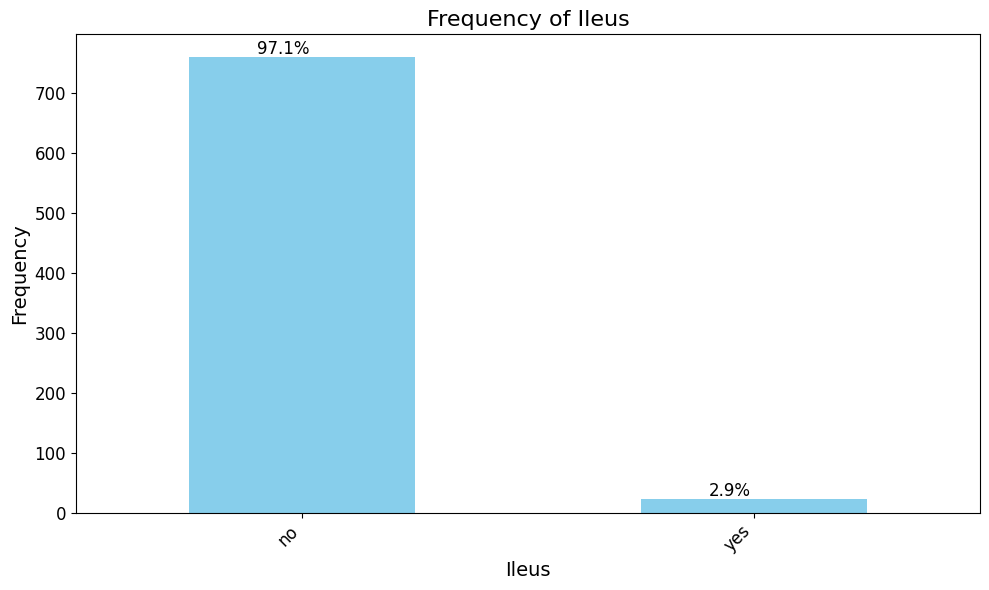

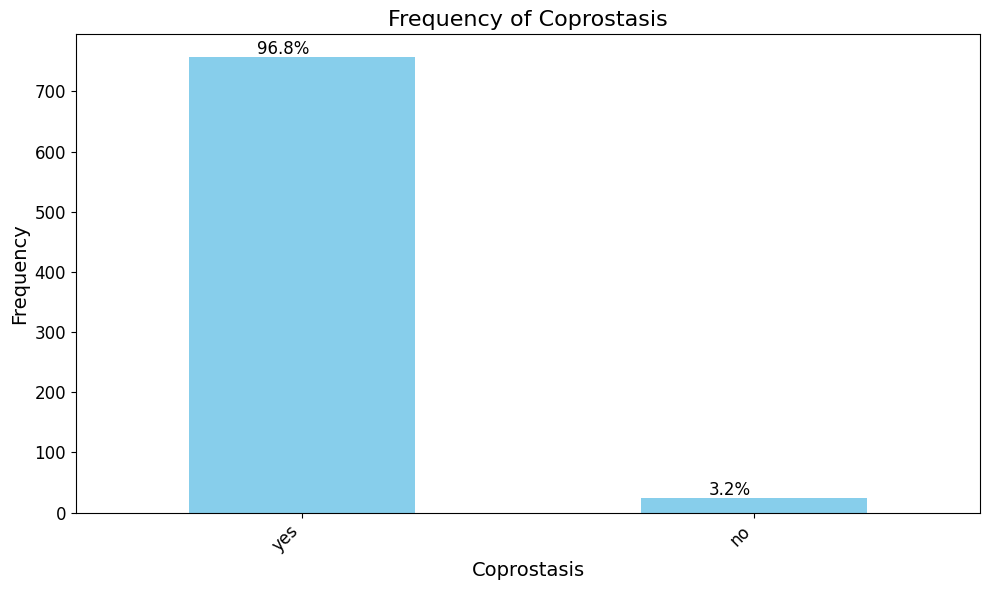

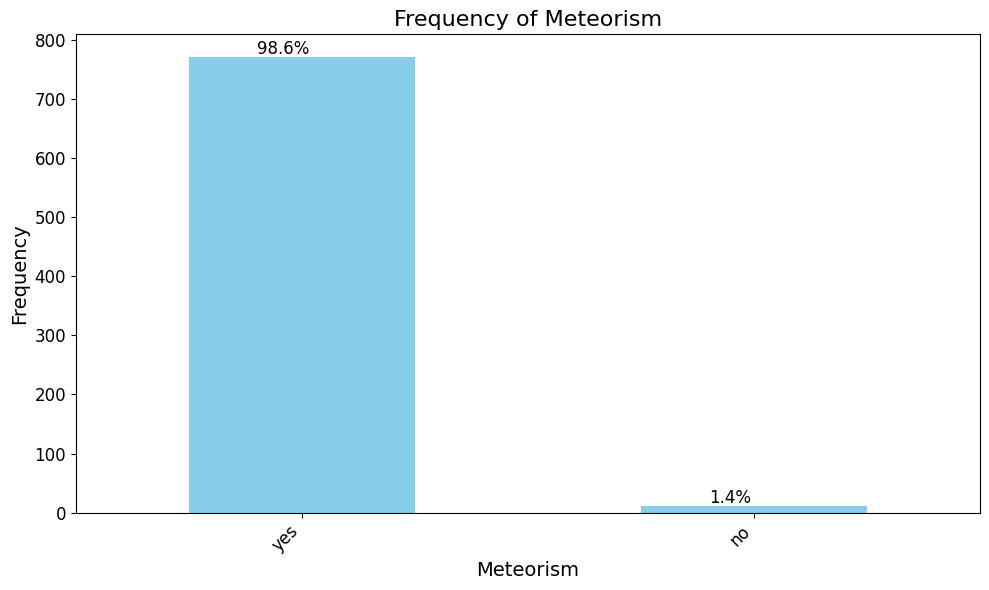

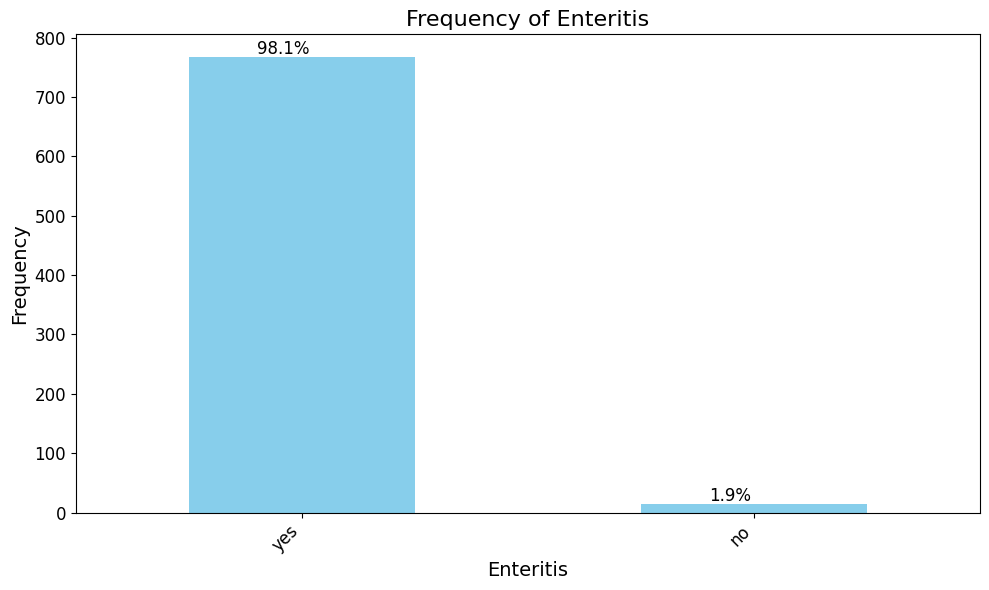

<ipython-input-62-d931a2db97a5>:31: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


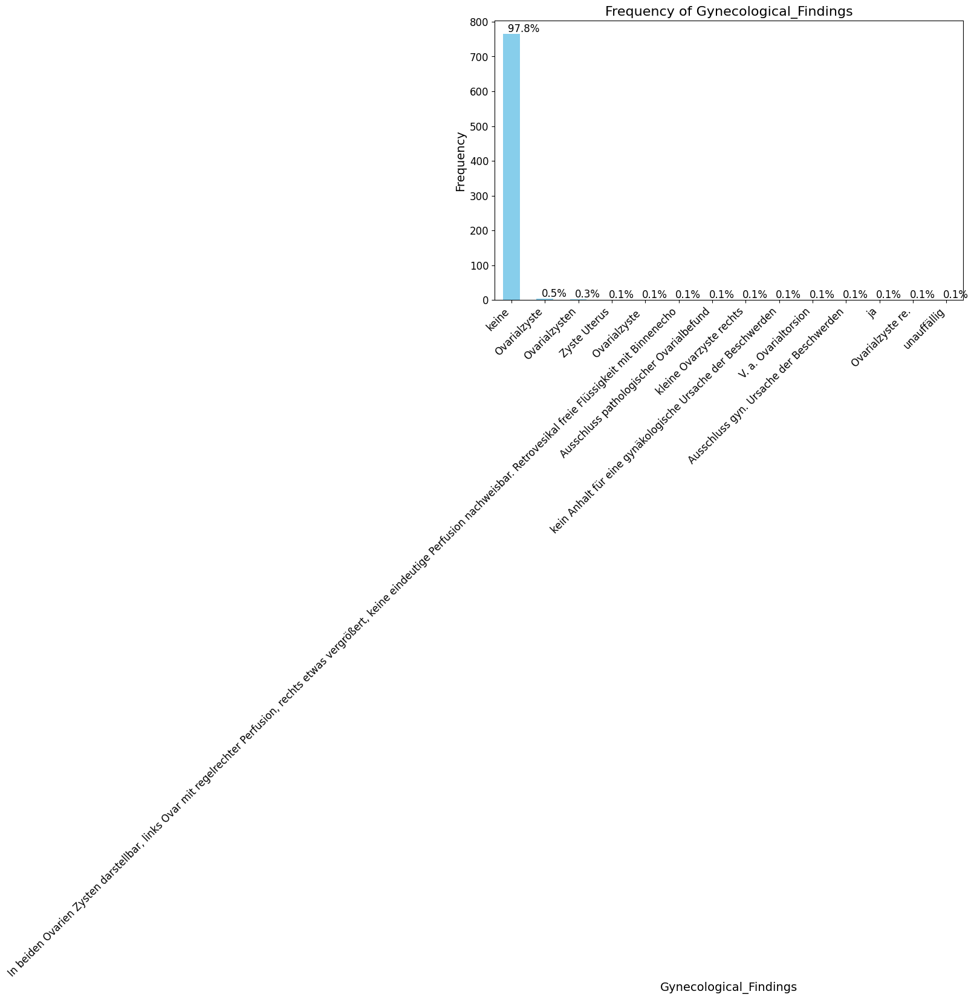

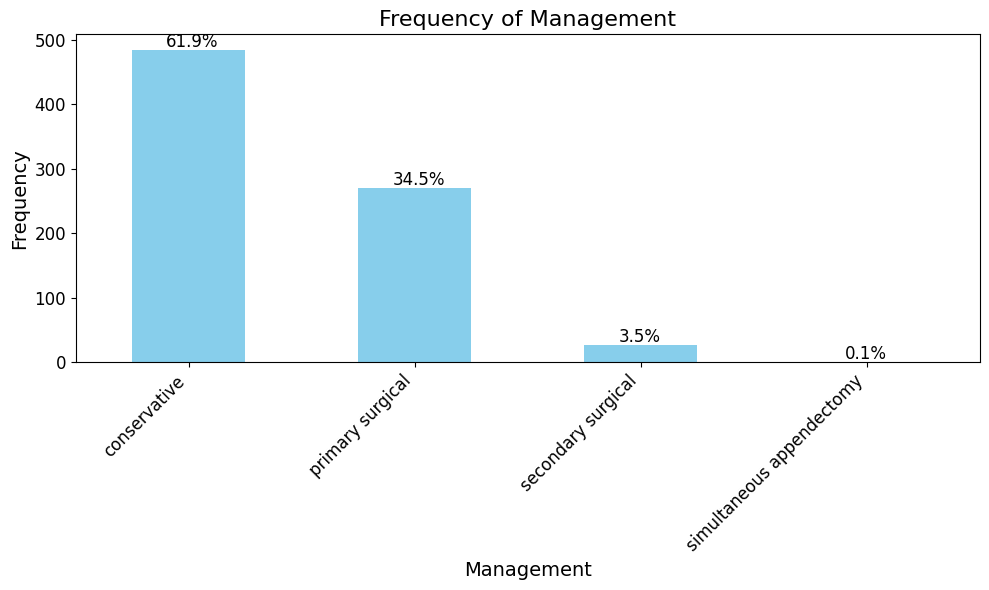

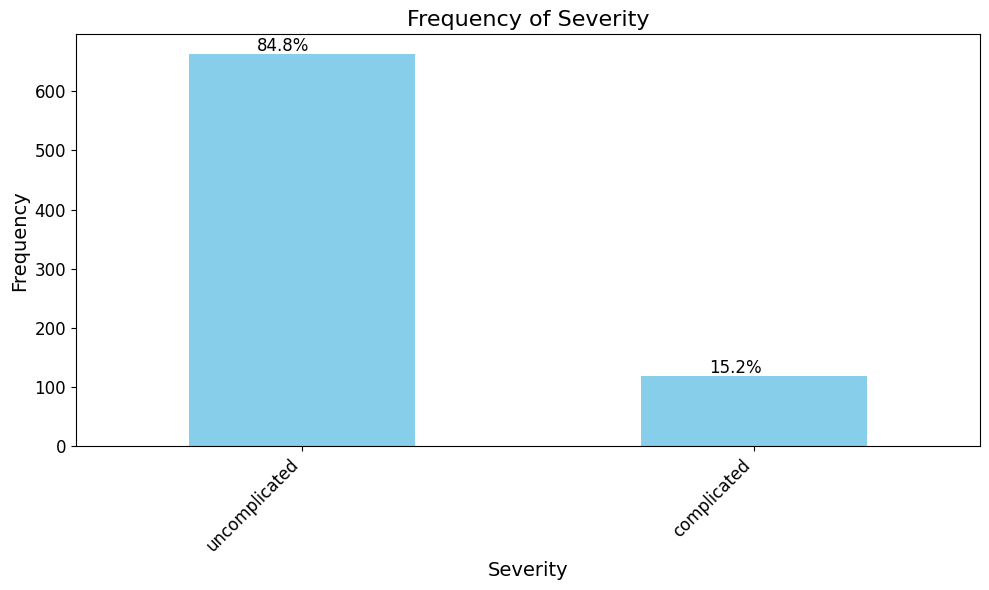

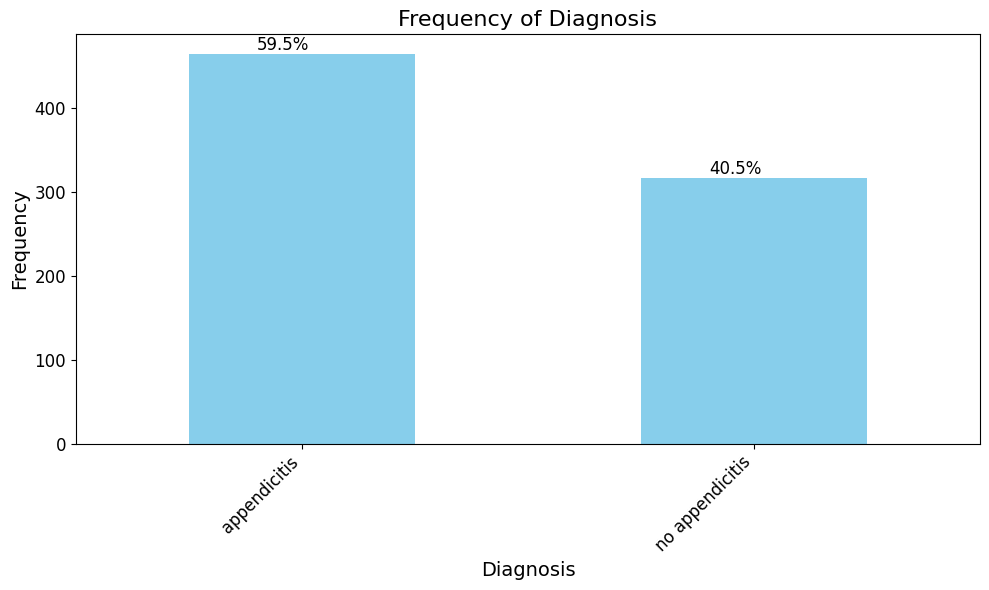

In [62]:
for column in categorical_columns:
    # Calculate frequency counts
    freq_counts = df[column].value_counts()

    # Sort categories by frequency
    freq_counts = freq_counts.sort_values(ascending=False)

    # Plotting
    plt.figure(figsize=(10, 6))
    ax = freq_counts.plot(kind='bar', color='skyblue')

    # Add percentages above bars
    totals = []
    for p in ax.patches:
        totals.append(p.get_height())

    total = sum(totals)

    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.1
        y = p.get_height() + 5
        ax.annotate(percentage, (x, y), fontsize=12)

    # Formatting
    plt.title(f'Frequency of {column}', fontsize=16)
    plt.xlabel(column, fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()

<ipython-input-70-02e604060d94>:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


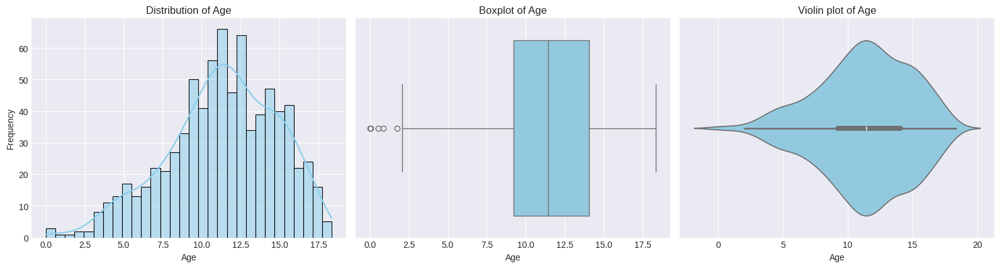

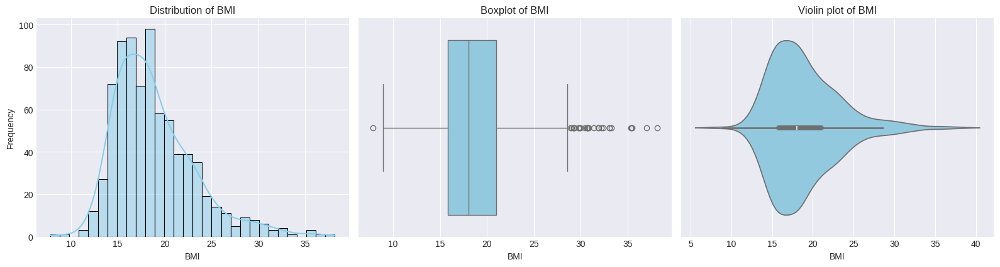

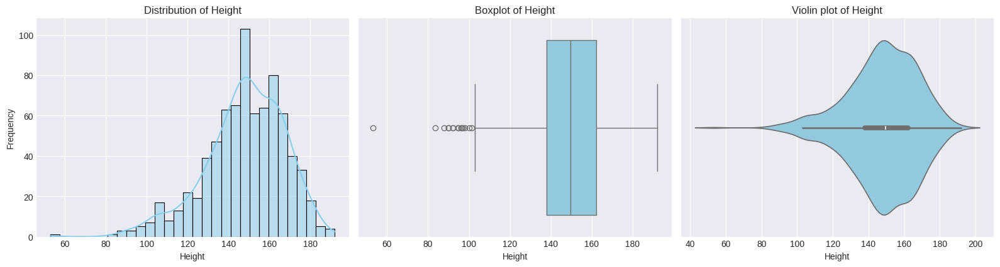

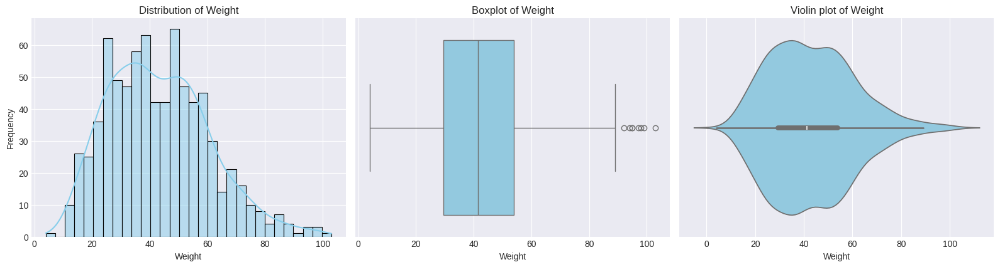

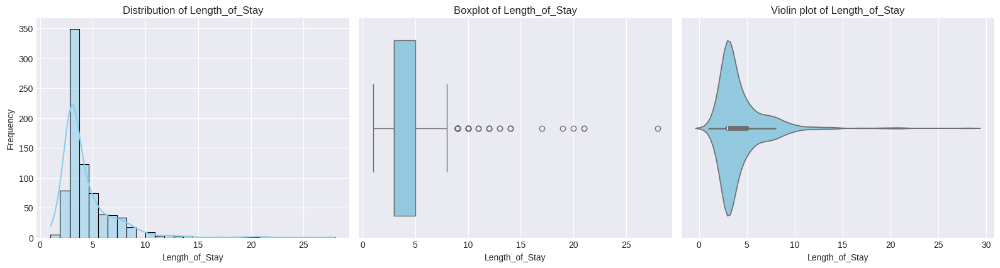

...

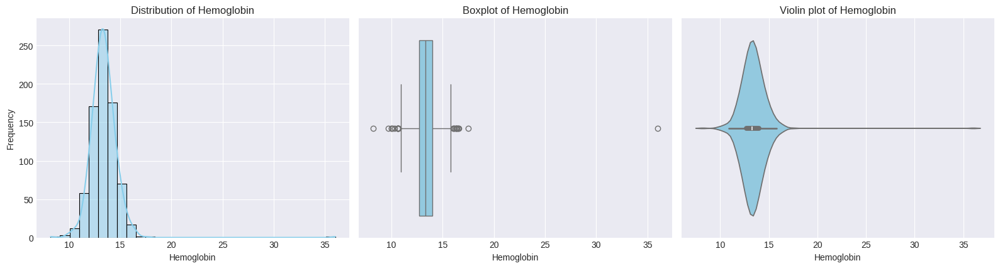

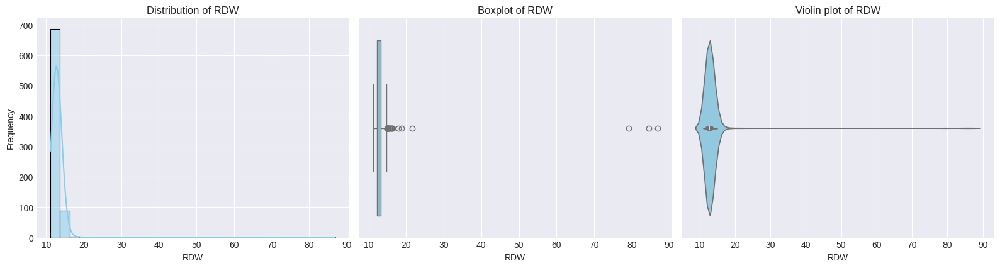

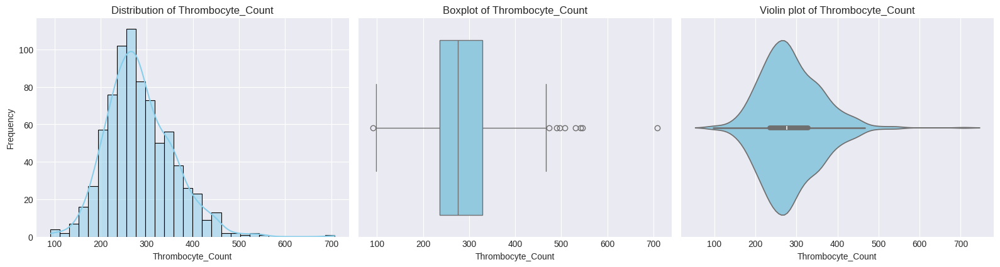

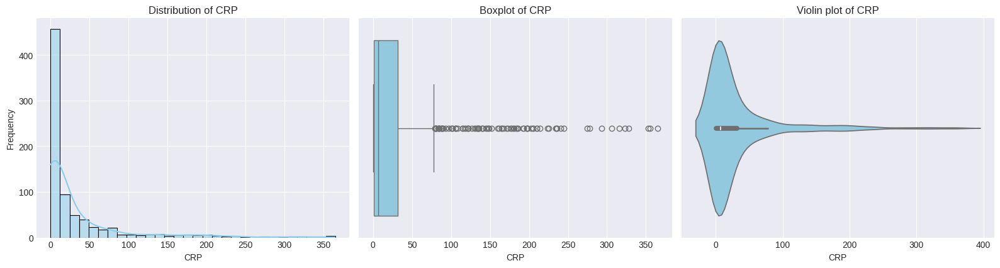

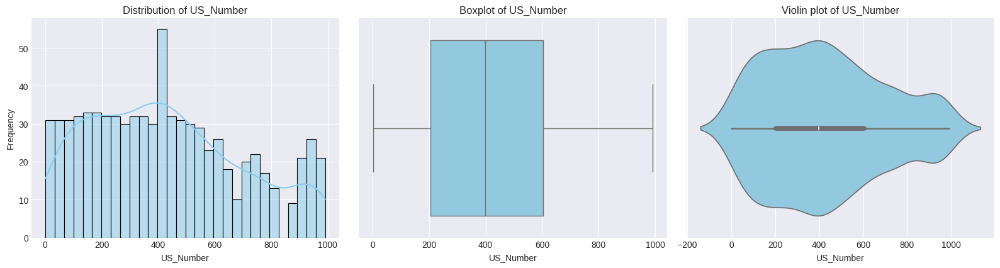

Column                           Mean    Median    Std Deviation    Skewness    Kurtosis    Outliers (IQR)    Outliers (Z-score)  Kurtosis Type
-----------------------------  ------  --------  ---------------  ----------  ----------  ----------------  --------------------  --------------------------
Age                             11.35     11.44             3.53       -0.44       -0.17                 5                     3  Platykurtic (light-tailed)
BMI                             18.88     18.06             4.31        1.17        1.86                30                    12  Leptokurtic (heavy-tailed)
Height                         148.07    149.65            19.40       -0.70        0.82                15                     3  Leptokurtic (heavy-tailed)
Weight                          43.17     41.40            17.36        0.53        0.03                 8                     4  Leptokurtic (heavy-tailed)
Length_of_Stay                   4.28      3.00             2.57       

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


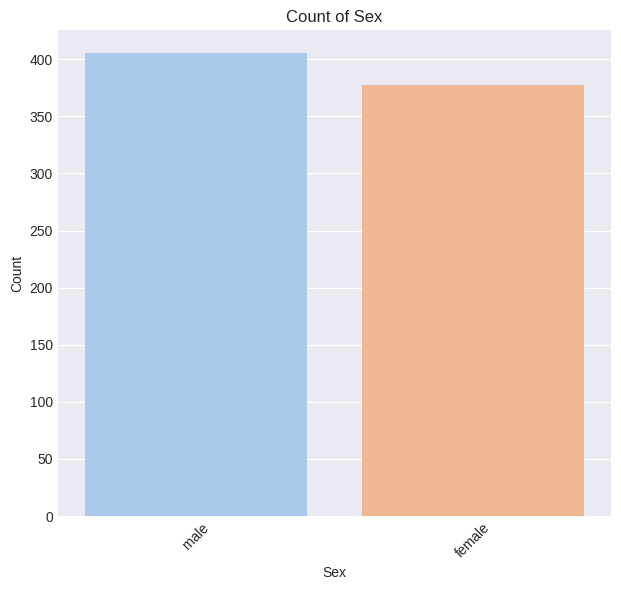

Number of unique values for Appendix_on_US: 2
Appendix_on_US
yes    509
no     273
Name: count, dtype: int64



<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


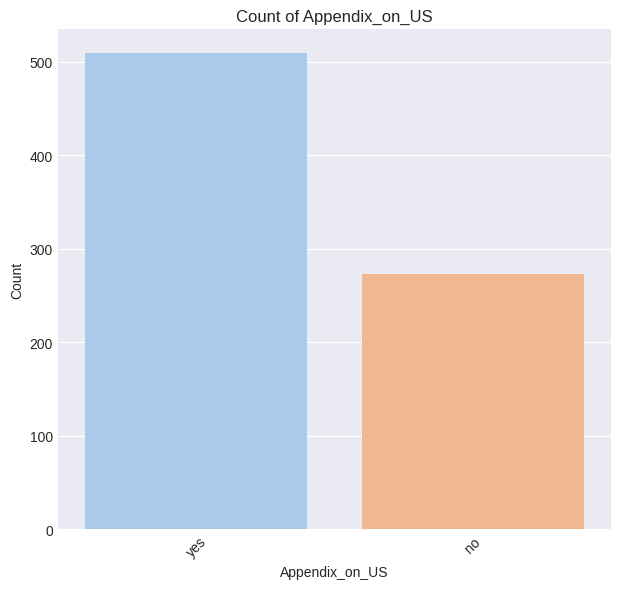

Number of unique values for Migratory_Pain: 2
Migratory_Pain
no     571
yes    211
Name: count, dtype: int64



<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


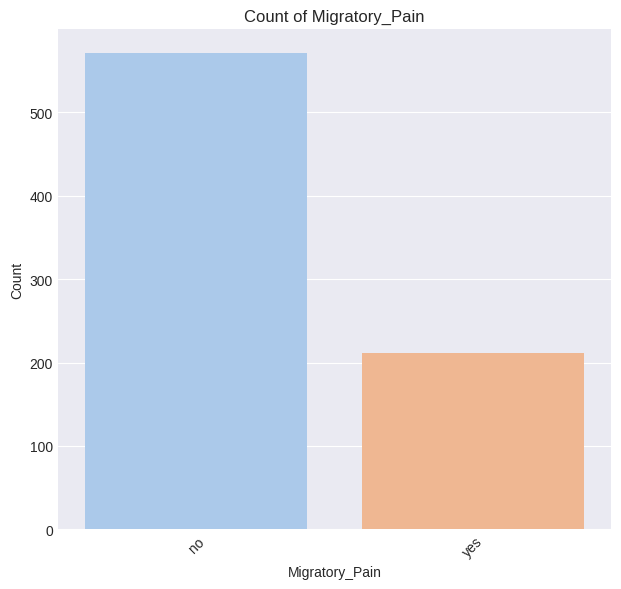

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Lower_Right_Abd_Pain: 2
Lower_Right_Abd_Pain
yes    741
no      41
Name: count, dtype: int64



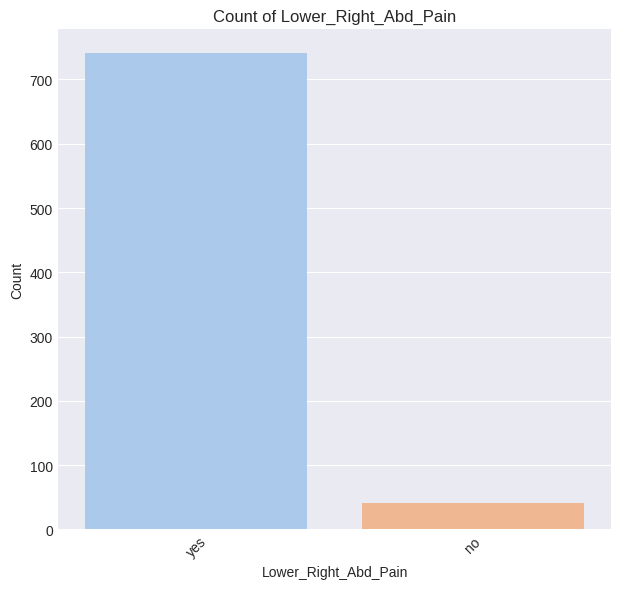

Number of unique values for Contralateral_Rebound_Tenderness: 2
Contralateral_Rebound_Tenderness
no     484
yes    298
Name: count, dtype: int64



<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


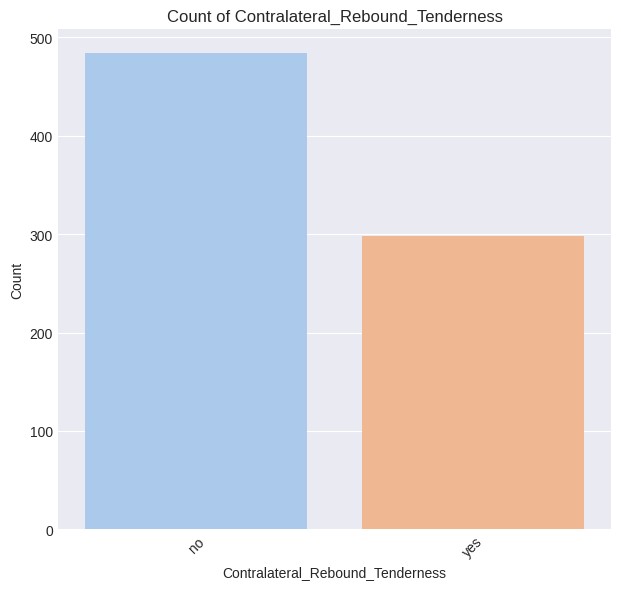

Number of unique values for Coughing_Pain: 2
Coughing_Pain
no     564
yes    218
Name: count, dtype: int64



<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


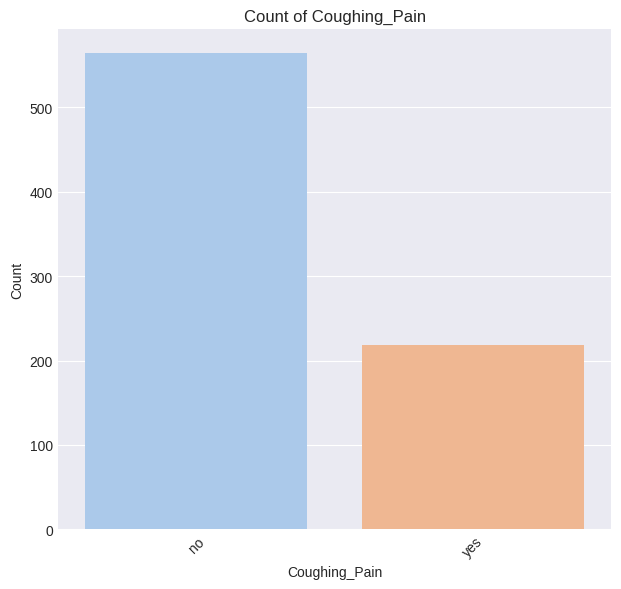

Number of unique values for Nausea: 2
Nausea
yes    461
no     321
Name: count, dtype: int64



<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


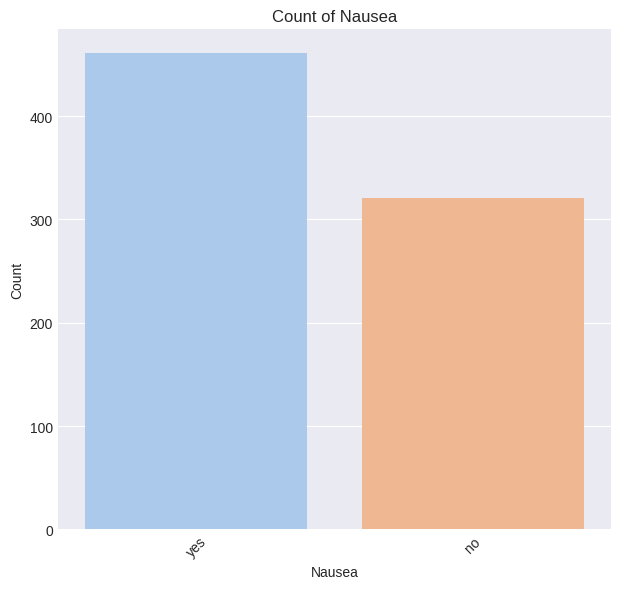

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Loss_of_Appetite: 2
Loss_of_Appetite
yes    402
no     380
Name: count, dtype: int64



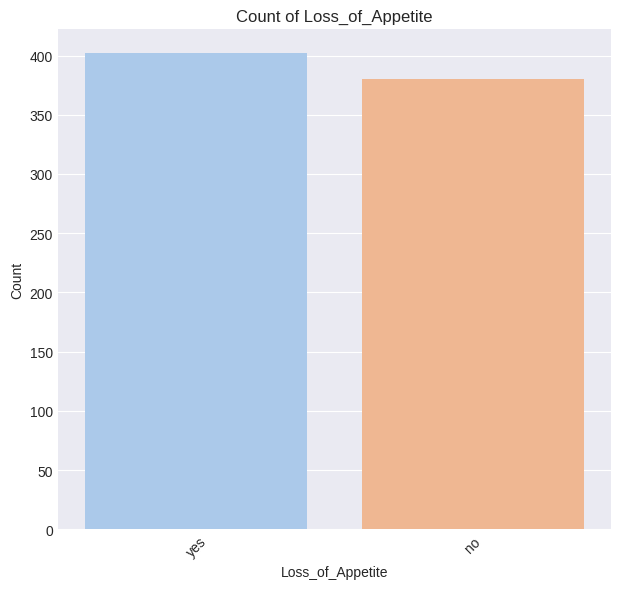

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Neutrophilia: 2
Neutrophilia
no     421
yes    361
Name: count, dtype: int64



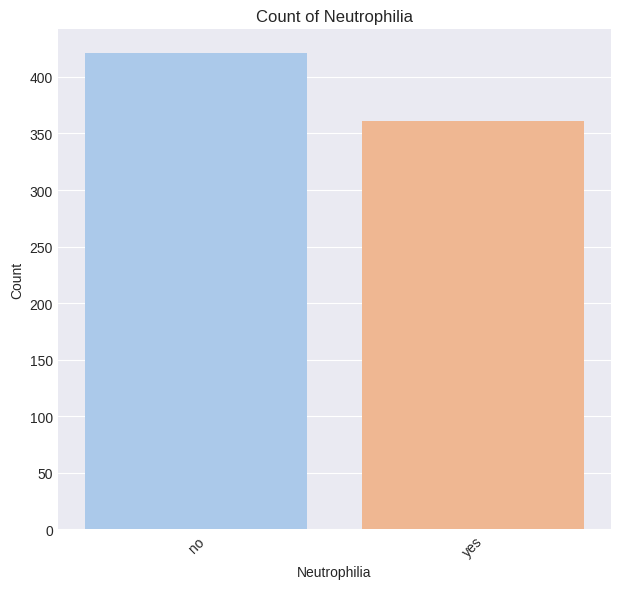

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Ketones_in_Urine: 4
Ketones_in_Urine
no     532
+++    124
+       77
++      49
Name: count, dtype: int64



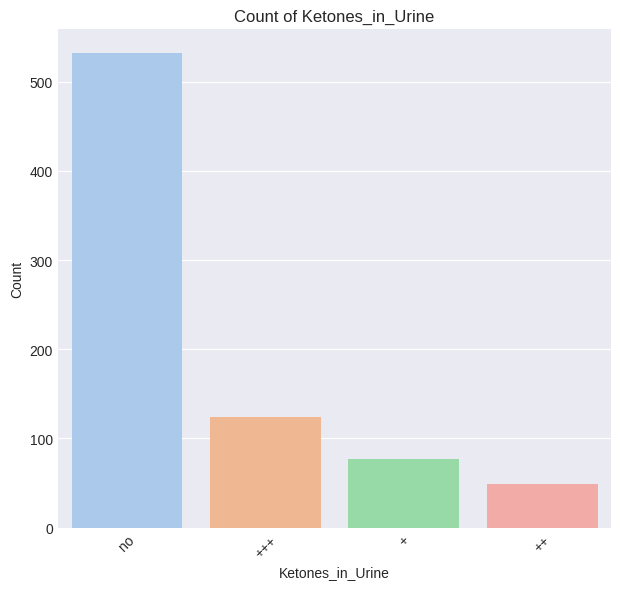

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for RBC_in_Urine: 4
RBC_in_Urine
no     648
+       88
+++     30
++      16
Name: count, dtype: int64



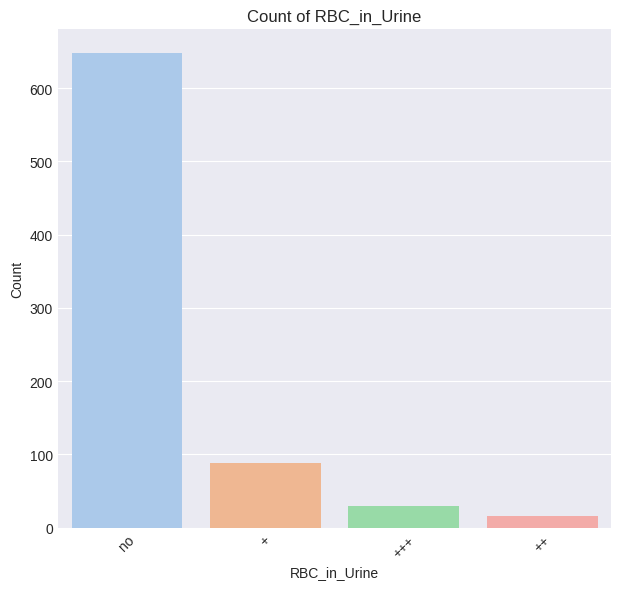

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for WBC_in_Urine: 4
WBC_in_Urine
no     700
+       51
++      19
+++     12
Name: count, dtype: int64



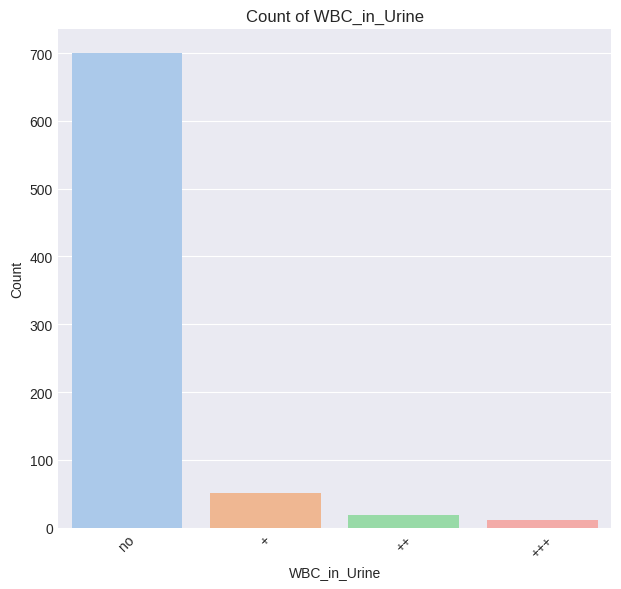

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Dysuria: 2
Dysuria
no     738
yes     44
Name: count, dtype: int64



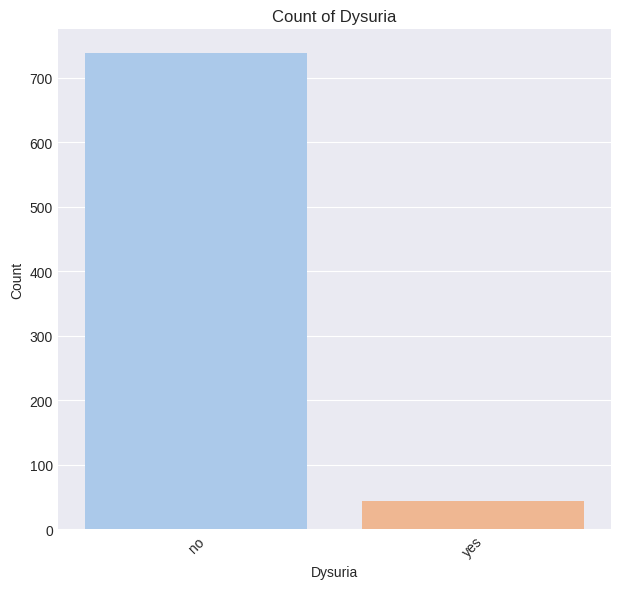

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Stool: 4
Stool
normal                    566
diarrhea                  128
constipation               87
constipation, diarrhea      1
Name: count, dtype: int64



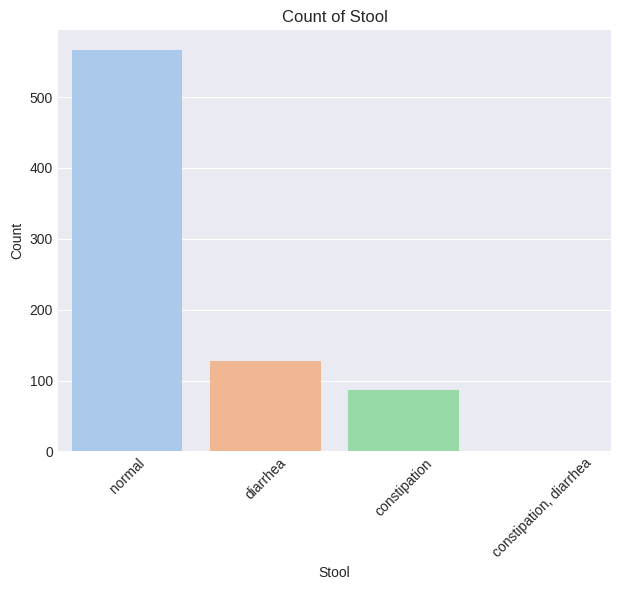

Number of unique values for Peritonitis: 3
Peritonitis
no             549
local          192
generalized     41
Name: count, dtype: int64



<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


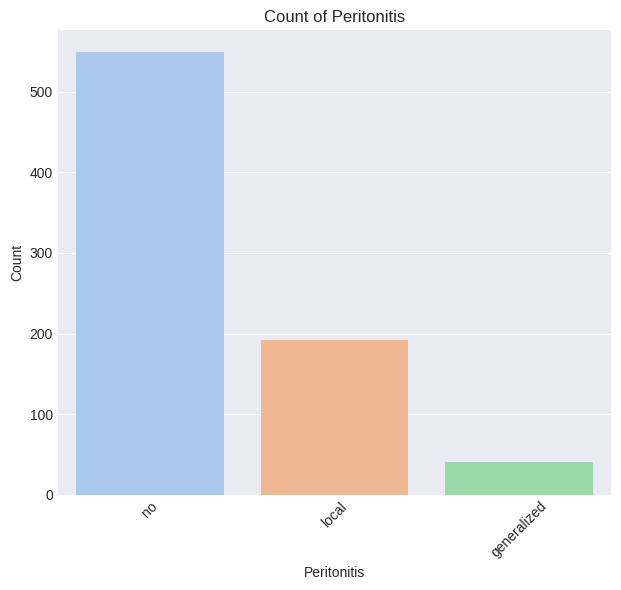

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Psoas_Sign: 2
Psoas_Sign
no     548
yes    234
Name: count, dtype: int64



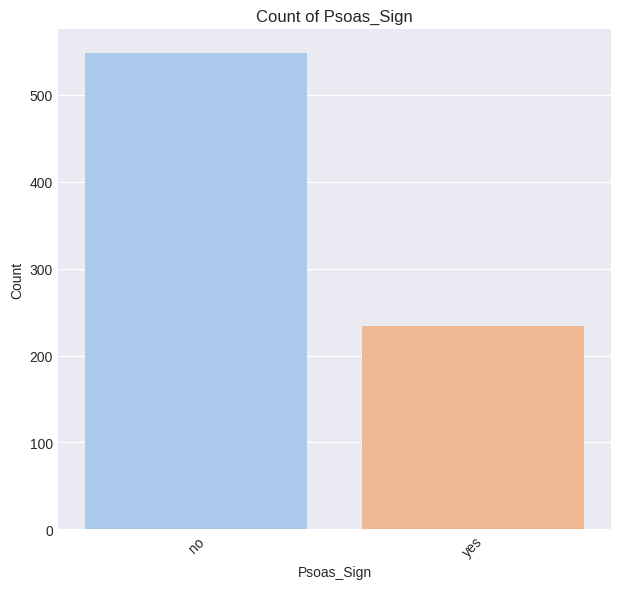

Number of unique values for Ipsilateral_Rebound_Tenderness: 2
Ipsilateral_Rebound_Tenderness
no     744
yes     38
Name: count, dtype: int64



<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


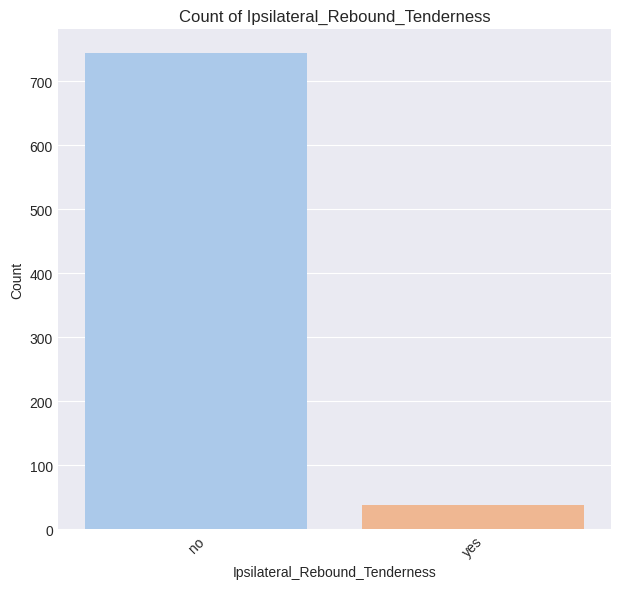

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for US_Performed: 2
US_Performed
yes    767
no      15
Name: count, dtype: int64



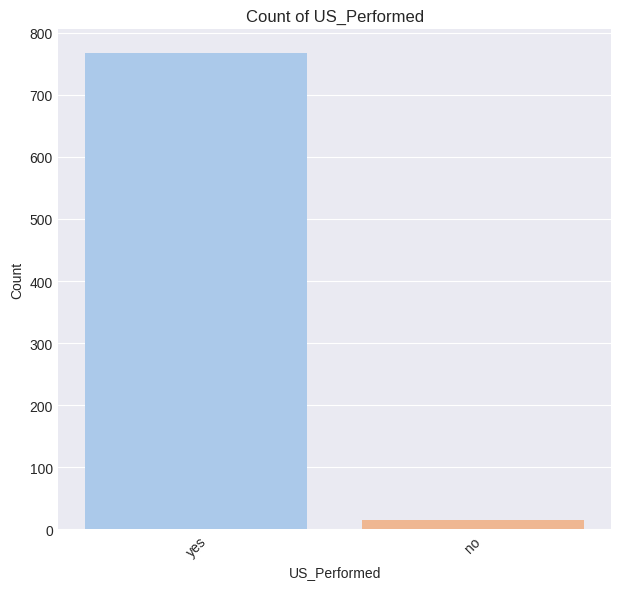

Number of unique values for Free_Fluids: 2
Free_Fluids
no     472
yes    310
Name: count, dtype: int64



<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


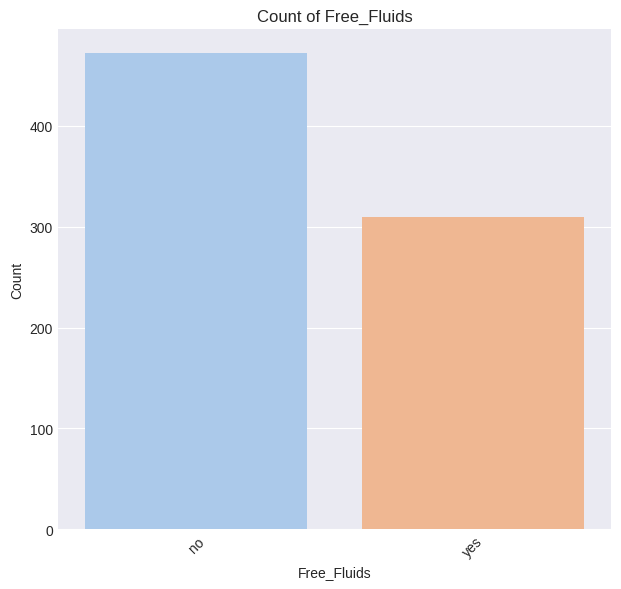

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Appendix_Wall_Layers: 4
Appendix_Wall_Layers
intact              696
raised               76
partially raised      9
upset                 1
Name: count, dtype: int64



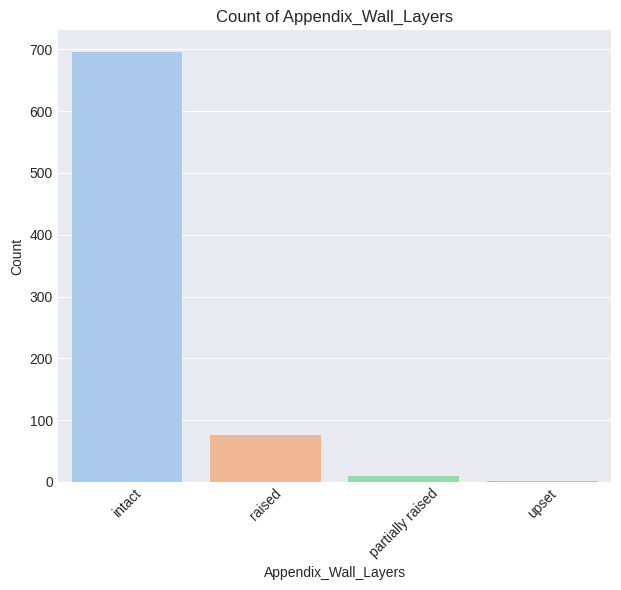

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Target_Sign: 2
Target_Sign
yes    731
no      51
Name: count, dtype: int64



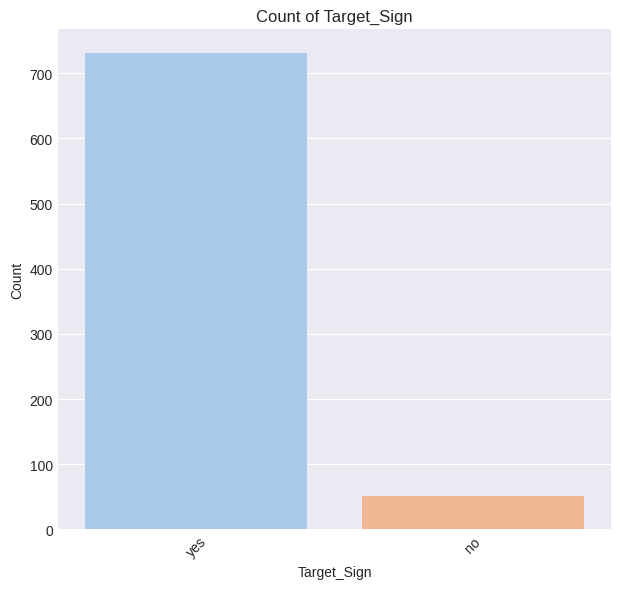

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Appendicolith: 3
Appendicolith
no           746
yes           33
suspected      3
Name: count, dtype: int64



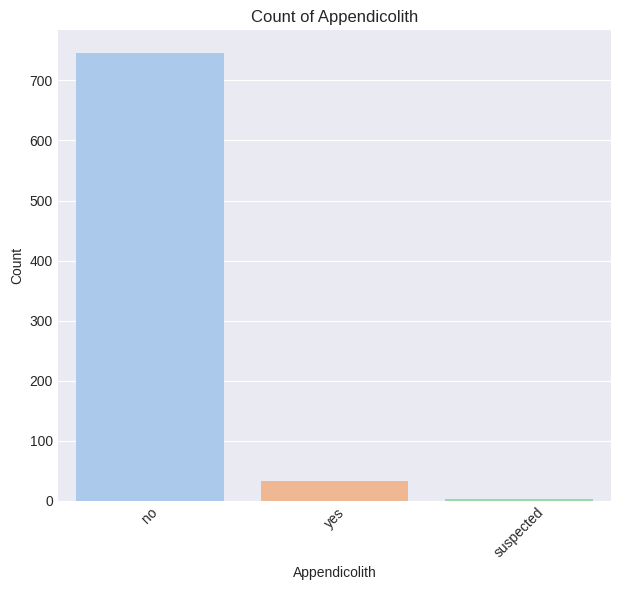

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Perfusion: 4
Perfusion
hyperperfused    750
hypoperfused      28
no                 3
present            1
Name: count, dtype: int64



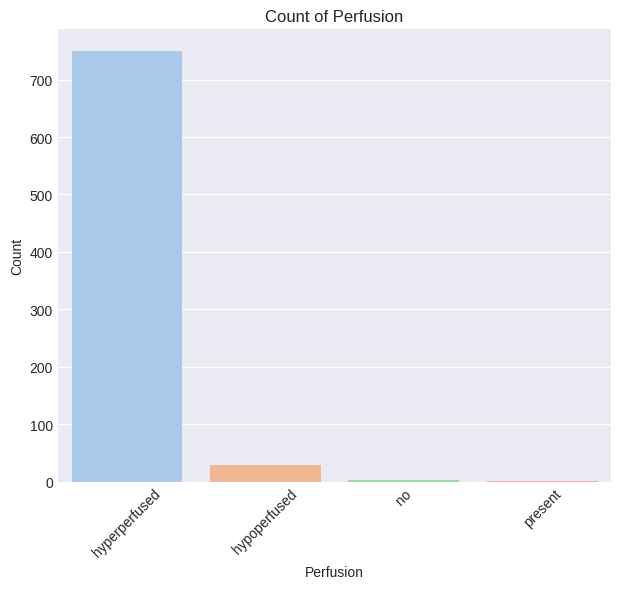

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Perforation: 4
Perforation
no              735
yes              29
not excluded     15
suspected         3
Name: count, dtype: int64



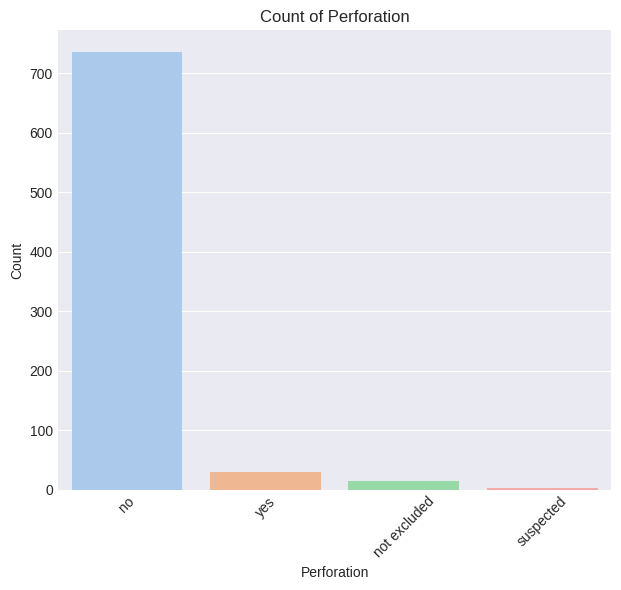

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Surrounding_Tissue_Reaction: 2
Surrounding_Tissue_Reaction
yes    738
no      44
Name: count, dtype: int64



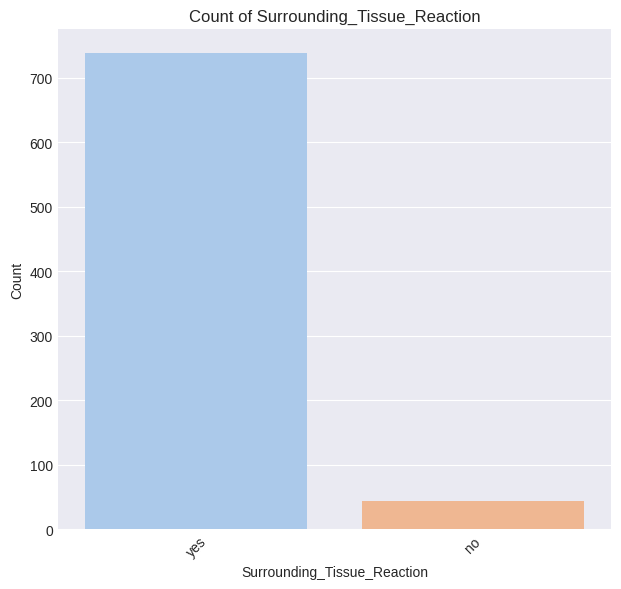

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Appendicular_Abscess: 3
Appendicular_Abscess
no           762
yes           19
suspected      1
Name: count, dtype: int64



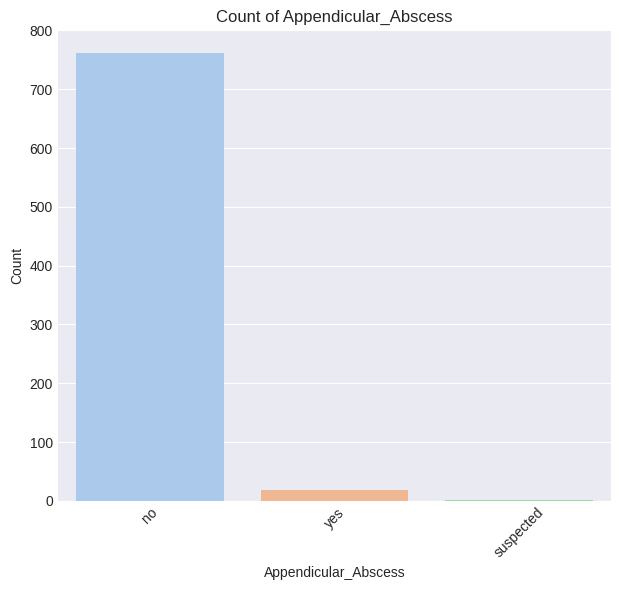

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Abscess_Location: 7
Abscess_Location
Douglas                   775
rechter Unterbauch          2
retrovesikal                1
perityphlitisch             1
an den M. psoas rechts      1
rechter Mittelbauch         1
re Mittelbauch              1
Name: count, dtype: int64



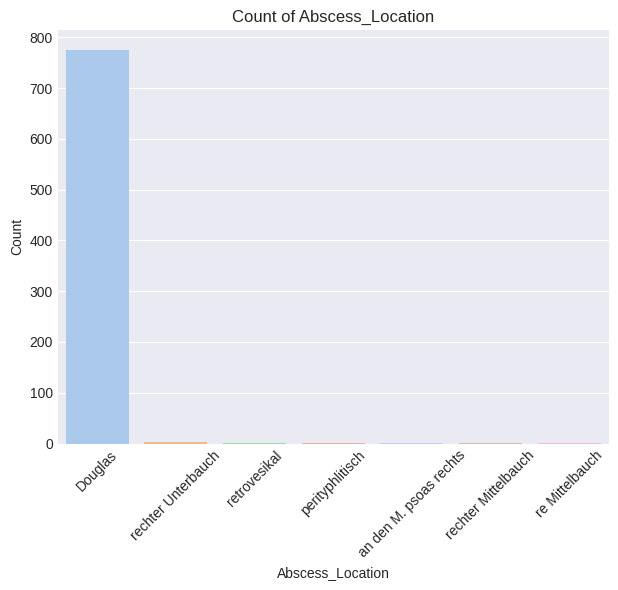

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Pathological_Lymph_Nodes: 2
Pathological_Lymph_Nodes
yes    733
no      49
Name: count, dtype: int64



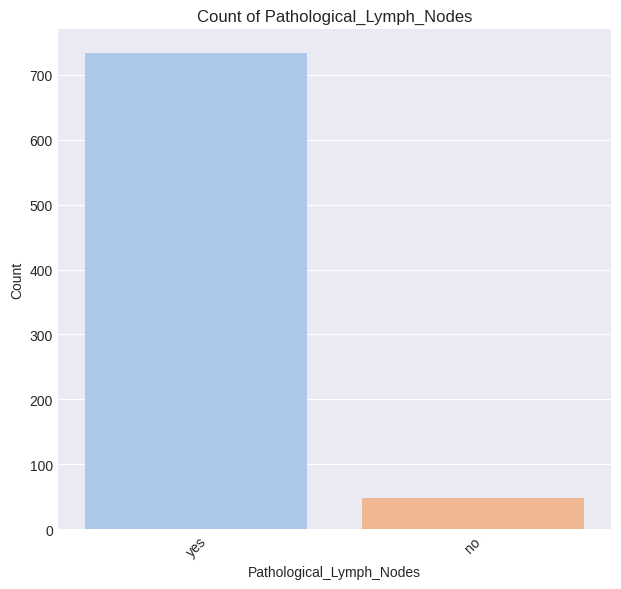

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


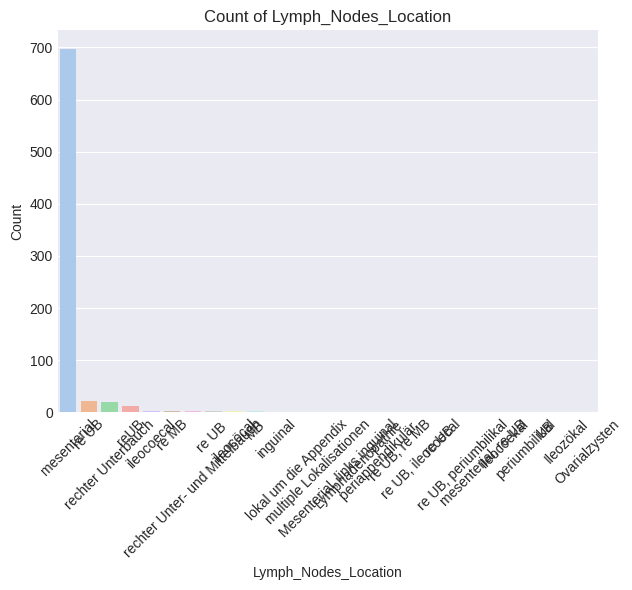

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Bowel_Wall_Thickening: 2
Bowel_Wall_Thickening
yes    738
no      44
Name: count, dtype: int64



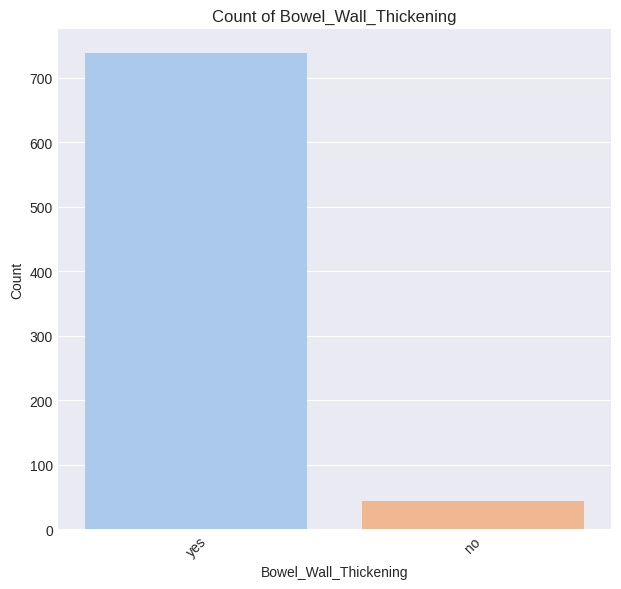

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Conglomerate_of_Bowel_Loops: 2
Conglomerate_of_Bowel_Loops
no     761
yes     21
Name: count, dtype: int64



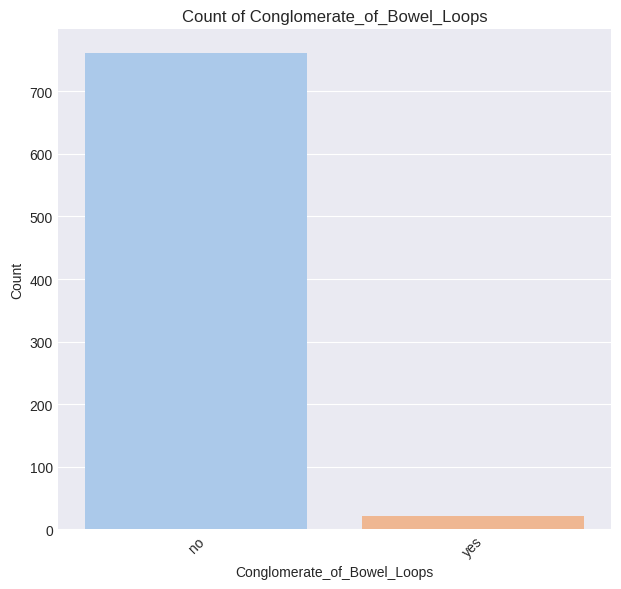

Number of unique values for Ileus: 2
Ileus
no     759
yes     23
Name: count, dtype: int64



<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


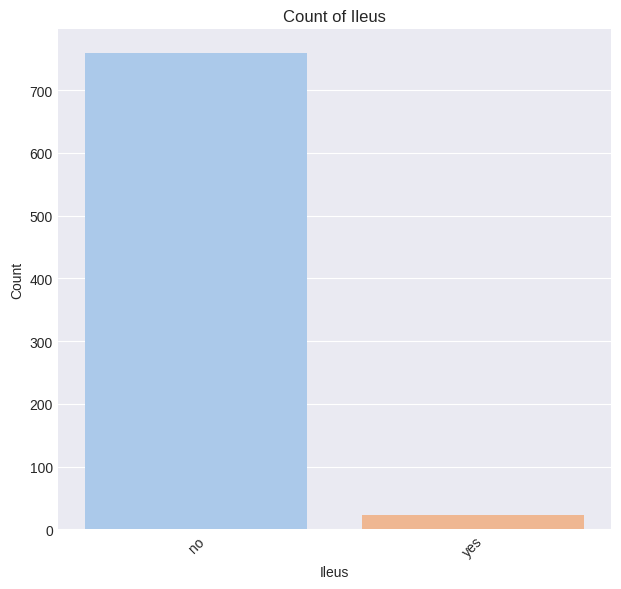

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Coprostasis: 2
Coprostasis
yes    757
no      25
Name: count, dtype: int64



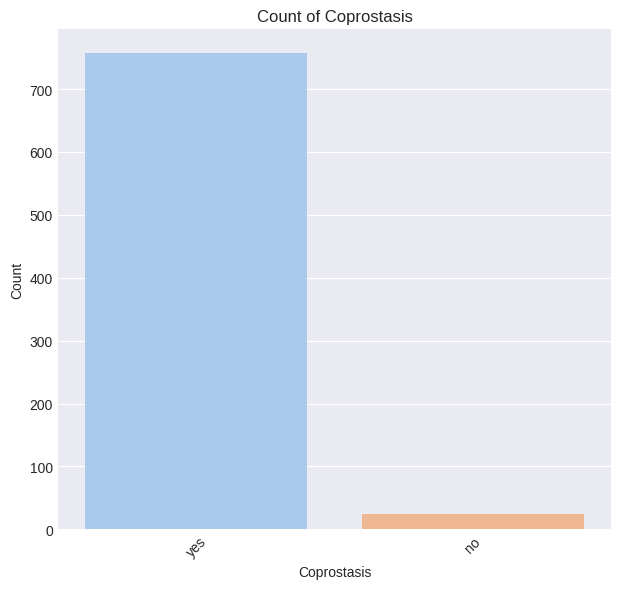

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Meteorism: 2
Meteorism
yes    771
no      11
Name: count, dtype: int64



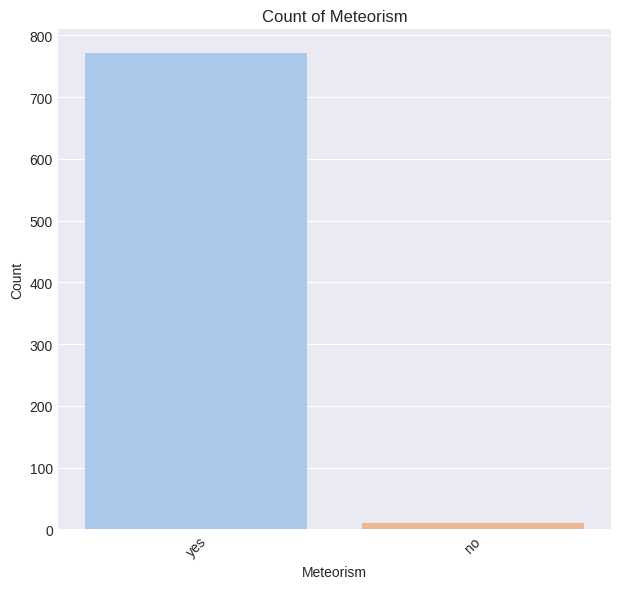

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Enteritis: 2
Enteritis
yes    767
no      15
Name: count, dtype: int64



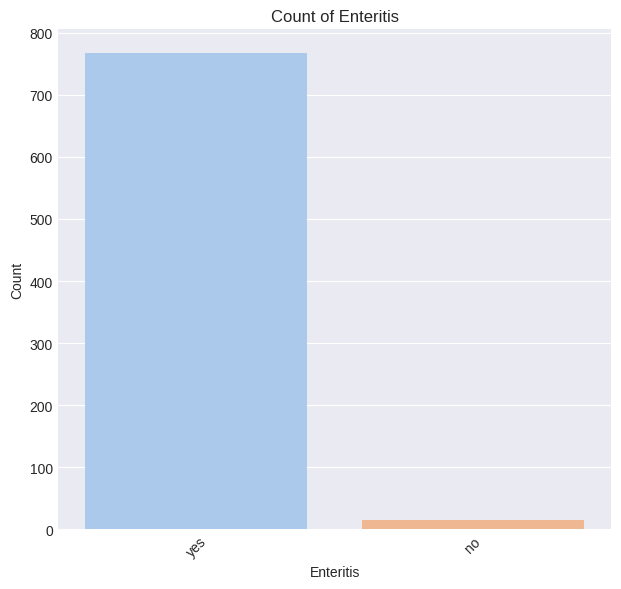

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)
<ipython-input-70-02e604060d94>:96: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


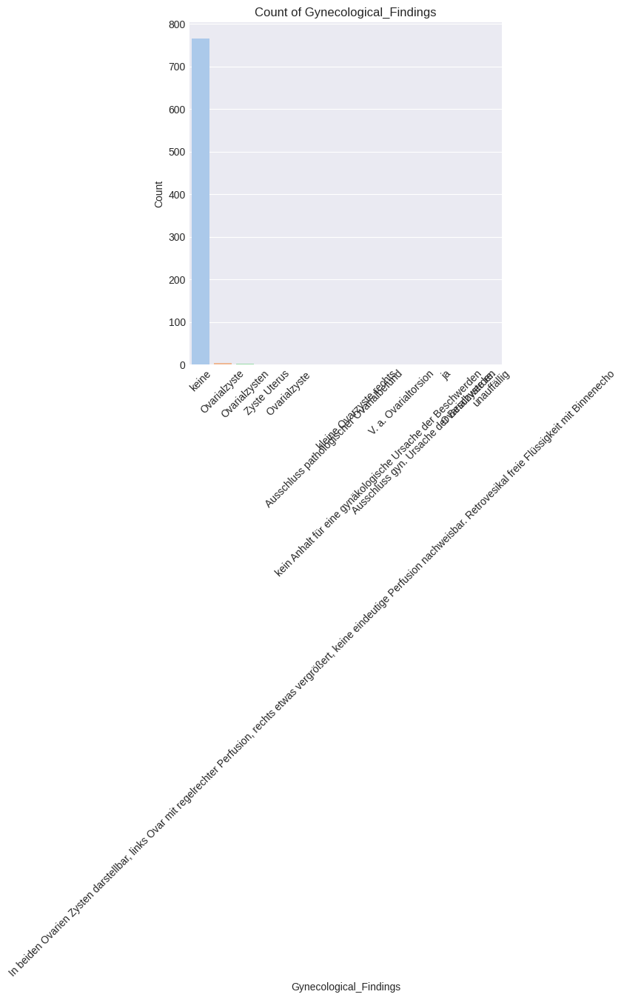

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Management: 4
Management
conservative                 484
primary surgical             270
secondary surgical            27
simultaneous appendectomy      1
Name: count, dtype: int64



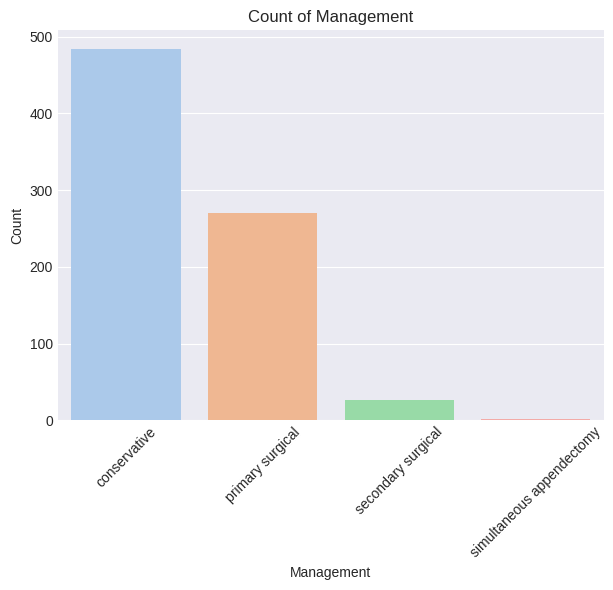

<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


Number of unique values for Severity: 2
Severity
uncomplicated    663
complicated      119
Name: count, dtype: int64



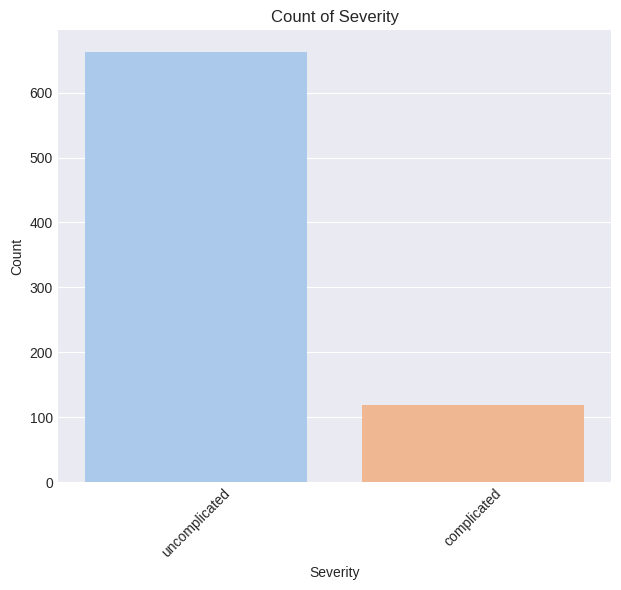

Number of unique values for Diagnosis: 2
Diagnosis
appendicitis       465
no appendicitis    317
Name: count, dtype: int64



<ipython-input-70-02e604060d94>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)


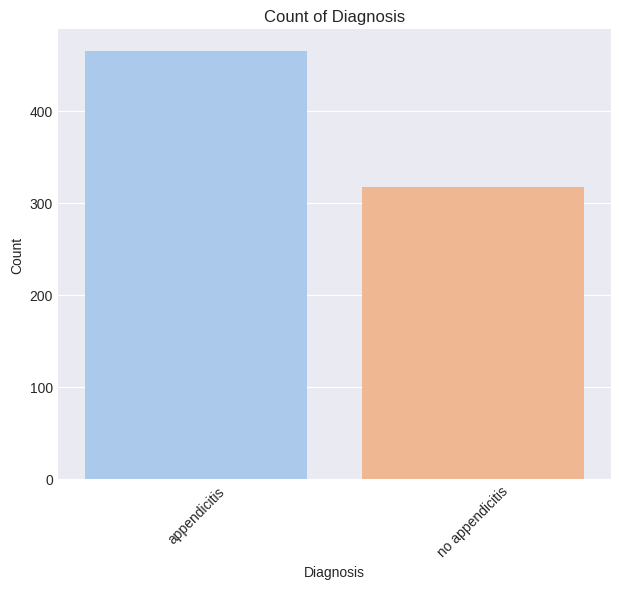

In [70]:
from scipy.stats import skew, kurtosis, iqr, zscore
from tabulate import tabulate  # Ensure you have installed tabulate using pip

def visualize_data(df):
    # Define numerical and categorical columns
    numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
    categorical_columns = df.select_dtypes(include=['object']).columns

    # Initialize figure and overall plot settings
    plt.style.use('seaborn-darkgrid')

    # Table to store statistical summaries
    summary_table = []

    # Loop through numerical columns
    for column in numerical_columns:
        plt.figure(figsize=(16, 8))

        # Distribution plot (histogram with KDE)
        plt.subplot(2, 3, 1)
        sns.histplot(df[column], kde=True, color='skyblue', bins=30)
        plt.title(f'Distribution of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')

        # Box plot to check for outliers using IQR method
        plt.subplot(2, 3, 2)
        sns.boxplot(x=df[column], color='skyblue')
        plt.title(f'Boxplot of {column}')

        # Violin plot to visualize distribution and outliers
        plt.subplot(2, 3, 3)
        sns.violinplot(x=df[column], color='skyblue')
        plt.title(f'Violin plot of {column}')

        plt.tight_layout()
        plt.show()

        # Statistical summaries
        mean_val = df[column].mean()
        median_val = df[column].median()
        std_val = df[column].std()
        skewness_val = skew(df[column])
        kurtosis_val = kurtosis(df[column])

        # Outlier detection using IQR and Z-score
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR_value = iqr(df[column])
        lower_bound = Q1 - 1.5 * IQR_value
        upper_bound = Q3 + 1.5 * IQR_value
        num_outliers_iqr = df[(df[column] < lower_bound) | (df[column] > upper_bound)].shape[0]

        Z_score = np.abs(zscore(df[column]))
        num_outliers_zscore = len(np.where(Z_score > 3)[0])

        # Check for bimodality
        kurtosis_label = 'Leptokurtic (heavy-tailed)' if kurtosis_val > 0 else 'Platykurtic (light-tailed)'

        # Add to summary table
        summary_table.append([
            column,
            mean_val,
            median_val,
            std_val,
            skewness_val,
            kurtosis_val,
            num_outliers_iqr,
            num_outliers_zscore,
            kurtosis_label
        ])

    # Print tabular summary
    headers = ['Column', 'Mean', 'Median', 'Std Deviation', 'Skewness', 'Kurtosis', 'Outliers (IQR)', 'Outliers (Z-score)', 'Kurtosis Type']
    print(tabulate(summary_table, headers=headers, floatfmt=".2f"))

    # Plotting key information for categorical columns
    for column in categorical_columns:
        plt.figure(figsize=(12, 6))

        # Count plot for categorical variables
        plt.subplot(1, 2, 1)
        sns.countplot(x=df[column], palette='pastel', order=df[column].value_counts().index)
        plt.title(f'Count of {column}')
        plt.xlabel(column)
        plt.ylabel('Count')

        # Check for imbalance
        unique_vals = df[column].nunique()
        if unique_vals <= 10:
            print(f"Number of unique values for {column}: {unique_vals}")
            print(df[column].value_counts())
            print()

        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

# Visualize the data
visualize_data(df)

## **chi square Test:** ##  
 (only for categorical variables.)

 We can use the chi-square test to determine if there is a significant association between two categorical variables.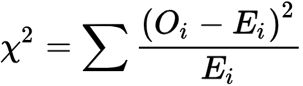

**If p value is less than 0.05 then we will reject the Null hypothesis.**


In [15]:
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(df['Sex'], df['Diagnosis'])

# Perform chi-square test
chi2_stat, p_val, dof, ex = chi2_contingency(contingency_table)
print("Chi-square statistic:", chi2_stat)
print("P-value:", p_val)

Chi-square statistic: 10.92480288500062
P-value: 0.0009488529820487272


**This indicates that there is a statistically significant association between the patient's sex and the diagnosis of appendicitis.**

In [16]:
## Let's do something more:-
chi2_results = []

In [17]:
for column in categorical_columns:
    contingency_table = pd.crosstab(df[column], df['Diagnosis'])
    chi2_stat, p_val, dof, ex = chi2_contingency(contingency_table)
    chi2_results.append({
        'Column': column,
        'Chi-square Statistic': chi2_stat,
        'P-value': p_val,
        'Degrees of Freedom': dof
    })


In [18]:
# Convert results to DataFrame for better visualization
chi2_results_df = pd.DataFrame(chi2_results)

In [19]:
chi2_results_df.head()

,Column,Chi-square Statistic,P-value,Degrees of Freedom
0,Sex,10.924803,9.488530e-04,1
1,Appendix_on_US,148.799262,3.172628e-34,1
2,Migratory_Pain,6.085484,1.362970e-02,1
3,Lower_Right_Abd_Pain,8.419996,3.711166e-03,1
4,Contralateral_Rebound_Tenderness,22.036838,2.674674e-06,1


**Observations**

1.   The p-value is extremely small (almost zero), indicating a very strong association between the visibility of the appendix on ultrasound and the diagnosis of appendicitis.
2.   The presence of migratory pain is an important symptom for diagnosing appendicitis.
3.   All tested variables (Sex, Appendix_on_US, Migratory_Pain, Lower_Right_Abd_Pain, Contralateral_Rebound_Tenderness) show a significant association with the diagnosis of appendicitis.








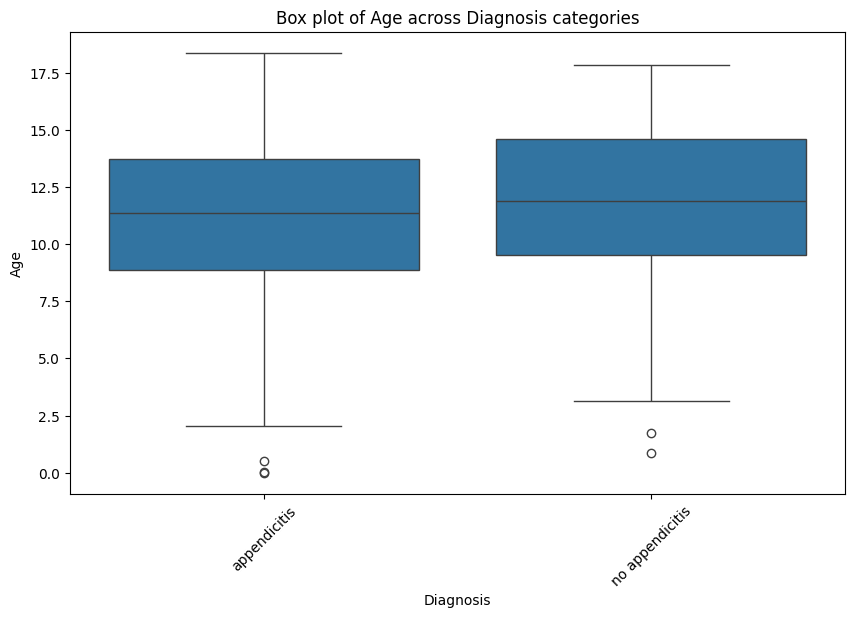

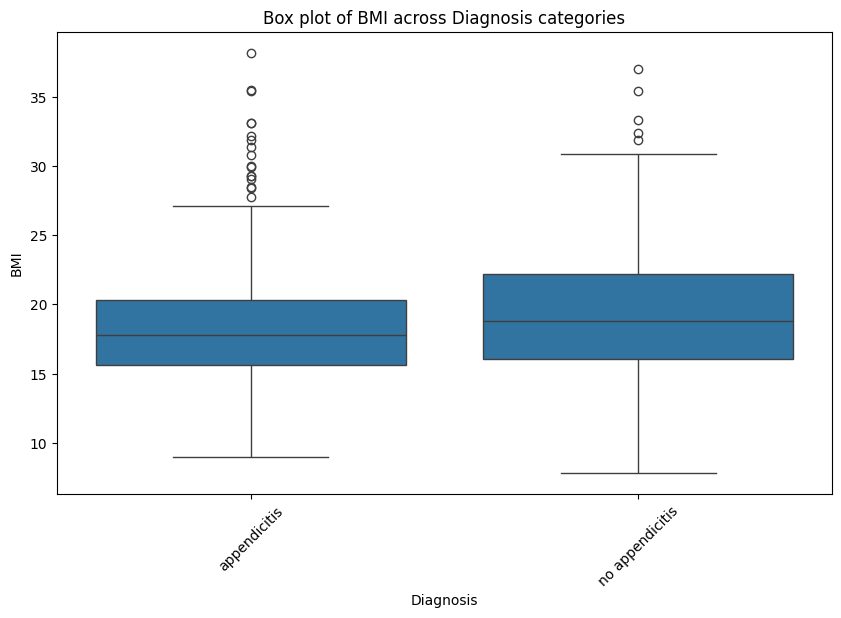

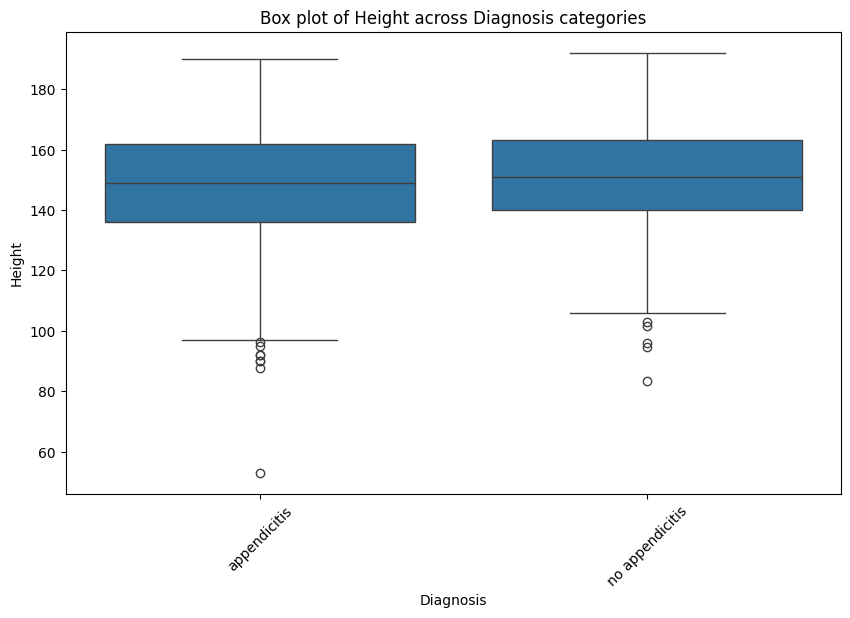

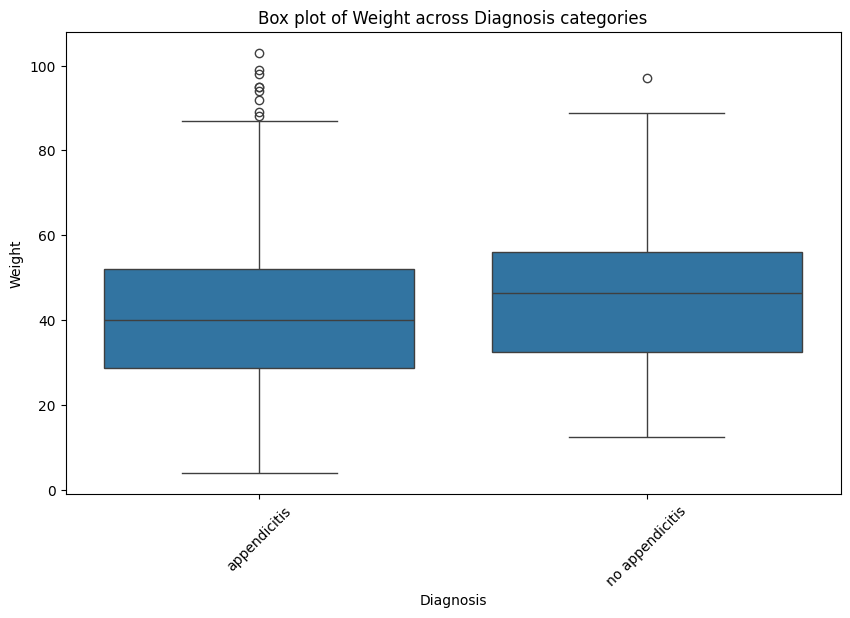

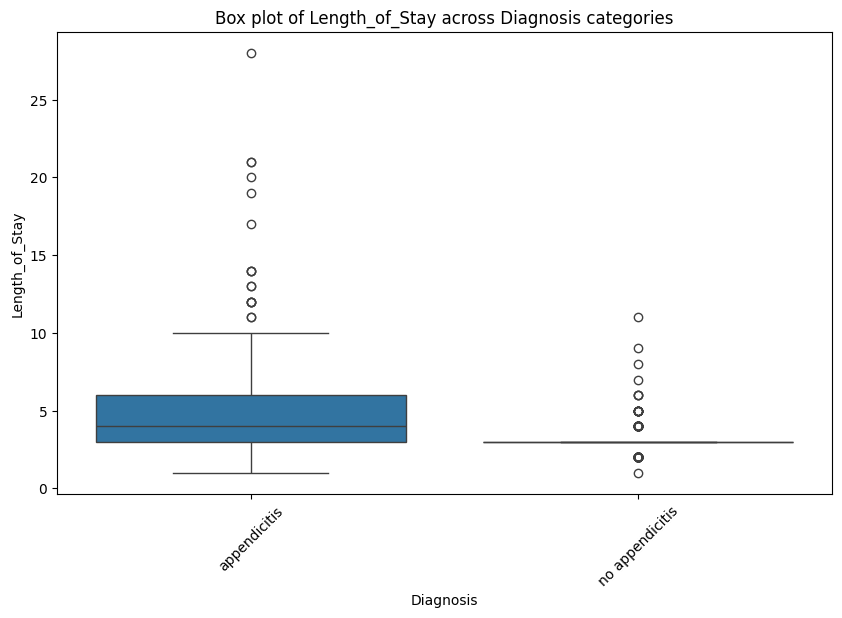

...

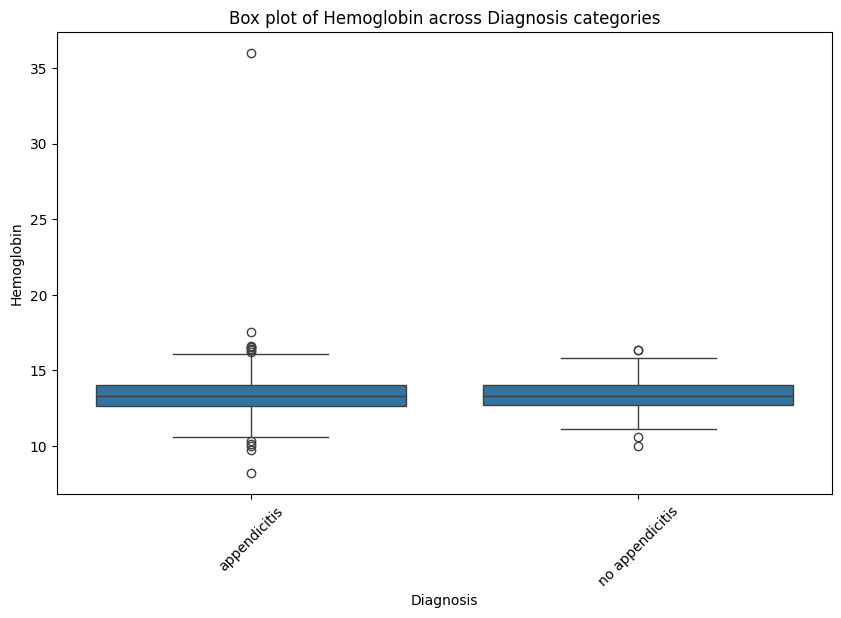

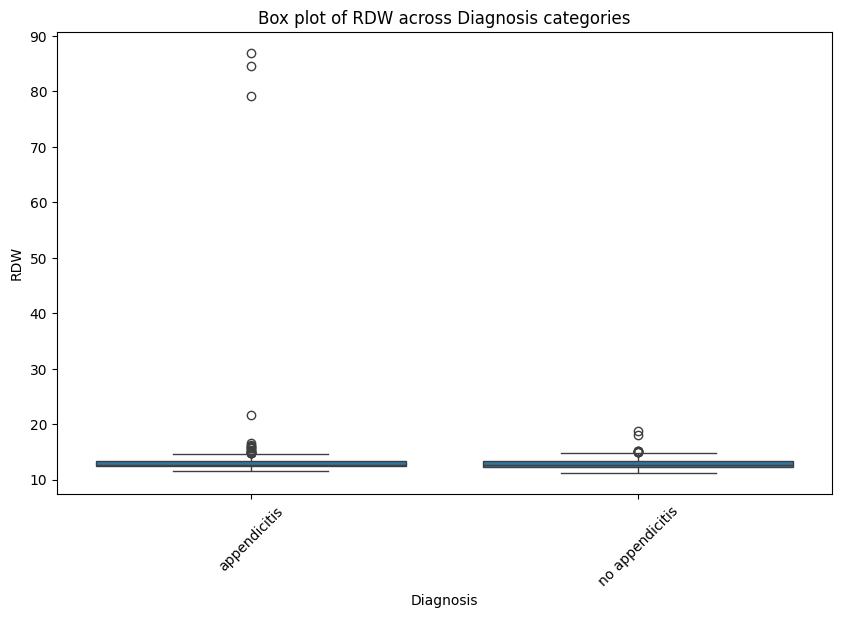

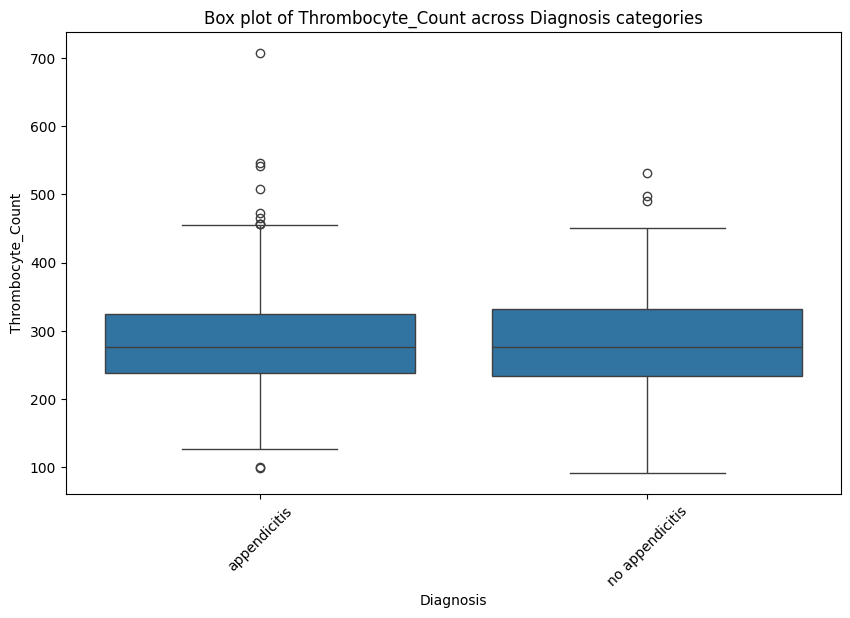

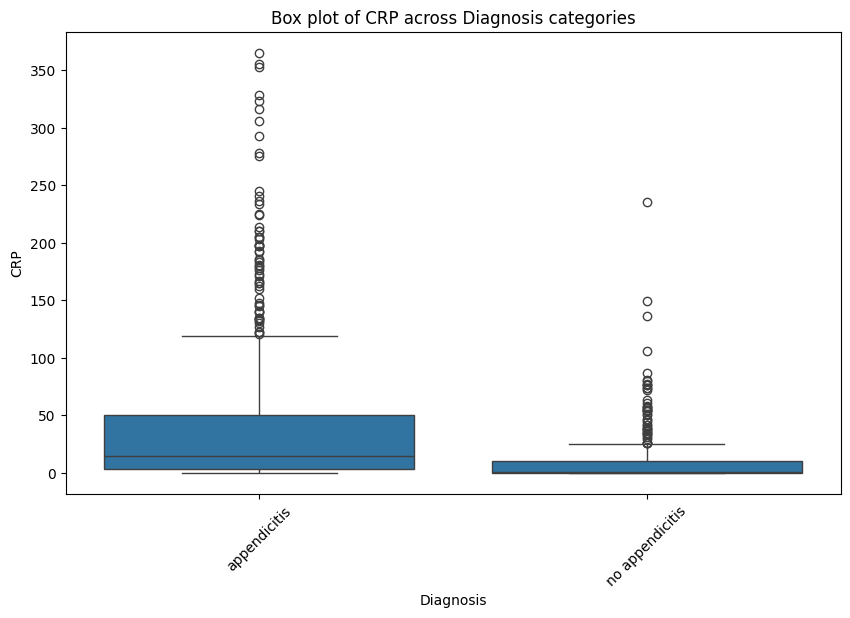

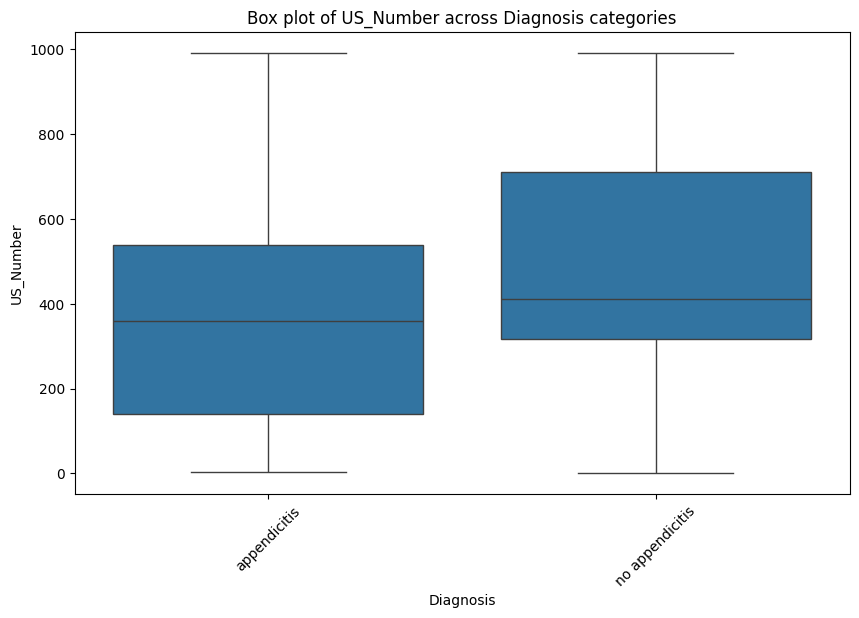

In [20]:
for column in numerical_columns:
    if df[column].notnull().any() and 'Diagnosis' in categorical_columns:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x='Diagnosis', y=column, data=df)
        plt.title(f'Box plot of {column} across Diagnosis categories')
        plt.xlabel('Diagnosis')
        plt.ylabel(column)
        plt.xticks(rotation=45)
        plt.show()

**Pearson Correlation:** Measures the linear relationship between two continuous variables.

**Spearman Correlation:** Measures the monotonic relationship between two variables (does not assume linearity).

In [21]:
def calculate_correlations(df):
    numerical_columns = df.select_dtypes(include=[np.number]).columns  # Select numerical columns
    correlations_pearson = df[numerical_columns].corr(method='pearson')
    correlations_spearman = df[numerical_columns].corr(method='spearman')

    # Plotting Pearson correlations
    plt.figure(figsize=(12, 8))
    sns.heatmap(correlations_pearson, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title('Pearson Correlation Heatmap')
    plt.show()

    # Plotting Spearman correlations
    plt.figure(figsize=(12, 8))
    sns.heatmap(correlations_spearman, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title('Spearman Correlation Heatmap')
    plt.show()

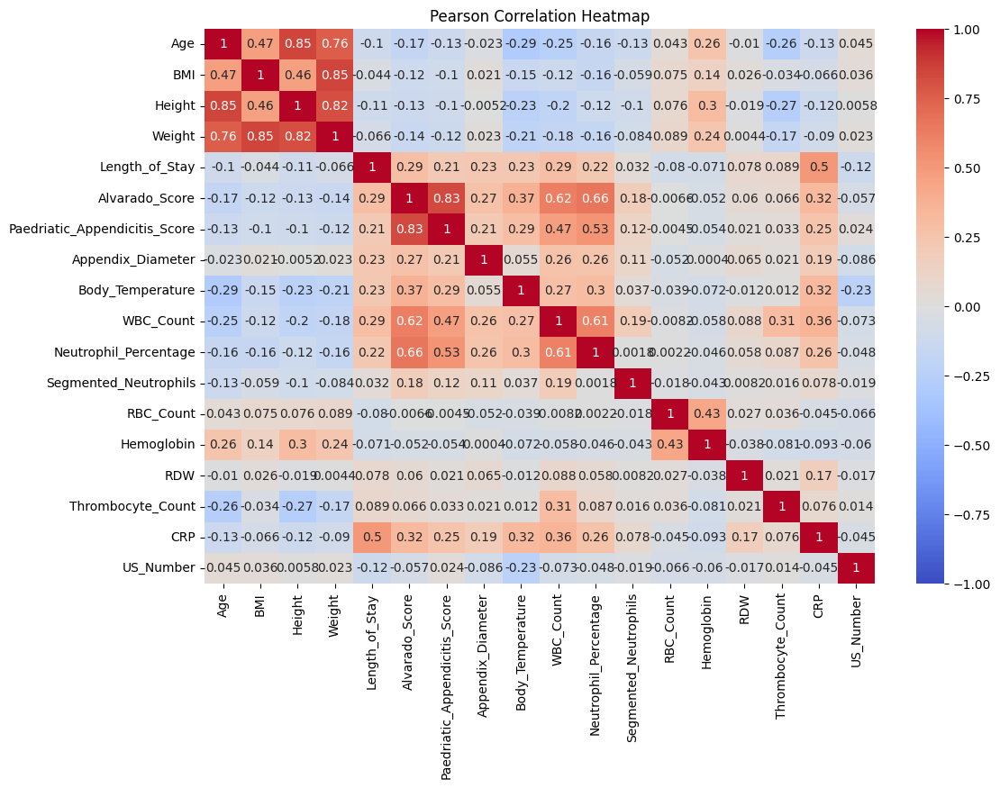

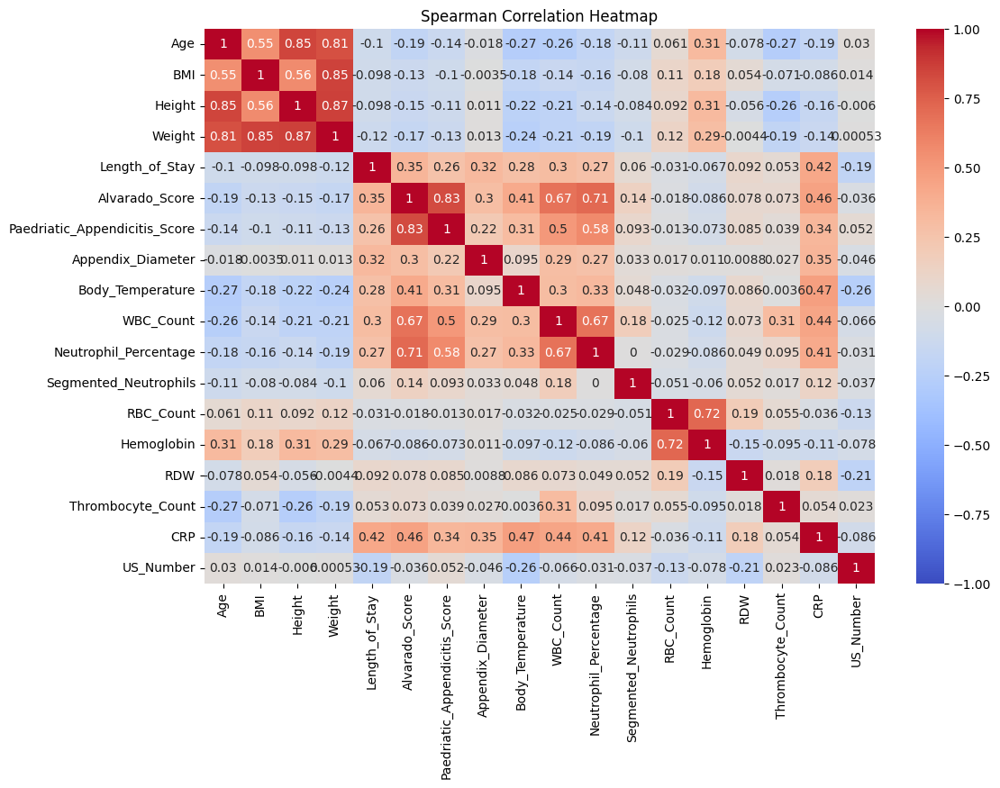

In [22]:
calculate_correlations(df)

Analysis of variance **ANOVA** is a collection of statistical models and their associated estimation procedures used to analyze the differences among means.

 ## **Preprocessing and Model Training**

In [23]:
categorical_columns = categorical_columns.drop('Diagnosis')


In [24]:
numerical_columns

Index(['Age', 'BMI', 'Height', 'Weight', 'Length_of_Stay', 'Alvarado_Score',
       'Paedriatic_Appendicitis_Score', 'Appendix_Diameter',
       'Body_Temperature', 'WBC_Count', 'Neutrophil_Percentage',
       'Segmented_Neutrophils', 'RBC_Count', 'Hemoglobin', 'RDW',
       'Thrombocyte_Count', 'CRP', 'US_Number'],
      dtype='object')

In [25]:
categorical_columns

Index(['Sex', 'Appendix_on_US', 'Migratory_Pain', 'Lower_Right_Abd_Pain',
       'Contralateral_Rebound_Tenderness', 'Coughing_Pain', 'Nausea',
       'Loss_of_Appetite', 'Neutrophilia', 'Ketones_in_Urine', 'RBC_in_Urine',
       'WBC_in_Urine', 'Dysuria', 'Stool', 'Peritonitis', 'Psoas_Sign',
       'Ipsilateral_Rebound_Tenderness', 'US_Performed', 'Free_Fluids',
       'Appendix_Wall_Layers', 'Target_Sign', 'Appendicolith', 'Perfusion',
       'Perforation', 'Surrounding_Tissue_Reaction', 'Appendicular_Abscess',
       'Abscess_Location', 'Pathological_Lymph_Nodes', 'Lymph_Nodes_Location',
       'Bowel_Wall_Thickening', 'Conglomerate_of_Bowel_Loops', 'Ileus',
       'Coprostasis', 'Meteorism', 'Enteritis', 'Gynecological_Findings',
       'Management', 'Severity'],
      dtype='object')

In [26]:
y = df['Diagnosis']


In [27]:
X = df.drop('Diagnosis', axis=1)

In [28]:
# Create pipeline for preprocessing
numeric_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="mean")),
    ("scaler",StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot", OneHotEncoder(handle_unknown="ignore"))
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_columns),
        ("cat", categorical_transformer, categorical_columns)
    ])

In [29]:
# Preprocess data and transform it
X_processed = preprocessor.fit_transform(X)

In [30]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_processed, y, test_size=0.2, random_state=42)

In [ ]:
y_train

602       appendicitis
133    no appendicitis
239       appendicitis
55        appendicitis
613       appendicitis
            ...       
71     no appendicitis
106    no appendicitis
270       appendicitis
435    no appendicitis
102       appendicitis
Name: Diagnosis, Length: 625, dtype: object

In [ ]:
X_train

array([[ 0.31583115,  0.09567035,  0.66672859, ...,  0.        ,
         0.        ,  1.        ],
       [-0.11816287, -0.11087975, -0.54519945, ...,  0.        ,
         0.        ,  1.        ],
       [ 1.53838945,  1.51367162,  0.92458562, ...,  0.        ,
         0.        ,  1.        ],
       ...,
       [-0.47273315, -0.29654276, -0.26155672, ...,  0.        ,
         0.        ,  1.        ],
       [ 0.73564235, -0.66786879, -0.28734242, ...,  0.        ,
         0.        ,  1.        ],
       [ 0.46333238,  0.30686203,  0.56358578, ...,  0.        ,
         0.        ,  1.        ]])

In [31]:
log_reg = LogisticRegression(max_iter=1000)

In [32]:

# Train the model
log_reg.fit(X_train, y_train)

# Predict
log_reg_pred = log_reg.predict(X_test)

# Evaluate
log_reg_acc = accuracy_score(y_test, log_reg_pred)

# Calculate accuracy
accuracy = accuracy_score(y_test, log_reg_pred)
print("Accuracy:", "{:.4f}".format(accuracy))

Accuracy: 0.8981


In [33]:
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'Extra Trees': ExtraTreesClassifier(),
    'SVM': SVC(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'MLP Classifier': MLPClassifier(max_iter=1000),
    'Linear Discriminant Analysis': LinearDiscriminantAnalysis(),
    'Quadratic Discriminant Analysis': QuadraticDiscriminantAnalysis()
}


In [34]:

results = {}

for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    results[model_name] = [accuracy, precision, recall, f1]


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


## **Model Performance Analysis:-**

In [35]:
results_df = pd.DataFrame(results, index=['Accuracy', 'Precision', 'Recall', 'F1 Score'])
print(results_df)

           Logistic Regression  Decision Tree  Random Forest  AdaBoost  \
Accuracy              0.898089       0.923567       0.923567  0.961783   
Precision             0.902124       0.925535       0.923567  0.961783   
Recall                0.898089       0.923567       0.923567  0.961783   
F1 Score              0.898779       0.923939       0.923567  0.961783   

           Gradient Boosting  Extra Trees       SVM  K-Nearest Neighbors  \
Accuracy            0.987261     0.878981  0.910828             0.802548   
Precision           0.987524     0.879382  0.919945             0.811363   
Recall              0.987261     0.878981  0.910828             0.802548   
F1 Score            0.987223     0.879145  0.911678             0.804319   

           MLP Classifier  Linear Discriminant Analysis  \
Accuracy         0.898089                      0.859873   
Precision        0.900270                      0.872827   
Recall           0.898089                      0.859873   
F1 Score    

In [36]:
results_df = results_df.T


In [37]:
# Separate the metrics
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']

colors = sns.color_palette("coolwarm", len(results_df))

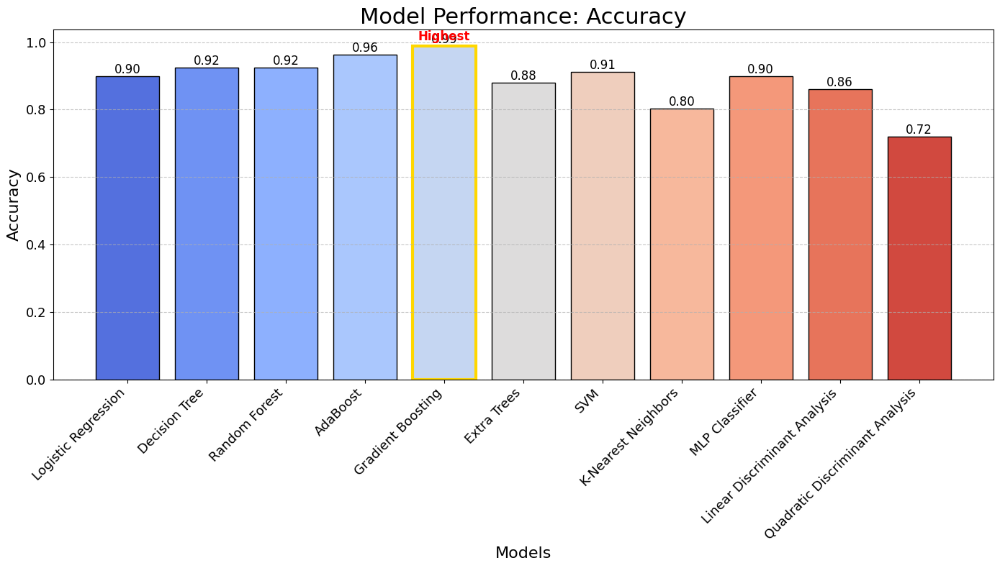

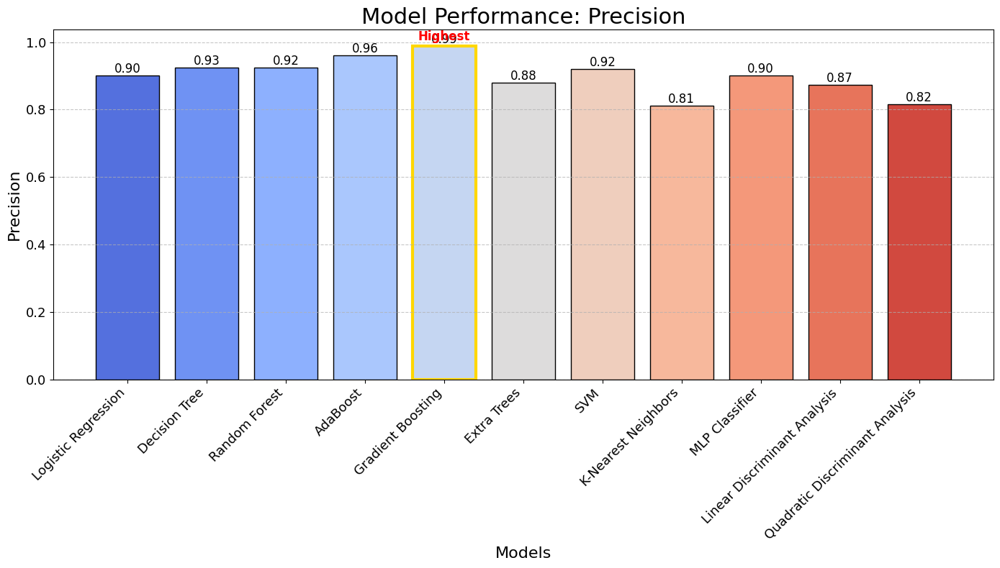

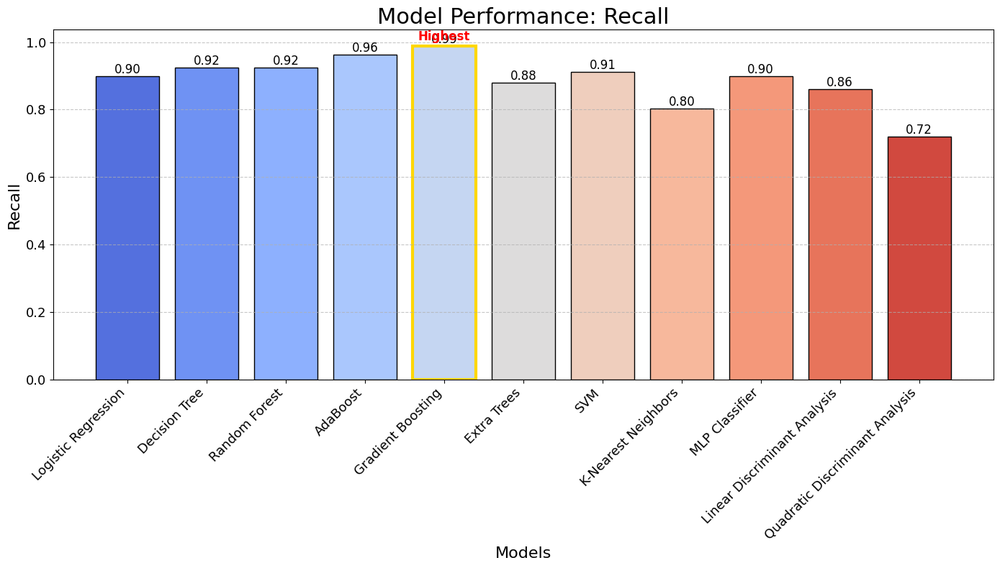

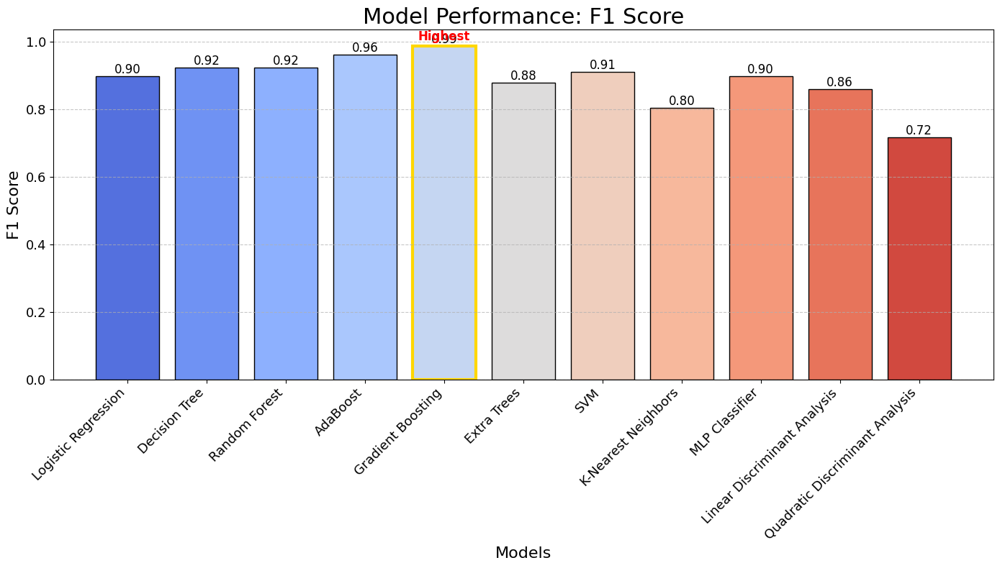

In [38]:
# Plot each metric separately
for metric in metrics:
    plt.figure(figsize=(14, 8))
    bars = plt.bar(results_df.index, results_df[metric], color=colors, edgecolor='black')

    # Adding title and labels
    plt.title(f'Model Performance: {metric}', fontsize=22)
    plt.xlabel('Models', fontsize=16)
    plt.ylabel(metric, fontsize=16)
    plt.xticks(rotation=45, ha='right', fontsize=13)
    plt.yticks(fontsize=13)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Adding values on top of the bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2., height,
                 f'{height:.2f}', ha='center', va='bottom', fontsize=12, color='black')

    # Highlight the highest value
    max_height = max(results_df[metric])
    for bar in bars:
        if bar.get_height() == max_height:
            bar.set_edgecolor('gold')
            bar.set_linewidth(3)
            plt.text(bar.get_x() + bar.get_width() / 2., bar.get_height() + 0.01,
                     'Highest', ha='center', va='bottom', fontsize=12, color='red', fontweight='bold')

    plt.tight_layout()
    plt.show()

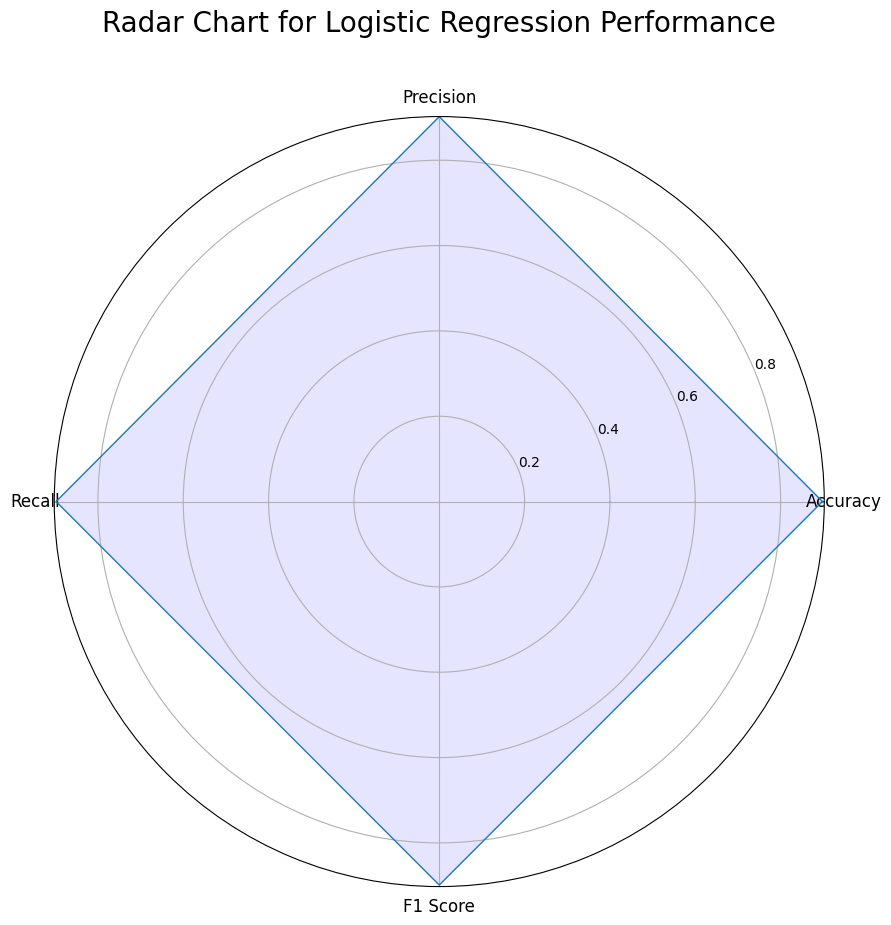

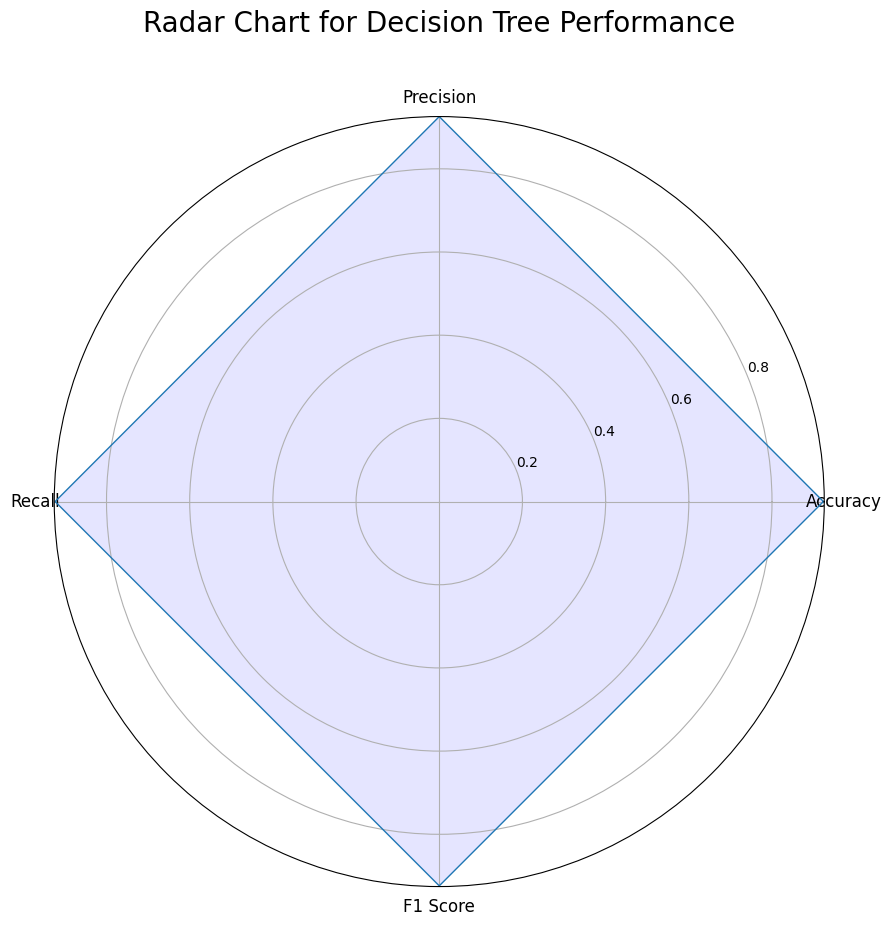

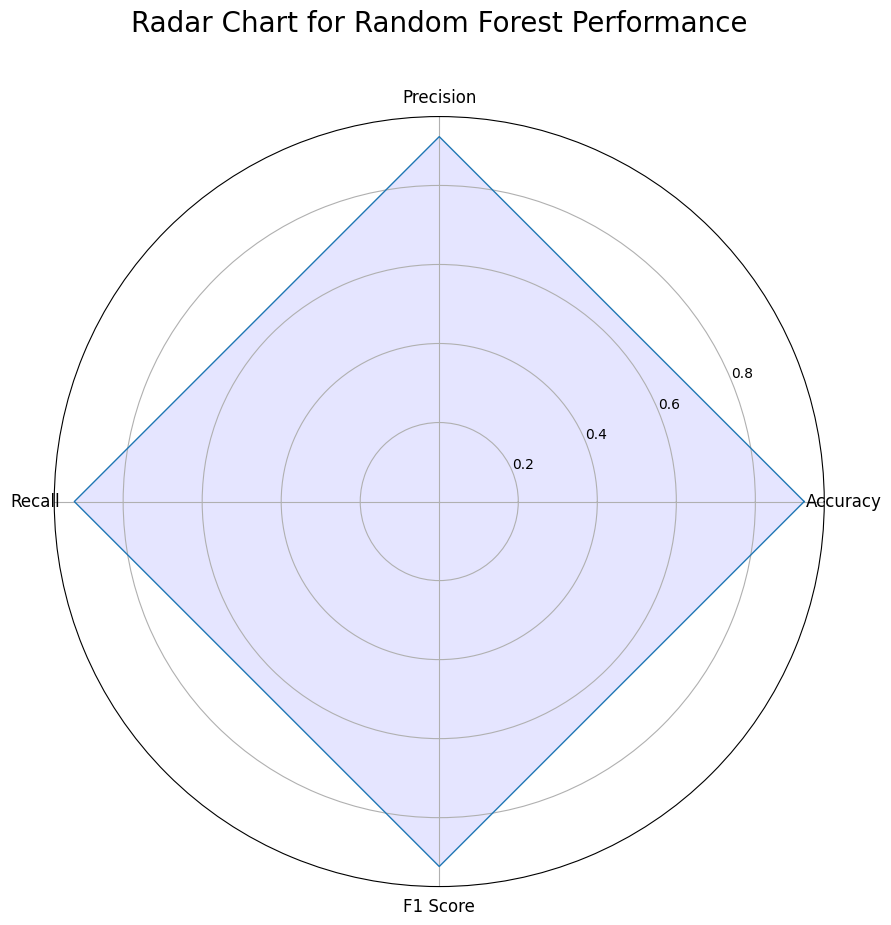

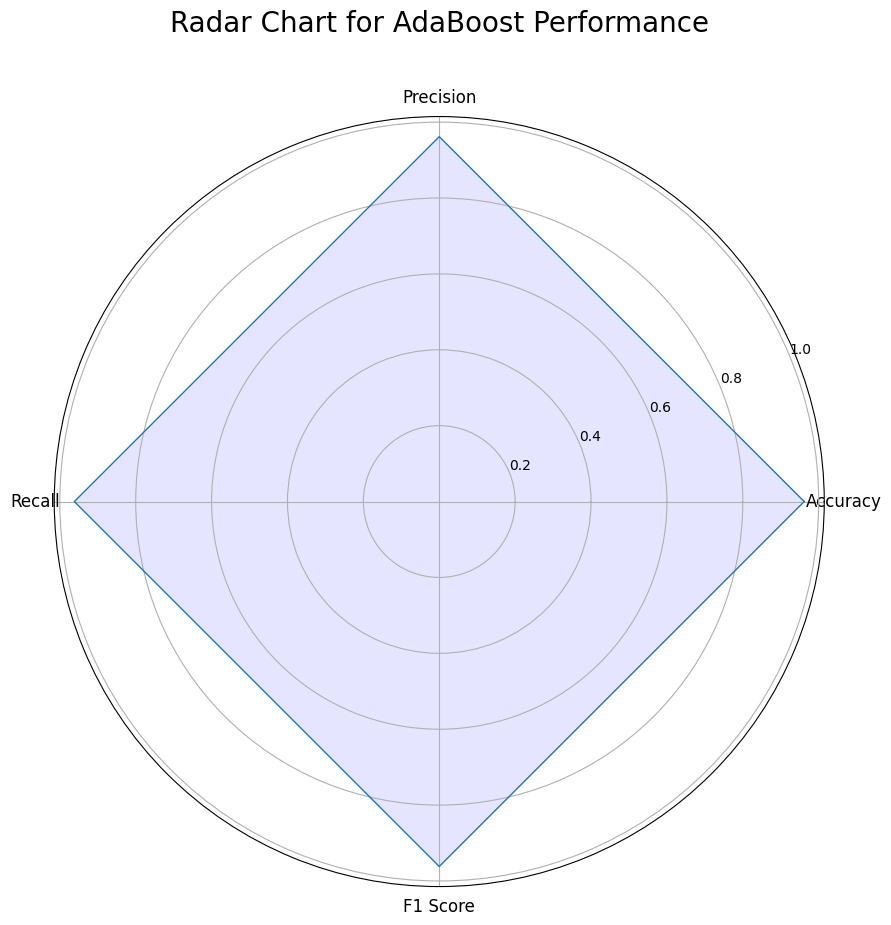

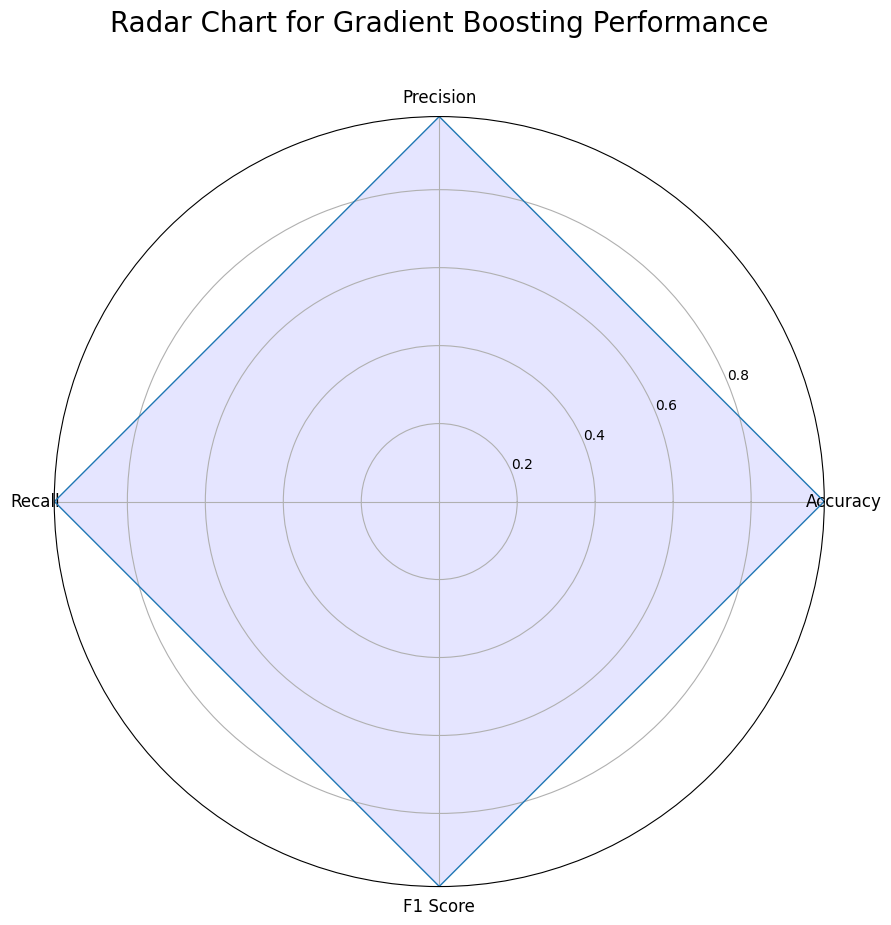

...

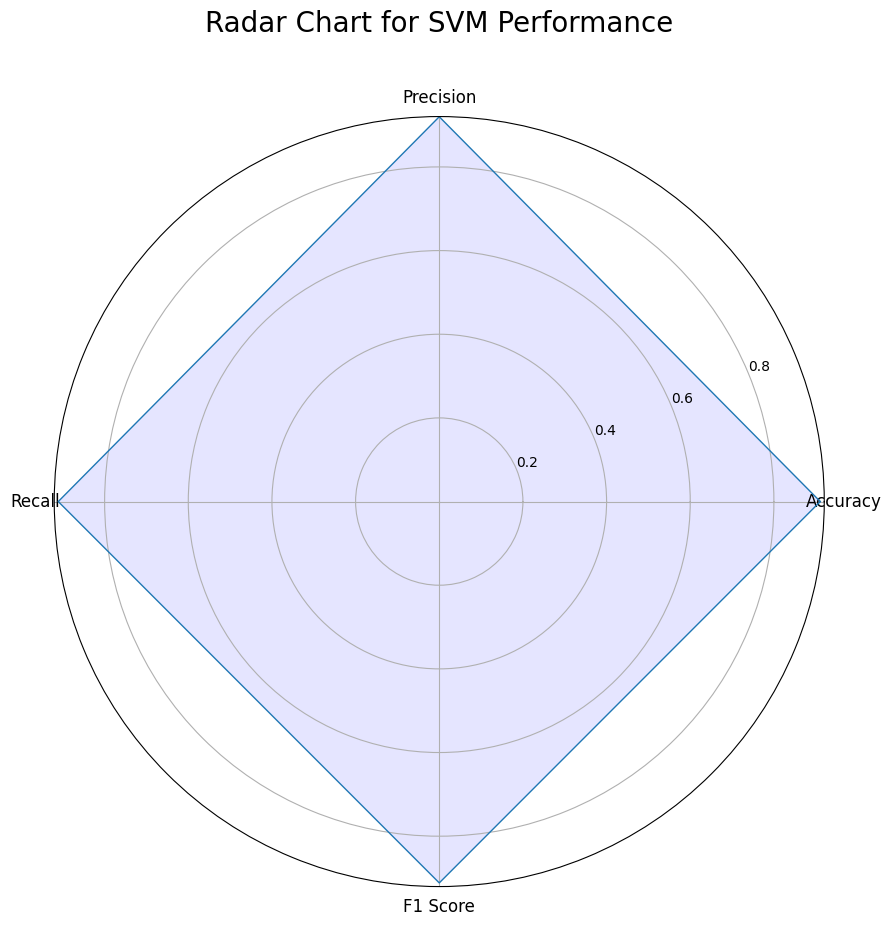

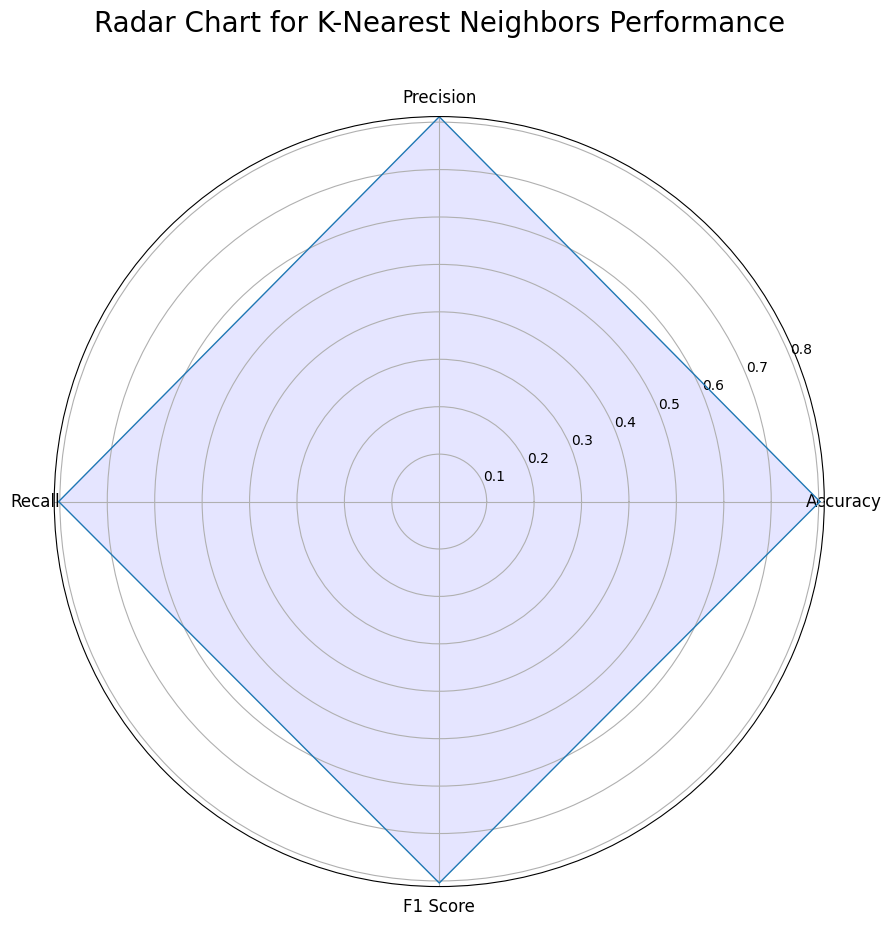

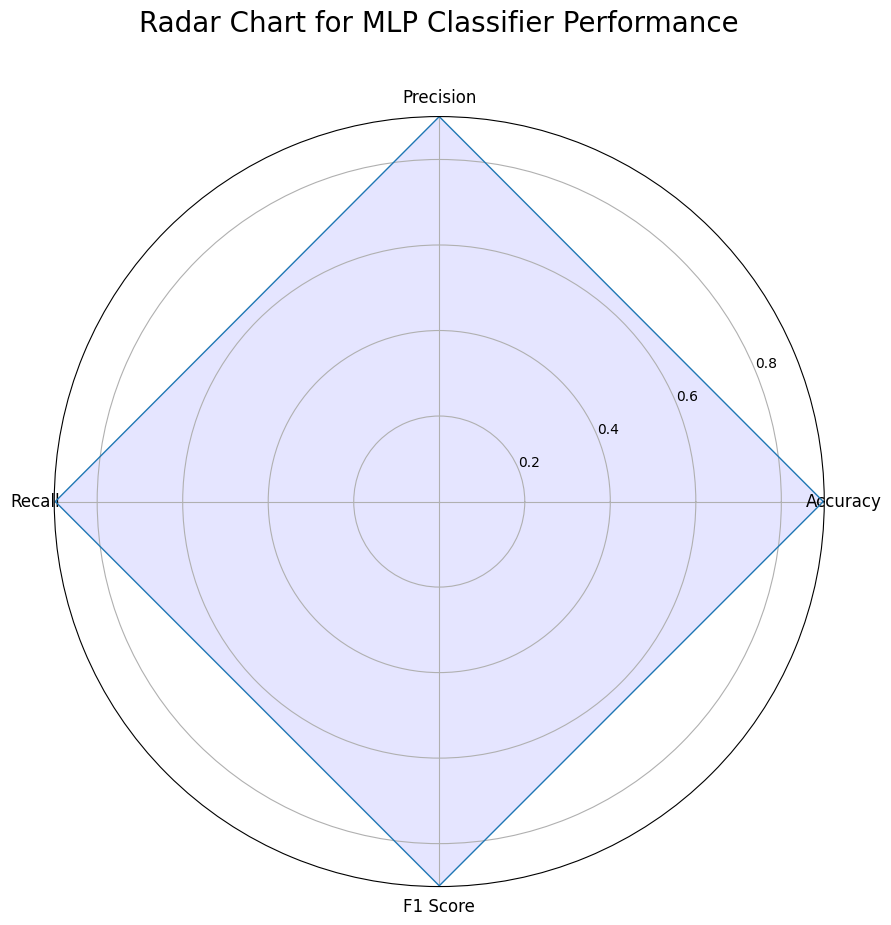

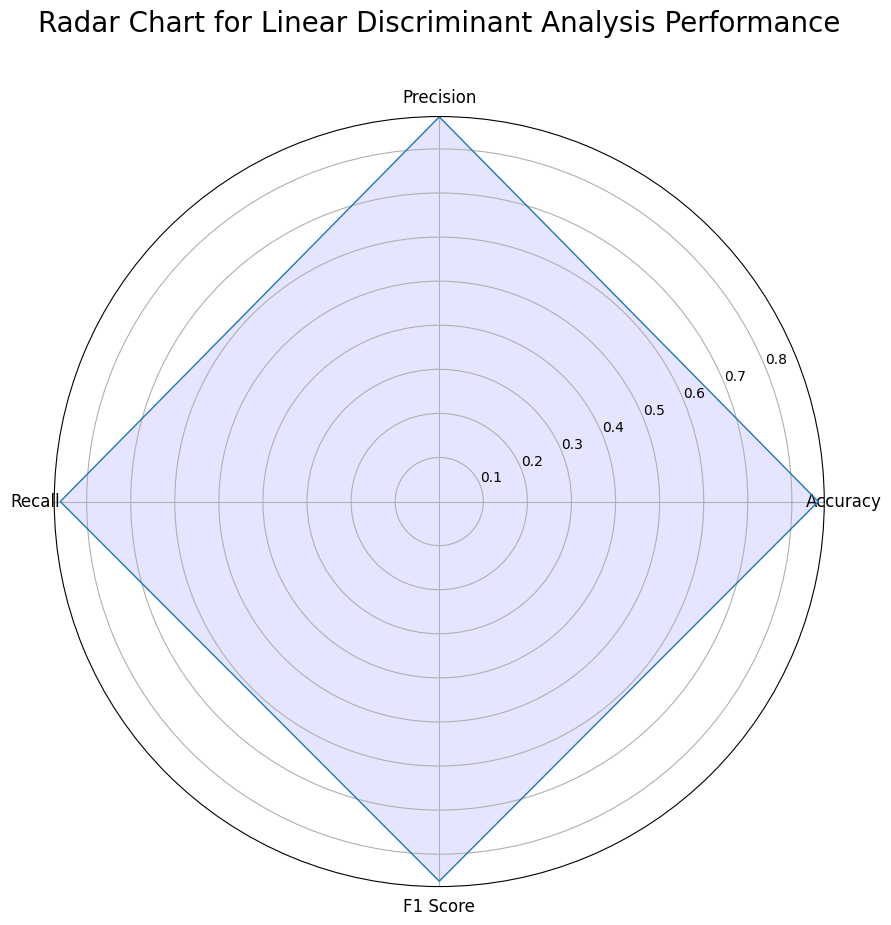

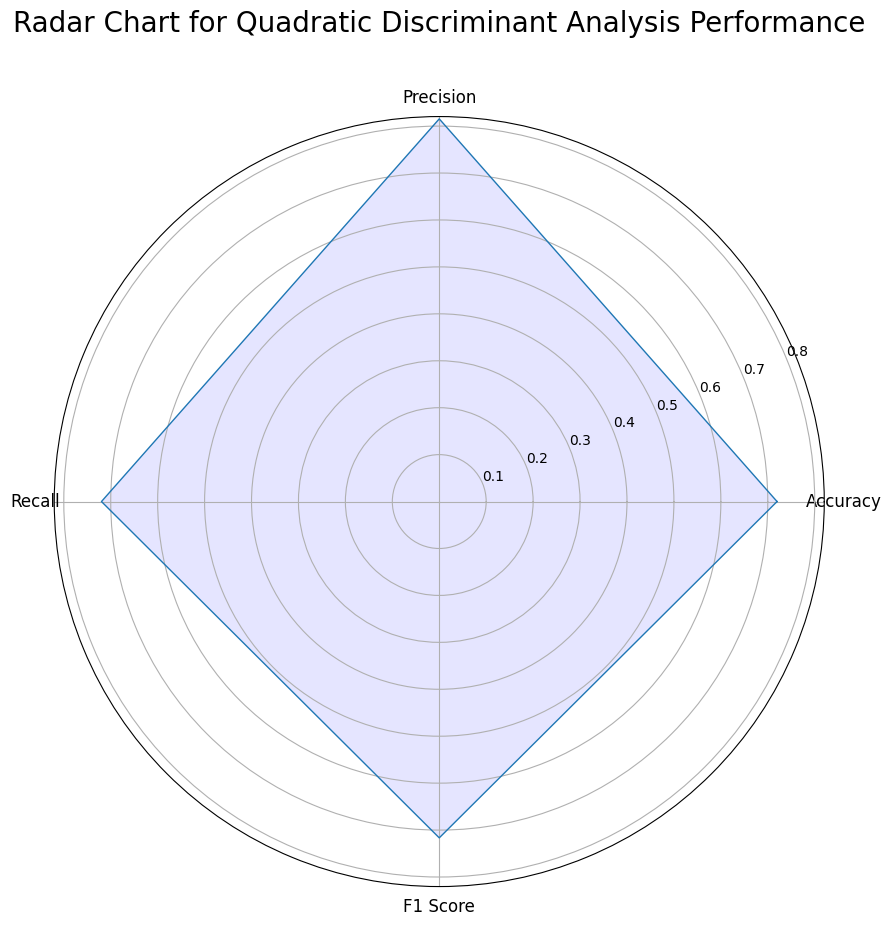

In [39]:
# Function to plot radar chart
def plot_radar_chart(df, model_name):
    categories = list(df.columns)
    values = df.iloc[df.index.get_loc(model_name)].values.tolist()

    angles = np.linspace(0, 2 * np.pi, len(categories), endpoint=False).tolist()
    values += values[:1]
    angles += angles[:1]

    plt.figure(figsize=(10, 10))
    ax = plt.subplot(111, polar=True)
    plt.xticks(angles[:-1], categories, color='black', size=12)
    ax.plot(angles, values, linewidth=1, linestyle='solid')
    ax.fill(angles, values, 'b', alpha=0.1)
    plt.title(f'Radar Chart for {model_name} Performance', size=20, color='black', y=1.1)
    plt.show()

# Example usage for each model
for model in models:
    plot_radar_chart(results_df, model)


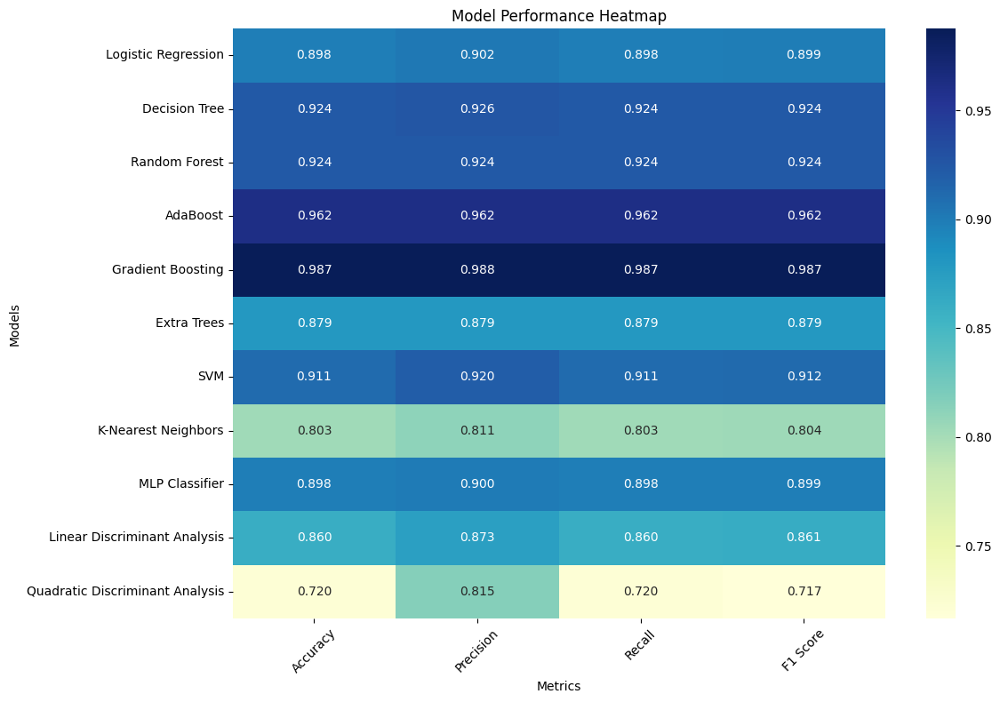

In [40]:
plt.figure(figsize=(12, 8))
sns.heatmap(results_df, annot=True, cmap='YlGnBu', fmt='.3f')
plt.title('Model Performance Heatmap')
plt.xlabel('Metrics')
plt.ylabel('Models')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


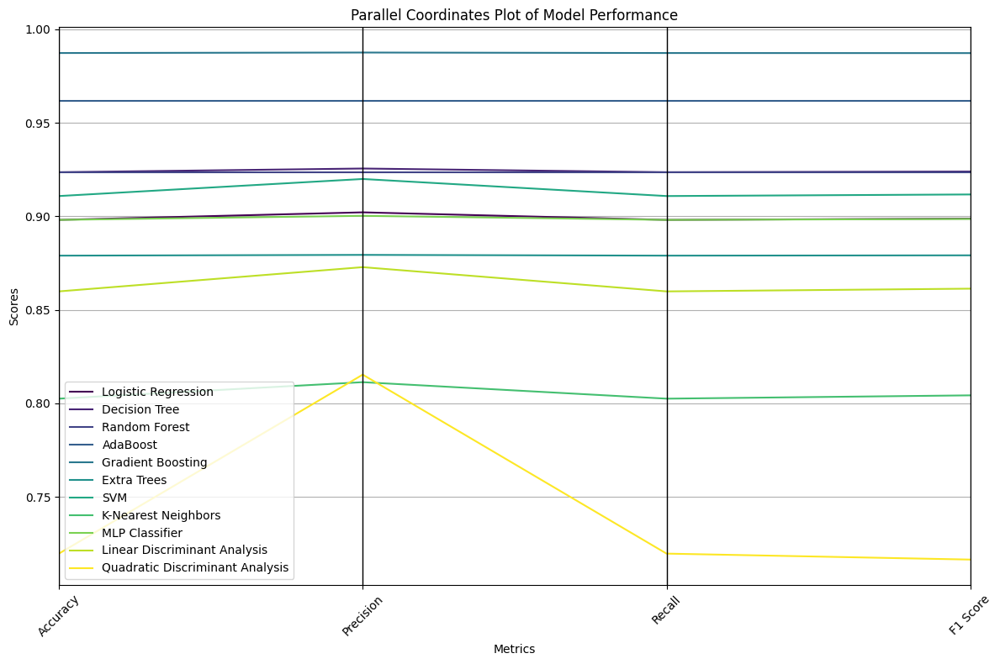

In [41]:
from pandas.plotting import parallel_coordinates

plt.figure(figsize=(12, 8))
parallel_coordinates(results_df.reset_index(), class_column='index', colormap='viridis')
plt.title('Parallel Coordinates Plot of Model Performance')
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.xticks(rotation=45)
plt.legend(loc='best')
plt.tight_layout()
plt.show()


<ipython-input-42-5ad7884065fe>:28: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


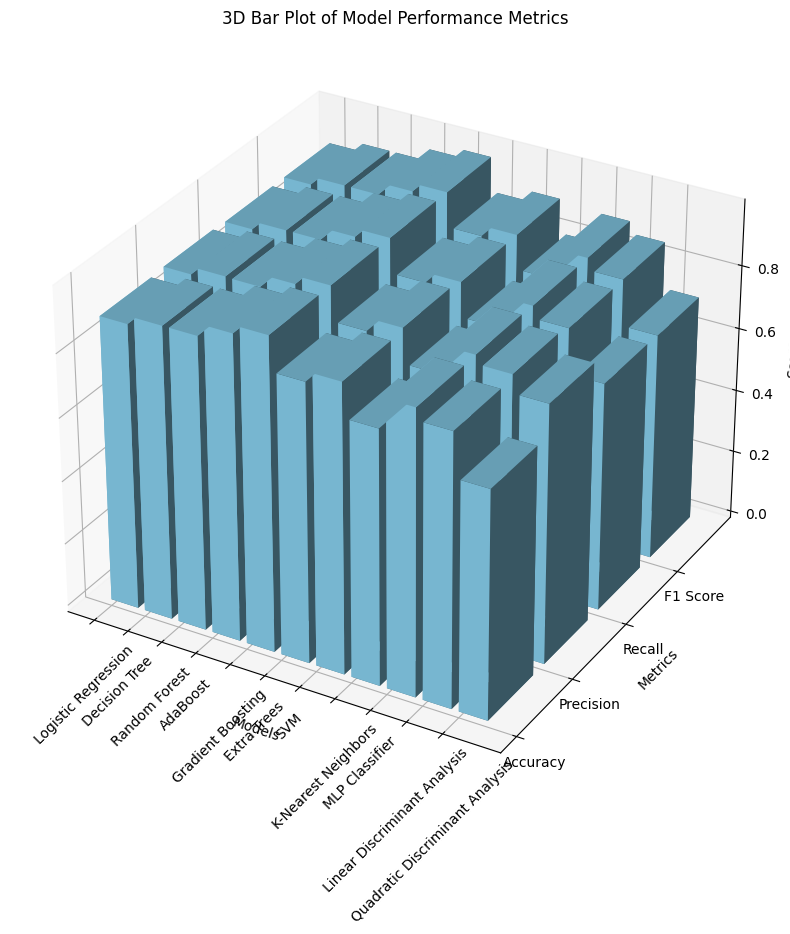

In [42]:
from mpl_toolkits.mplot3d import Axes3D

# Prepare data for plotting
x = np.arange(len(results_df.index))  # Models
y = np.arange(len(results_df.columns))  # Metrics
xpos, ypos = np.meshgrid(x, y, indexing='ij')
xpos = xpos.ravel()
ypos = ypos.ravel()
zpos = np.zeros_like(xpos)
dx = dy = 0.8
dz = results_df.values.ravel()

fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Plotting the 3D bar chart
ax.bar3d(xpos, ypos, zpos, dx, dy, dz, color='skyblue', zsort='average')

# Adding labels and title
ax.set_title('3D Bar Plot of Model Performance Metrics')
ax.set_xlabel('Models')
ax.set_ylabel('Metrics')
ax.set_zlabel('Scores')
ax.set_xticks(np.arange(len(x)))
ax.set_xticklabels(results_df.index, rotation=45)
ax.set_yticks(np.arange(len(y)))
ax.set_yticklabels(results_df.columns)
plt.tight_layout()
plt.show()


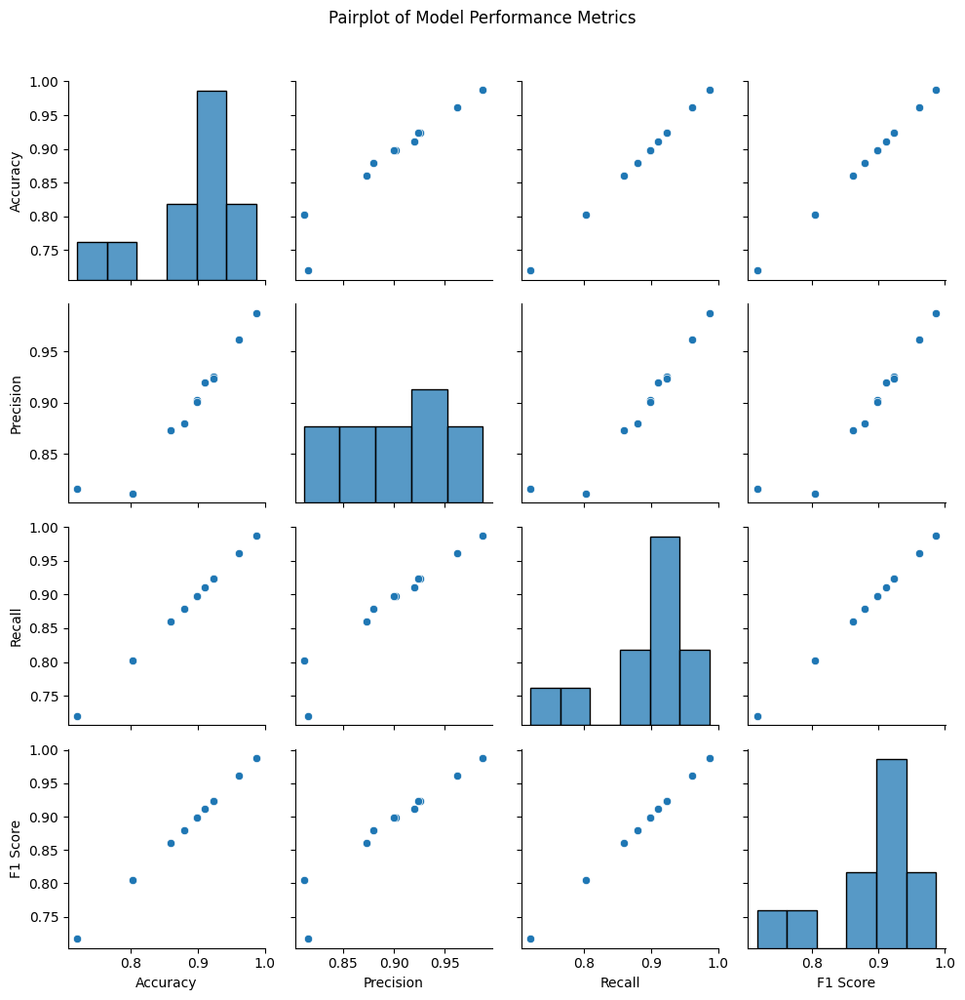

In [43]:
sns.pairplot(results_df)
plt.suptitle('Pairplot of Model Performance Metrics', y=1.02)
plt.tight_layout()
plt.show()
